Load csvs. 1 csv- one conversation. each row, one utterance. some consecutive speaker rows.

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import re

PROJECT_ROOT = Path.cwd()
WIRED_DIR = PROJECT_ROOT / "data" / "wired"

csv_paths = sorted(WIRED_DIR.glob("wired_*/*.csv"))

print(f"Found {len(csv_paths)} CSV files")
csv_paths[:10]

Found 105 CSV files


[PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_astro/wired_astro_12.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_astro/wired_astro_13.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_astro/wired_astro_14.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_astro/wired_astro_15.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_astro/wired_astro_16.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_blockchain/wired_blockchain_12.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_blockchain/wired_blockchain_13.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_blockchain/wired_blockchain_14.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_blockchain/wired_blockchain_15.csv'),
 PosixPath('/Users/yume/PycharmProjects/horizons_2/data/wired/wired_blockchain/wired_blockchain_

In [2]:
def parse_wired_path(path):
    """
    Example:
    data/wired/wired_astro/wired_astro_12.csv
    """
    folder_name = path.parent.name
    file_stem = path.stem

    video_id = re.sub(r"^wired_", "", folder_name)

    match = re.search(r"_(\d+)$", file_stem)
    file_number = int(match.group(1)) if match else None

    return {
        "dataset": "wired",
        "video_id": video_id,
        "file_number": file_number,
        "conversation_id": file_stem,
        "source_file": str(path.relative_to(PROJECT_ROOT))
    }

In [3]:
raw_frames = []

for path in csv_paths:
    df = pd.read_csv(path)
    metadata = parse_wired_path(path)

    # Preserve original within-file row order
    df["raw_row_id"] = np.arange(len(df))

    for column, value in metadata.items():
        df[column] = value

    raw_frames.append(df)

wired_raw = pd.concat(
    raw_frames,
    ignore_index=True,
    sort=False
)

wired_raw.shape

(6384, 10)

In [4]:
for path in csv_paths:
    try:
        df = pd.read_csv(path)
        print("OK:", path.name)
    except pd.errors.ParserError as error:
        print("ERROR:", path)
        print(error)

OK: wired_astro_12.csv
OK: wired_astro_13.csv
OK: wired_astro_14.csv
OK: wired_astro_15.csv
OK: wired_astro_16.csv
OK: wired_blockchain_12.csv
OK: wired_blockchain_13.csv
OK: wired_blockchain_14.csv
OK: wired_blockchain_15.csv
OK: wired_blockchain_16.csv
OK: wired_crispr_12.csv
OK: wired_crispr_13.csv
OK: wired_crispr_14.csv
OK: wired_crispr_15.csv
OK: wired_crispr_16.csv
OK: wired_dimension_12.csv
OK: wired_dimension_13.csv
OK: wired_dimension_14.csv
OK: wired_dimension_15.csv
OK: wired_dimension_16.csv
OK: wired_fractal_12.csv
OK: wired_fractal_13.csv
OK: wired_fractal_14.csv
OK: wired_fractal_15.csv
OK: wired_fractal_16.csv
OK: wired_gravity_12.csv
OK: wired_gravity_13.csv
OK: wired_gravity_14.csv
OK: wired_gravity_15.csv
OK: wired_gravity_16.csv
OK: wired_hacking_12.csv
OK: wired_hacking_13.csv
OK: wired_hacking_14.csv
OK: wired_hacking_15.csv
OK: wired_hacking_16.csv
OK: wired_infinity_12.csv
OK: wired_infinity_13.csv
OK: wired_infinity_14.csv
OK: wired_infinity_15.csv
OK: wired_i

In [5]:
schema_rows = []

for path in csv_paths:
    df = pd.read_csv(path)

    schema_rows.append({
        "source_file": path.name,
        "folder": path.parent.name,
        "n_rows": len(df),
        "columns": tuple(df.columns)
    })

schema_df = pd.DataFrame(schema_rows)

schema_df.head()

,source_file,folder,n_rows,columns
0,wired_astro_12.csv,wired_astro,56,"(Sequence, Speaker, Utterance, Notes)"
1,wired_astro_13.csv,wired_astro,53,"(Sequence, Speaker, Utterance, Notes)"
2,wired_astro_14.csv,wired_astro,52,"(Sequence, Speaker, Utterance, Notes)"
3,wired_astro_15.csv,wired_astro,67,"(Sequence, Speaker, Utterance, Notes)"
4,wired_astro_16.csv,wired_astro,42,"(Sequence, Speaker, Utterance, Notes)"


In [6]:
def parse_wired_path(path):
    """
    Example:
    data/wired/wired_astro/wired_astro_12.csv
    """
    folder_name = path.parent.name
    file_stem = path.stem

    video_id = re.sub(r"^wired_", "", folder_name)

    match = re.search(r"_(\d+)$", file_stem)
    file_number = int(match.group(1)) if match else None

    return {
        "dataset": "wired",
        "video_id": video_id,
        "file_number": file_number,
        "conversation_id": file_stem,
        "source_file": str(path.relative_to(PROJECT_ROOT))
    }

In [7]:
raw_frames = []

for path in csv_paths:
    df = pd.read_csv(path)
    metadata = parse_wired_path(path)

    # Preserve original within-file row order
    df["raw_row_id"] = np.arange(len(df))

    for column, value in metadata.items():
        df[column] = value

    raw_frames.append(df)

wired_raw = pd.concat(
    raw_frames,
    ignore_index=True,
    sort=False
)

wired_raw.shape

(6384, 10)

table with all utterances, all conversations

In [8]:
wired_raw.head()

,Sequence,Speaker,Utterance,Notes,raw_row_id,dataset,video_id,file_number,conversation_id,source_file
0,1,Speaker 2 (child),Hi.,NaN,0,wired,astro,12,wired_astro_12,data/wired/wired_astro/wired_astro_12.csv
1,2,Speaker 1 (Janna Levin),"Hi, welcome.",NaN,1,wired,astro,12,wired_astro_12,data/wired/wired_astro/wired_astro_12.csv
2,3,Speaker 1 (Janna Levin),Tell me your name.,NaN,2,wired,astro,12,wired_astro_12,data/wired/wired_astro/wired_astro_12.csv
3,4,Speaker 2 (child),Jude.,NaN,3,wired,astro,12,wired_astro_12,data/wired/wired_astro/wired_astro_12.csv
4,5,Speaker 1 (Janna Levin),I wanted to ask you if you have ever heard of ...,NaN,4,wired,astro,12,wired_astro_12,data/wired/wired_astro/wired_astro_12.csv


In [9]:
#rename columns, minimally clean text
wired_raw = wired_raw.rename(columns={
    "Speaker": "speaker_raw",
    "Utterance": "text"
})
wired_raw["text"] = (
    wired_raw["text"]
    .astype("string")
    .str.replace(r"\s+", " ", regex=True)
    .str.strip()
)

wired_raw = wired_raw[
    wired_raw["text"].notna() &
    wired_raw["text"].ne("")
].copy()

In [10]:
level_map = {
    12: (0, "child"),
    13: (1, "teenager"),
    14: (2, "undergraduate"),
    15: (3, "graduate"),
    16: (4, "expert")
}

In [11]:
wired_raw["level"] = wired_raw["file_number"].map(
    lambda x: level_map[x][0]
)

wired_raw["level_label"] = wired_raw["file_number"].map(
    lambda x: level_map[x][1]
)

In [12]:
#order levels
level_order = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert"
]

wired_raw["level_label"] = pd.Categorical(
    wired_raw["level_label"],
    categories=level_order,
    ordered=True
)

In [13]:
(
    wired_raw[
        ["video_id", "conversation_id", "speaker_raw"]
    ]
    .drop_duplicates()
    .sort_values(["video_id", "conversation_id", "speaker_raw"])
)

,video_id,conversation_id,speaker_raw
1,astro,wired_astro_12,Speaker 1 (Janna Levin)
0,astro,wired_astro_12,Speaker 2 (child)
56,astro,wired_astro_13,Speaker 1 (Janna Levin)
57,astro,wired_astro_13,Speaker 3 (teen)
110,astro,wired_astro_14,Speaker 1 (Janna Levin)
...,...,...,...
6093,zero,wired_zero_14,Speaker 4 (college student)
6207,zero,wired_zero_15,Speaker 1 (Amit Sahai)
6209,zero,wired_zero_15,Speaker 5 (grad student)
6277,zero,wired_zero_16,Speaker 1 (Amit Sahai)


In [14]:
'''
speaker_mapping = {
    #astro
     "Speaker 1 (Janna Levin)": "A",
     "Speaker 2 (child)": "B",
     "Speaker 3 (teen)": "B",
    "Speaker 4 (college student)": "B",
    "Speaker 5 (grad student)": "B",
    "Speaker 6 (expert)": "B",
    #blockchain
    "Speaker 1 (Bettina Warburg)": "A",
    "Speaker 2 (Child)": "B",
    "Speaker 3 (Teen - Ian)": "B",
    "Speaker 4 (College Student)": "B",
    "Speaker 5 (Grad Student)": "B",
    "Speaker 6 (Expert)": "B",
    #crispr
    "Speaker 1 (Neville Sanjana)": "A",
    "Speaker 2 (Tegan - Child)": "B",
    "Speaker 3 (Bella - Teenager)": "B",
    "Speaker 4 (Christopher - Student)": "B",
    "Speaker 5 (Lauren Schiff)": "B",
    "Speaker 6 (Matthew Canver)": "B",
    #dimension
    "Speaker 1 (Sean Carroll PhD)": "A",
    #fractal
    "Speaker 1 (Keenan Crane Phd)": "A",
    #gravity
    "Speaker 1 (Janna Levin)": "A",
    "Speaker 2 (Bonét Sofía Kanayet)": "B",
    "Speaker 3 (Maria Teresa Furtado)": "B",
    "Speaker 4 (Lisa Chan)": "B",
    "Speaker 5 (Will Gyory)": "B",
    "Speaker 6 (Matthew Kleban)": "B",
    #hacking
    "Speaker 1 (Samy Kamkar)": "A",
    #infinity
    "Speaker 1 (Emily Riehl)": "A",
    #internet
    "Speaker 1 (Jim Kurose)": "A",
    #laser
    "Speaker 1 (Donna Strickland)": "A",
    "Speaker 2 (Harmoni - Child)": "B",
    "Speaker 3 (Eli Kaplan - Teenager)": "B",
    "Speaker 4 (Caitlin - Student)": "B",
    "Speaker 5 (Aditya - Grad Student)": "B",
    "Speaker 6 (Mike Campbell)": "B",
    #machine
    "Speaker 1 (Hilary Mason)": "A",
    #memory
    "Speaker 1 (Daphna Shohamy)": "A",
    #moravec
    "Speaker 1 (Chelsea Finn)": "A",
    #nano
    "Speaker 1 (Dr. George S. Tulevski)": "A",
    #neuro
    "Speaker 1 (Dr. Bobby Kasthuri)": "A",
    "Speaker 2 (child - Daniel)": "B",
    "Speaker 3 (Jabez Griggs)": "B",
    "Speaker 4 (Elena Dowling)": "B",
    "Speaker 5 (Mala Ananth)": "B",
    "Speaker 6 (Russell Hanson)": "B",
    "Speaker 3 (teen)": "B",
    "Speaker 3 (teen)": "B",
    "Speaker 3 (teen)": "B",
    "Speaker 3 (teen)": "B",


}
'''
is_expert = wired_raw["speaker_raw"].str.contains(
    r"\bSpeaker\s*1\b",
    case=False,
    na=False
)

wired_raw["speaker"] = np.where(is_expert, "A", "B")
wired_raw["speaker_role"] = np.where(
    is_expert,
    "expert",
    "partner"
)




wired_raw["speaker_role"] = wired_raw["speaker"].map({
    "A": "expert",
    "B": "partner"
})

In [15]:
display(
    wired_raw.loc[
        wired_raw["raw_row_id"] == 4458
    ].T
)

""
Sequence
speaker_raw
text
Notes
raw_row_id
dataset
video_id
file_number
conversation_id
source_file


collapse consecutive rows from same speaker-> one row is one full conversational turn not an utterance.

In [16]:
def collapse_consecutive_speaker_rows(group):
    group = group.sort_values("raw_row_id").copy()

    # A new turn starts whenever the speaker changes
    group["turn_block"] = (
        group["speaker"].ne(group["speaker"].shift())
    ).cumsum()

    collapsed = (
        group.groupby("turn_block", sort=False)
        .agg(
            dataset=("dataset", "first"),
            video_id=("video_id", "first"),
            conversation_id=("conversation_id", "first"),
            file_number=("file_number", "first"),
            level=("level", "first"),
            level_label=("level_label", "first"),
            speaker=("speaker", "first"),
            speaker_raw=("speaker_raw", "first"),
            speaker_role=("speaker_role", "first"),
            text=("text", " ".join),
            source_file=("source_file", "first"),
            raw_row_start=("raw_row_id", "min"),
            raw_row_end=("raw_row_id", "max")
        )
        .reset_index(drop=True)
    )

    collapsed["turn_id"] = np.arange(len(collapsed))
    collapsed["n_words"] = collapsed["text"].str.split().str.len()

    n_turns = len(collapsed)
    #NORMALIZE TIME
    collapsed["normalized_time"] = (
        collapsed["turn_id"] / max(n_turns - 1, 1)
    )

    return collapsed

In [17]:
turns = (
    wired_raw
    .groupby("conversation_id", group_keys=False, observed=True)
    .apply(collapse_consecutive_speaker_rows)
    .reset_index(drop=True)
)

/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/2918663627.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(collapse_consecutive_speaker_rows)


In [18]:
turns

,dataset,video_id,conversation_id,file_number,level,level_label,speaker,speaker_raw,speaker_role,text,source_file,raw_row_start,raw_row_end,turn_id,n_words,normalized_time
0,wired,talia,wired_Talia_12,12,0,child,B,Speaker 2 (Genesis - child),partner,what's this,data/wired/wired_talia/wired_Talia_12.csv,0,0,0,2,0.000000
1,wired,talia,wired_Talia_12,12,0,child,A,Speaker 1 (Talia Gershon),expert,yeah what do you think that is,data/wired/wired_talia/wired_Talia_12.csv,1,1,1,7,0.076923
2,wired,talia,wired_Talia_12,12,0,child,B,Speaker 2 (Genesis - child),partner,fancy chandelier,data/wired/wired_talia/wired_Talia_12.csv,2,2,2,2,0.153846
3,wired,talia,wired_Talia_12,12,0,child,A,Speaker 1 (Talia Gershon),expert,i think so too we jokingly call it the chandel...,data/wired/wired_talia/wired_Talia_12.csv,3,5,3,20,0.230769
4,wired,talia,wired_Talia_12,12,0,child,B,Speaker 2 (Genesis - child),partner,it's a clunt,data/wired/wired_talia/wired_Talia_12.csv,6,6,4,3,0.307692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2503,wired,zero,wired_zero_16,16,4,expert,A,Speaker 1 (Amit Sahai),expert,That even quantum computers can't break. And t...,data/wired/wired_zero/wired_zero_16.csv,97,99,44,30,0.916667
2504,wired,zero,wired_zero_16,16,4,expert,B,Speaker 6 (expert),partner,But I'm sure they will motivate beautiful math...,data/wired/wired_zero/wired_zero_16.csv,100,100,45,8,0.937500
2505,wired,zero,wired_zero_16,16,4,expert,A,Speaker 1 (Amit Sahai),expert,"Yes, that's right. You know, one of the great ...",data/wired/wired_zero/wired_zero_16.csv,101,102,46,23,0.958333
2506,wired,zero,wired_zero_16,16,4,expert,B,Speaker 6 (expert),partner,That's right.,data/wired/wired_zero/wired_zero_16.csv,103,103,47,2,0.979167


In [19]:
turns = turns[
    [
        "dataset",
        "video_id",
        "conversation_id",
        "file_number",
        "level",
        "level_label",
        "turn_id",
        "normalized_time",
        "speaker",
        "speaker_raw",
        "speaker_role",
        "text",
        "n_words",
        "raw_row_start",
        "raw_row_end",
        "source_file"
    ]
].sort_values(
    ["video_id", "level", "turn_id"]
).reset_index(drop=True)

In [20]:
#validation checks
# Every conversation should have exactly two standardized speakers
speaker_counts = (
    turns.groupby("conversation_id")["speaker"]
    .nunique()
)

assert speaker_counts.eq(2).all(), (
    "Some conversations do not have exactly two speakers:\n"
    f"{speaker_counts[speaker_counts.ne(2)]}"
)

In [21]:
# Conversation-level overview
conversation_summary = (
    turns.groupby(
        [
            "video_id",
            "conversation_id",
            "level",
            "level_label"
        ],
        observed=True
    )
    .agg(
        n_turns=("turn_id", "size"),
        total_words=("n_words", "sum"),
        speakers=("speaker", "nunique")
    )
    .reset_index()
)

conversation_summary.head(10)

,video_id,conversation_id,level,level_label,n_turns,total_words,speakers
0,astro,wired_astro_12,0,child,23,646,2
1,astro,wired_astro_13,1,teenager,13,796,2
2,astro,wired_astro_14,2,undergraduate,17,897,2
3,astro,wired_astro_15,3,graduate,29,1187,2
4,astro,wired_astro_16,4,expert,14,886,2
5,blockchain,wired_blockchain_12,0,child,9,190,2
6,blockchain,wired_blockchain_13,1,teenager,19,373,2
7,blockchain,wired_blockchain_14,2,undergraduate,7,414,2
8,blockchain,wired_blockchain_15,3,graduate,13,548,2
9,blockchain,wired_blockchain_16,4,expert,17,1359,2


wraps up basic cleaning and organization

# embedding

segments table

each row of the

In [22]:
turns["n_words"].describe(
    percentiles=[0.50, 0.75, 0.90, 0.95, 0.99]
)

count    2508.000000
mean       35.373206
std        46.117679
min         1.000000
50%        19.000000
75%        49.000000
90%        90.000000
95%       124.000000
99%       213.000000
max       468.000000
Name: n_words, dtype: float64

In [23]:
(
    turns
    .nlargest(10, "n_words")
    [
        [
            "conversation_id",
            "turn_id",
            "speaker",
            "speaker_role",
            "n_words",
            "text",
        ]
    ]
)

,conversation_id,turn_id,speaker,speaker_role,n_words,text
2268,wired_time_13,10,A,expert,468,"It's much longer, right? This one's going tick..."
1378,wired_memory_14,8,A,expert,440,The best way to kind of think about that disti...
1159,wired_laser_14,8,A,expert,366,Well I brought a little bit of a prop to expla...
668,wired_gravity_14,6,A,expert,327,So when you say it's an inverse square law. Th...
398,wired_dimension_15,20,A,expert,319,That's the good news. The bad news is that it ...
2279,wired_time_14,8,A,expert,314,"Yes. If I take a film of that electron, it's a..."
155,wired_blockchain_16,11,B,partner,305,"Yes, and one of the most interesting ideas to ..."
1380,wired_memory_14,10,A,expert,296,"Yeah, you know things are kind of breaking dow..."
653,wired_gravity_13,28,A,expert,282,So let's say you and Marina are floating in sp...
2079,wired_sleep_15,12,A,expert,282,The best way to think about this transition is...


some of the turns are super long so segment so max word count of each segment is 150 words

In [24]:
import re

MAX_SEGMENT_WORDS = 150


def count_words(text):
    """Count whitespace-separated words."""
    return len(str(text).split())


def normalize_whitespace(text):
    """Remove repeated whitespace without changing the words."""
    return re.sub(r"\s+", " ", str(text)).strip()


def split_oversized_unit(text, max_words=MAX_SEGMENT_WORDS):
    """
    Split a single sentence or text unit that exceeds the maximum length.
    This is the fallback for exceptionally long sentences.
    """
    words = text.split()

    return [
        " ".join(words[start:start + max_words])
        for start in range(0, len(words), max_words)
    ]


def split_turn_text(text, max_words=MAX_SEGMENT_WORDS):
    """
    Split one turn into non-overlapping, sentence-preserving segments.
    """
    text = normalize_whitespace(text)

    if not text:
        return []

    # Most turns should pass through unchanged.
    if count_words(text) <= max_words:
        return [text]

    # Provisional sentence splitting based on terminal punctuation.
    sentences = re.split(r"(?<=[.!?])\s+", text)
    sentences = [s.strip() for s in sentences if s.strip()]

    # Guarantee that no individual unit exceeds the maximum.
    units = []

    for sentence in sentences:
        if count_words(sentence) <= max_words:
            units.append(sentence)
        else:
            units.extend(
                split_oversized_unit(sentence, max_words=max_words)
            )

    # Greedily combine consecutive sentences without exceeding the maximum.
    segments = []
    current_units = []
    current_words = 0

    for unit in units:
        unit_words = count_words(unit)

        if current_units and current_words + unit_words > max_words:
            segments.append(" ".join(current_units))
            current_units = [unit]
            current_words = unit_words
        else:
            current_units.append(unit)
            current_words += unit_words

    if current_units:
        segments.append(" ".join(current_units))

    return segments

In [25]:
example_text = turns.loc[turns["n_words"].idxmax(), "text"]
example_segments = split_turn_text(example_text)

print("Original words:", count_words(example_text))
print("Number of segments:", len(example_segments))
print("Segment lengths:", [count_words(x) for x in example_segments])

for i, segment in enumerate(example_segments, start=1):
    print(f"\n--- Segment {i} ---")
    print(segment)

Original words: 468
Number of segments: 4
Segment lengths: [129, 139, 140, 60]

--- Segment 1 ---
It's much longer, right? This one's going tick tock. This one's going to go tick tock. In fact, we can figure out the ratio. Let's consider time on the stationary clock compared to time on this moving clock. Well, that ratio is going to be the ratio of the lengths. Then this would be given by D over L. More time on the stationary because it's longer distance on the moving clock. Well, this length over here, that's the same as this L over here. All right? So we want D over L. Now, you may have recalled that in trigonometry, there's a name for L over D. Sin of theta, opposite is L, hypotenuse is D, right? And so, this ratio is just 1 over sin of theta.

--- Segment 2 ---
So if we can figure out 1 over sin theta, we'll have our beautiful formula for the ratio of time on the stationary clock to time on the moving clock. We just need one other fact. The speed of light along this diagonal is equ

construct segments table

In [26]:
segment_records = []

# Preserve the existing order of the turns table.
ordered_turns = turns.reset_index(drop=True).copy()
ordered_turns["_turn_order"] = range(len(ordered_turns))

for _, turn in ordered_turns.iterrows():
    turn_segments = split_turn_text(
        turn["text"],
        max_words=MAX_SEGMENT_WORDS,
    )

    n_segments = len(turn_segments)

    for segment_number, segment_text in enumerate(
        turn_segments,
        start=1,
    ):
        record = {
            # Conversation metadata
            "dataset": turn["dataset"],
            "video_id": turn["video_id"],
            "conversation_id": turn["conversation_id"],
            "file_number": turn["file_number"],
            "level": turn["level"],
            "level_label": turn["level_label"],

            # Turn and sequence metadata
            "turn_id": turn["turn_id"],
            "segment_in_turn": segment_number,
            "n_segments_in_turn": n_segments,
            "_turn_order": turn["_turn_order"],
            "normalized_time": turn["normalized_time"],

            # Speaker metadata
            "speaker": turn["speaker"],
            "speaker_raw": turn["speaker_raw"],
            "speaker_role": turn["speaker_role"],

            # Segment content
            "text": segment_text,
            "n_words": count_words(segment_text),

            # Original-turn information
            "turn_n_words": turn["n_words"],
            "is_split_turn": n_segments > 1,

            # Provenance
            "raw_row_start": turn["raw_row_start"],
            "raw_row_end": turn["raw_row_end"],
            "source_file": turn["source_file"],
        }

        segment_records.append(record)

segments = pd.DataFrame(segment_records)

In [27]:
segments

,dataset,video_id,conversation_id,file_number,level,level_label,turn_id,segment_in_turn,n_segments_in_turn,_turn_order,...,speaker,speaker_raw,speaker_role,text,n_words,turn_n_words,is_split_turn,raw_row_start,raw_row_end,source_file
0,wired,astro,wired_astro_12,12,0,child,0,1,1,0,...,B,Speaker 2 (child),partner,Hi.,1,1,False,0,0,data/wired/wired_astro/wired_astro_12.csv
1,wired,astro,wired_astro_12,12,0,child,1,1,1,1,...,A,Speaker 1 (Janna Levin),expert,"Hi, welcome. Tell me your name.",6,6,False,1,2,data/wired/wired_astro/wired_astro_12.csv
2,wired,astro,wired_astro_12,12,0,child,2,1,1,2,...,B,Speaker 2 (child),partner,Jude.,1,1,False,3,3,data/wired/wired_astro/wired_astro_12.csv
3,wired,astro,wired_astro_12,12,0,child,3,1,1,3,...,A,Speaker 1 (Janna Levin),expert,I wanted to ask you if you have ever heard of ...,14,14,False,4,4,data/wired/wired_astro/wired_astro_12.csv
4,wired,astro,wired_astro_12,12,0,child,4,1,1,4,...,B,Speaker 2 (child),partner,"Yeah, I think that they're scary and cool. 'Ca...",33,33,False,5,7,data/wired/wired_astro/wired_astro_12.csv
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2588,wired,zero,wired_zero_16,16,4,expert,44,1,1,2503,...,A,Speaker 1 (Amit Sahai),expert,That even quantum computers can't break. And t...,30,30,False,97,99,data/wired/wired_zero/wired_zero_16.csv
2589,wired,zero,wired_zero_16,16,4,expert,45,1,1,2504,...,B,Speaker 6 (expert),partner,But I'm sure they will motivate beautiful math...,8,8,False,100,100,data/wired/wired_zero/wired_zero_16.csv
2590,wired,zero,wired_zero_16,16,4,expert,46,1,1,2505,...,A,Speaker 1 (Amit Sahai),expert,"Yes, that's right. You know, one of the great ...",23,23,False,101,102,data/wired/wired_zero/wired_zero_16.csv
2591,wired,zero,wired_zero_16,16,4,expert,47,1,1,2506,...,B,Speaker 6 (expert),partner,That's right.,2,2,False,103,103,data/wired/wired_zero/wired_zero_16.csv


In [28]:
segments["segment_id"] = (
    segments["dataset"].astype(str)
    + "::"
    + segments["conversation_id"].astype(str)
    + "::turn_"
    + segments["turn_id"].astype(str)
    + "::segment_"
    + segments["segment_in_turn"].astype(str).str.zfill(2)
)

In [29]:
segment_columns = [
    "segment_id",
    "dataset",
    "video_id",
    "conversation_id",
    "file_number",
    "level",
    "level_label",
    "turn_id",
    "segment_in_turn",
    "n_segments_in_turn",
    "normalized_time",
    "speaker",
    "speaker_raw",
    "speaker_role",
    "text",
    "n_words",
    "turn_n_words",
    "is_split_turn",
    "raw_row_start",
    "raw_row_end",
    "source_file",
    "_turn_order",
]

segments = segments[segment_columns]

In [30]:
segment_number_check = (
    segments
    .groupby("_turn_order")["segment_in_turn"]
    .apply(lambda x: list(x) == list(range(1, len(x) + 1)))
)

assert segment_number_check.all()

In [31]:
segments["n_words"].describe(
    percentiles=[0.25, 0.50, 0.75, 0.90, 0.95, 0.99]
)

count    2593.000000
mean       34.213652
std        37.907262
min         1.000000
25%         6.000000
50%        19.000000
75%        51.000000
90%        91.000000
95%       124.000000
99%       147.000000
max       150.000000
Name: n_words, dtype: float64

## embedding

make one normalized 382 dim vector per segments row

In [32]:
import json
from pathlib import Path

import numpy as np
import pandas as pd
import sentence_transformers
from sentence_transformers import SentenceTransformer

MODEL_NAME = "sentence-transformers/all-MiniLM-L6-v2"

model = SentenceTransformer(MODEL_NAME)

print("Model:", MODEL_NAME)
print("Embedding dimensions:", model.get_sentence_embedding_dimension())
print("Maximum model tokens:", model.max_seq_length)
print("SentenceTransformers version:", sentence_transformers.__version__)

/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Model: sentence-transformers/all-MiniLM-L6-v2
Embedding dimensions: 384
Maximum model tokens: 256
SentenceTransformers version: 5.1.2


In [33]:
segments = segments.reset_index(drop=True).copy()

assert segments["segment_id"].is_unique
assert segments["text"].notna().all()
assert segments["text"].str.strip().ne("").all()

segments["embedding_idx"] = np.arange(len(segments))

segment_texts = segments["text"].astype(str).tolist()

print("Segments to embed:", len(segment_texts))

segments[
    ["embedding_idx", "segment_id", "speaker", "n_words", "text"]
].head()

Segments to embed: 2593


,embedding_idx,segment_id,speaker,n_words,text
0,0,wired::wired_astro_12::turn_0::segment_01,B,1,Hi.
1,1,wired::wired_astro_12::turn_1::segment_01,A,6,"Hi, welcome. Tell me your name."
2,2,wired::wired_astro_12::turn_2::segment_01,B,1,Jude.
3,3,wired::wired_astro_12::turn_3::segment_01,A,14,I wanted to ask you if you have ever heard of ...
4,4,wired::wired_astro_12::turn_4::segment_01,B,33,"Yeah, I think that they're scary and cool. 'Ca..."


In [34]:
segments["n_model_tokens"] = [
    len(
        model.tokenizer(
            text,
            add_special_tokens=True,
            truncation=False,
        )["input_ids"]
    )
    for text in segment_texts
]

segments["would_truncate"] = (
    segments["n_model_tokens"] > model.max_seq_length
)

print(
    "Maximum token count:",
    segments["n_model_tokens"].max()
)

print(
    "Segments exceeding model limit:",
    segments["would_truncate"].sum()
)

Maximum token count: 206
Segments exceeding model limit: 0


In [35]:
#generate embeddings
E_segments = model.encode(
    segment_texts,
    batch_size=32,
    show_progress_bar=True,
    convert_to_numpy=True,
    normalize_embeddings=True,
)

E_segments = E_segments.astype(np.float32)

Batches:   0%|          | 0/82 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
Batches: 100%|██████████| 82/82 [00:08<00:00,  9.91it/s]


In [36]:
#validate embedding matrix
expected_dimension = model.get_sentence_embedding_dimension()

assert E_segments.shape == (
    len(segments),
    expected_dimension,
)

assert np.isfinite(E_segments).all()

embedding_norms = np.linalg.norm(E_segments, axis=1)

print("Embedding matrix shape:", E_segments.shape)
print("Minimum norm:", embedding_norms.min())
print("Maximum norm:", embedding_norms.max())
print("Mean norm:", embedding_norms.mean())

assert np.allclose(
    embedding_norms,
    1.0,
    atol=1e-5,
)

Embedding matrix shape: (2593, 384)
Minimum norm: 0.9999999
Maximum norm: 1.0000001
Mean norm: 1.0


In [37]:
#save output
OUTPUT_DIR = Path("horizons2_embeddings")
OUTPUT_DIR.mkdir(exist_ok=True)

np.save(
    OUTPUT_DIR / "E_segments_all_MiniLM_L6_v2.npy",
    E_segments,
    allow_pickle=False,
)

segments.to_csv(
    OUTPUT_DIR / "segments_with_embedding_index.csv",
    index=False,
)

embedding_config = {
    "model_name": MODEL_NAME,
    "sentence_transformers_version": sentence_transformers.__version__,
    "embedding_dimension": int(expected_dimension),
    "normalized": True,
    "number_of_embeddings": int(len(E_segments)),
    "maximum_model_tokens": int(model.max_seq_length),
    "matrix_file": "E_segments_all_MiniLM_L6_v2.npy",
    "index_column": "embedding_idx",
    "identifier_column": "segment_id",
}

with open(
    OUTPUT_DIR / "embedding_config.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        embedding_config,
        file,
        indent=2,
    )

## utterances table -> embed utterances

In [35]:
import re
import numpy as np
import pandas as pd


def count_words(text):
    return len(
        re.findall(
            r"\b[\w'-]+\b",
            str(text),
        )
    )


def create_utterances_table(wired_raw):
    """
    Create one canonical row per original transcript utterance.

    The function does not concatenate adjacent utterances.
    """

    utterances = (
        wired_raw
        .copy()
        .reset_index(drop=False)
        .rename(columns={"index": "_original_dataframe_row"})
    )

    # Accommodate either the original CSV column names or the
    # standardized names already present in wired_raw.
    rename_map = {}

    aliases = {
        "Sequence": "sequence",
        "Utterance": "text",
        "Speaker": "speaker_raw",
        "Notes": "notes",
    }

    for old_name, new_name in aliases.items():
        if (
            old_name in utterances.columns
            and new_name not in utterances.columns
        ):
            rename_map[old_name] = new_name

    utterances = utterances.rename(columns=rename_map)

    # If canonical speaker has not already been created, use
    # the original speaker label.
    if "speaker" not in utterances.columns:
        utterances["speaker"] = utterances["speaker_raw"]

    # Stable source order.
    if "sequence" not in utterances.columns:
        utterances["sequence"] = (
            utterances
            .groupby(
                ["dataset", "conversation_id"],
                sort=False,
            )
            .cumcount()
            .add(1)
        )

    utterances["_sequence_numeric"] = pd.to_numeric(
        utterances["sequence"],
        errors="coerce",
    )

    utterances["_sequence_numeric"] = (
        utterances["_sequence_numeric"]
        .fillna(utterances["_original_dataframe_row"])
    )

    conversation_keys = [
        "dataset",
        "conversation_id",
    ]

    sort_columns = [
        *conversation_keys,
        "_sequence_numeric",
        "_original_dataframe_row",
    ]

    utterances = (
        utterances
        .sort_values(
            sort_columns,
            kind="mergesort",
        )
        .reset_index(drop=True)
    )

    # Clean text without altering its linguistic contents.
    utterances["text"] = (
        utterances["text"]
        .fillna("")
        .astype(str)
        .str.strip()
        .str.replace(r"\s+", " ", regex=True)
    )

    if utterances["text"].eq("").any():
        empty_rows = utterances.loc[
            utterances["text"].eq(""),
            [
                *conversation_keys,
                "sequence",
            ],
        ]

        raise ValueError(
            "Empty utterance text found:\n"
            + empty_rows.to_string(index=False)
        )

    # Reconstruct turn membership without concatenating anything.
    # A new turn begins whenever the speaker changes.
    speaker_changed = (
        utterances
        .groupby(
            conversation_keys,
            sort=False,
        )["speaker"]
        .transform(
            lambda speakers:
                speakers.ne(speakers.shift())
        )
    )

    utterances["turn_id"] = (
        speaker_changed
        .astype(int)
        .groupby(
            [
                utterances[column]
                for column in conversation_keys
            ]
        )
        .cumsum()
    )

    # Position of the utterance inside its speaker turn.
    utterances["utterance_in_turn"] = (
        utterances
        .groupby(
            [
                *conversation_keys,
                "turn_id",
            ],
            sort=False,
        )
        .cumcount()
        .add(1)
    )

    # Position within the whole conversation.
    utterances["utterance_number"] = (
        utterances
        .groupby(
            conversation_keys,
            sort=False,
        )
        .cumcount()
        .add(1)
    )

    utterances["utterance_id"] = (
        utterances["dataset"].astype(str)
        + "::"
        + utterances["conversation_id"].astype(str)
        + "::utterance_"
        + utterances["utterance_number"]
            .astype(str)
            .str.zfill(3)
    )

    utterances["n_words"] = (
        utterances["text"]
        .map(count_words)
        .astype(int)
    )

    # Keep all utterances in the canonical table. This flag only
    # determines the primary geometry subset later.
    utterances["include_geometry_primary"] = (
        utterances["n_words"] >= 5
    )

    # This index will correspond exactly to rows of E_utterances.
    utterances["embedding_idx"] = np.arange(
        len(utterances),
        dtype=int,
    )

    preferred_columns = [
        "dataset",
        "video_id",
        "conversation_id",
        "file_number",
        "level",
        "level_label",
        "utterance_id",
        "utterance_number",
        "turn_id",
        "utterance_in_turn",
        "sequence",
        "normalized_time",
        "speaker",
        "speaker_raw",
        "speaker_role",
        "text",
        "n_words",
        "include_geometry_primary",
        "embedding_idx",
        "notes",
        "source_file",
        "_original_dataframe_row",
    ]

    # Retain only columns that actually exist in this dataset.
    output_columns = [
        column
        for column in preferred_columns
        if column in utterances.columns
    ]

    return utterances[output_columns].copy()


utterances = create_utterances_table(wired_raw)

utterances.head()

,dataset,video_id,conversation_id,file_number,level,level_label,utterance_id,utterance_number,turn_id,utterance_in_turn,...,speaker,speaker_raw,speaker_role,text,n_words,include_geometry_primary,embedding_idx,notes,source_file,_original_dataframe_row
0,wired,talia,wired_Talia_12,12,0,child,wired::wired_Talia_12::utterance_001,1,1,1,...,B,Speaker 2 (Genesis - child),partner,what's this,2,False,0,NaN,data/wired/wired_talia/wired_Talia_12.csv,5386
1,wired,talia,wired_Talia_12,12,0,child,wired::wired_Talia_12::utterance_002,2,2,1,...,A,Speaker 1 (Talia Gershon),expert,yeah what do you think that is,7,True,1,NaN,data/wired/wired_talia/wired_Talia_12.csv,5387
2,wired,talia,wired_Talia_12,12,0,child,wired::wired_Talia_12::utterance_003,3,3,1,...,B,Speaker 2 (Genesis - child),partner,fancy chandelier,2,False,2,NaN,data/wired/wired_talia/wired_Talia_12.csv,5388
3,wired,talia,wired_Talia_12,12,0,child,wired::wired_Talia_12::utterance_004,4,4,1,...,A,Speaker 1 (Talia Gershon),expert,i think so too we jokingly call it the chandelier,10,True,3,NaN,data/wired/wired_talia/wired_Talia_12.csv,5389
4,wired,talia,wired_Talia_12,12,0,child,wired::wired_Talia_12::utterance_005,5,4,2,...,A,Speaker 1 (Talia Gershon),expert,that's real gold you know,5,True,4,NaN,data/wired/wired_talia/wired_Talia_12.csv,5390


In [36]:
from sentence_transformers import SentenceTransformer


EMBEDDING_MODEL_NAME = (
    "sentence-transformers/all-MiniLM-L6-v2"
)

embedding_model = SentenceTransformer(
    EMBEDDING_MODEL_NAME
)

print("Embedding dimension:", embedding_model.get_sentence_embedding_dimension())
print("Maximum sequence length:", embedding_model.max_seq_length)

Embedding dimension: 384
Maximum sequence length: 256


In [37]:
# Prepare and validate utterance texts
utterance_texts = utterances["text"].astype(str).tolist()

utterances["n_model_tokens"] = [
    len(
        embedding_model.tokenizer(
            text,
            add_special_tokens=True,
            truncation=False,
        )["input_ids"]
    )
    for text in utterance_texts
]

utterances["exceeds_model_limit"] = (
    utterances["n_model_tokens"]
    > embedding_model.max_seq_length
)

if utterances["exceeds_model_limit"].any():
    raise ValueError(
        "At least one utterance exceeds the model's token limit."
    )

# Generate one normalized embedding per utterance
E_utterances = embedding_model.encode(
    utterance_texts,
    batch_size=32,
    show_progress_bar=True,
    convert_to_numpy=True,
    normalize_embeddings=True,
)

E_utterances = np.asarray(E_utterances, dtype=np.float32)

assert E_utterances.shape[0] == len(utterances)
assert np.isfinite(E_utterances).all()
assert np.allclose(
    np.linalg.norm(E_utterances, axis=1),
    1.0,
    atol=1e-5,
)

print("E_utterances shape:", E_utterances.shape)

Batches:   0%|          | 0/200 [00:00<?, ?it/s]huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
Batches: 100%|██████████| 200/200 [00:04<00:00, 47.67it/s]

E_utterances shape: (6384, 384)


In [38]:
geometry_utterances = utterances.copy()

print("All utterances:", len(utterances))
print(
    "Primary geometry utterances:",
    len(geometry_utterances),
)
print(
    "Excluded short utterances:",
    len(utterances) - len(geometry_utterances),
)

All utterances: 6384
Primary geometry utterances: 6384
Excluded short utterances: 0


## analysis - look at distribution/sturcture of information

## conversation level geometry

In [39]:
import numpy as np
import pandas as pd


def _sample_sd(values):
    """Sample standard deviation, or NaN if only one value exists."""
    values = np.asarray(values)

    if values.size < 2:
        return np.nan

    return float(np.std(values, ddof=1))


def calculate_conversation_geometry(embeddings, n_words=None, n_turns=None, k=5):
    """
    Calculate the complete geometric metric set for one conversation.

    Parameters
    ----------
    embeddings : array-like, shape (n_utterances, embedding_dimension)
        One embedding per utterance.

    n_words : int, optional
        Total number of words in the conversation.

    n_turns : int, optional
        Total number of conversational turns.

    k : int, default=5
        Neighbor rank used for the k-nearest-neighbor statistic.

    Returns
    -------
    scalar_metrics : dict
        Conversation-level scalar metrics suitable for a DataFrame.

    spectrum : dict
        Eigenvalue arrays retained separately for spectral plots.
    """

    X = np.asarray(embeddings, dtype=np.float64)

    if X.ndim != 2:
        raise ValueError(
            "embeddings must have shape "
            "(n_utterances, embedding_dimension)"
        )

    if not np.isfinite(X).all():
        raise ValueError("Embeddings contain NaN or infinite values.")

    n, d = X.shape

    if n < 2:
        raise ValueError(
            "At least two utterances are required."
        )

    if not isinstance(k, (int, np.integer)) or k < 1:
        raise ValueError("k must be a positive integer.")

    # ------------------------------------------------------------
    # 1. Normalize embeddings
    # ------------------------------------------------------------

    norms = np.linalg.norm(X, axis=1, keepdims=True)

    if np.any(norms == 0):
        raise ValueError("At least one embedding has zero norm.")

    X_unit = X / norms

    # ------------------------------------------------------------
    # 2. Pairwise cosine similarity and distance
    # ------------------------------------------------------------

    cosine_similarity_matrix = np.clip(
        X_unit @ X_unit.T,
        -1.0,
        1.0,
    )

    cosine_distance_matrix = 1.0 - cosine_similarity_matrix

    # Set the diagonal to exactly zero for neighbor calculations.
    np.fill_diagonal(cosine_distance_matrix, 0.0)

    upper_triangle = np.triu_indices(n, k=1)

    pairwise_similarities = cosine_similarity_matrix[
        upper_triangle
    ]

    pairwise_distances = cosine_distance_matrix[
        upper_triangle
    ]

    n_pairs = len(pairwise_distances)

    sim_q10, sim_median, sim_q90 = np.quantile(
        pairwise_similarities,
        [0.10, 0.50, 0.90],
    )

    dist_q10, dist_median, dist_q90 = np.quantile(
        pairwise_distances,
        [0.10, 0.50, 0.90],
    )

    # ------------------------------------------------------------
    # 3. Centroid concentration
    # ------------------------------------------------------------

    centroid = X_unit.mean(axis=0)

    centroid_resultant_length = float(
        np.linalg.norm(centroid)
    )

    centroid_dispersion_cosine = float(
        1.0 - centroid_resultant_length
    )

    # ------------------------------------------------------------
    # 4. Radial structure
    # ------------------------------------------------------------

    centroid_tolerance = (
        100 * np.finfo(np.float64).eps
    )

    if centroid_resultant_length > centroid_tolerance:
        centroid_direction = (
            centroid / centroid_resultant_length
        )

        radial_distances = np.clip(
            1.0 - X_unit @ centroid_direction,
            0.0,
            2.0,
        )

        radial_distance_mean = float(
            np.mean(radial_distances)
        )

        radial_distance_median = float(
            np.median(radial_distances)
        )

        radial_distance_q90 = float(
            np.quantile(radial_distances, 0.90)
        )

    else:
        # A zero centroid has no defined direction.
        radial_distances = np.full(n, np.nan)
        radial_distance_mean = np.nan
        radial_distance_median = np.nan
        radial_distance_q90 = np.nan

    # ------------------------------------------------------------
    # 5. Local-neighborhood structure
    # ------------------------------------------------------------

    neighbor_distance_matrix = (
        cosine_distance_matrix.copy()
    )

    # Prevent each utterance from selecting itself.
    np.fill_diagonal(
        neighbor_distance_matrix,
        np.inf,
    )

    nearest_neighbor_distances = np.min(
        neighbor_distance_matrix,
        axis=1,
    )

    k_used = min(k, n - 1)

    kth_neighbor_distances = np.partition(
        neighbor_distance_matrix,
        kth=k_used - 1,
        axis=1,
    )[:, k_used - 1]

    # ------------------------------------------------------------
    # 6. Centered covariance spectrum
    # ------------------------------------------------------------

    X_centered = X_unit - centroid

    singular_values = np.linalg.svd(
        X_centered,
        compute_uv=False,
        full_matrices=False,
    )

    # Covariance eigenvalues:
    # lambda_j = s_j^2 / (n - 1)
    eigenvalues = (
        singular_values**2 / (n - 1)
    )

    total_variance = float(
        eigenvalues.sum()
    )

    maximum_available_rank = min(
        n - 1,
        d,
    )

    leading_singular_value = (
        float(singular_values[0])
        if singular_values.size
        else 0.0
    )

    sv_tolerance = (
        max(n, d)
        * np.finfo(np.float64).eps
        * leading_singular_value
    )

    active = singular_values > sv_tolerance

    # ------------------------------------------------------------
    # 7. Spectral metrics
    # ------------------------------------------------------------

    if np.isclose(
        total_variance,
        0.0,
        atol=1e-15,
        rtol=0.0,
    ):
        numerical_rank = 0
        normalized_eigenvalues = np.array([])

        spectral_entropy = np.nan
        spectral_entropy_normalized = np.nan
        spectral_effective_rank = np.nan
        participation_ratio = np.nan
        pc1_variance_share = np.nan

    else:
        numerical_rank = int(active.sum())

        active_eigenvalues = eigenvalues[active]

        normalized_eigenvalues = (
            active_eigenvalues
            / active_eigenvalues.sum()
        )

        # H = -sum(p_j log p_j)
        spectral_entropy = float(
            -np.sum(
                normalized_eigenvalues
                * np.log(normalized_eigenvalues)
            )
        )

        # Effective rank = exp(H)
        spectral_effective_rank = float(
            np.exp(spectral_entropy)
        )

        # PR = 1 / sum(p_j^2)
        participation_ratio = float(
            1.0
            / np.sum(normalized_eigenvalues**2)
        )

        # Proportion of variance explained by PC1
        pc1_variance_share = float(
            eigenvalues[0] / total_variance
        )

        if maximum_available_rank > 1:
            spectral_entropy_normalized = float(
                spectral_entropy
                / np.log(maximum_available_rank)
            )
        else:
            spectral_entropy_normalized = np.nan

    # ------------------------------------------------------------
    # 8. Collect scalar results
    # ------------------------------------------------------------

    scalar_metrics = {
        # Bookkeeping
        "n_utterances": int(n),
        "n_pairs": int(n_pairs),
        "n_words": (
            int(n_words)
            if n_words is not None
            else np.nan
        ),
        "n_turns": (
            int(n_turns)
            if n_turns is not None
            else np.nan
        ),
        "embedding_dimension": int(d),
        "k_used": int(k_used),

        # Pairwise cosine similarity
        "pairwise_cosine_similarity_mean": float(
            np.mean(pairwise_similarities)
        ),
        "pairwise_cosine_similarity_sd": _sample_sd(
            pairwise_similarities
        ),
        "pairwise_cosine_similarity_q10": float(
            sim_q10
        ),
        "pairwise_cosine_similarity_median": float(
            sim_median
        ),
        "pairwise_cosine_similarity_q90": float(
            sim_q90
        ),

        # Centroid concentration
        "centroid_resultant_length": (
            centroid_resultant_length
        ),
        "centroid_dispersion_cosine": (
            centroid_dispersion_cosine
        ),

        # Radial structure
        # The mean is retained mainly as an identity check.
        "radial_distance_mean_check": (
            radial_distance_mean
        ),
        "radial_distance_median": (
            radial_distance_median
        ),
        "radial_distance_q90": (
            radial_distance_q90
        ),

        # Pairwise cosine distance
        "pairwise_distance_mean": float(
            np.mean(pairwise_distances)
        ),
        "pairwise_distance_sd": _sample_sd(
            pairwise_distances
        ),
        "pairwise_distance_q10": float(
            dist_q10
        ),
        "pairwise_distance_median": float(
            dist_median
        ),
        "pairwise_distance_q90": float(
            dist_q90
        ),
        "pairwise_semantic_span": float(
            dist_q90 - dist_q10
        ),

        # Local-neighborhood structure
        "nearest_neighbor_distance_mean": float(
            np.mean(nearest_neighbor_distances)
        ),
        "nearest_neighbor_distance_median": float(
            np.median(nearest_neighbor_distances)
        ),
        "knn_distance_median": float(
            np.median(kth_neighbor_distances)
        ),

        # Covariance-spectrum structure
        "maximum_available_rank": int(
            maximum_available_rank
        ),
        "numerical_rank": int(
            numerical_rank
        ),
        "total_variance": (
            total_variance
        ),
        "spectral_entropy": (
            spectral_entropy
        ),
        "spectral_entropy_normalized": (
            spectral_entropy_normalized
        ),
        "spectral_effective_rank": (
            spectral_effective_rank
        ),
        "participation_ratio": (
            participation_ratio
        ),
        "pc1_variance_share": (
            pc1_variance_share
        ),
    }

    # Retain arrays separately so they do not clutter the DataFrame.
    spectrum = {
        "covariance_eigenvalues": eigenvalues,
        "normalized_eigenvalues": normalized_eigenvalues,
    }

    # ------------------------------------------------------------
    # 9. Mathematical consistency checks
    # ------------------------------------------------------------

    np.testing.assert_allclose(
        scalar_metrics["pairwise_distance_mean"],
        total_variance,
        atol=1e-10,
    )

    np.testing.assert_allclose(
        scalar_metrics[
            "pairwise_cosine_similarity_mean"
        ],
        1.0
        - scalar_metrics["pairwise_distance_mean"],
        atol=1e-10,
    )

    np.testing.assert_allclose(
        scalar_metrics["pairwise_distance_mean"],
        n / (n - 1)
        * (1.0 - centroid_resultant_length**2),
        atol=1e-10,
    )

    if np.isfinite(radial_distance_mean):
        np.testing.assert_allclose(
            radial_distance_mean,
            centroid_dispersion_cosine,
            atol=1e-10,
        )

    return scalar_metrics, spectrum


# ================================================================
# Calculate metrics for every conversation
# ================================================================

geometry_records = []
conversation_spectra = {}

group_columns = [
    "dataset",
    "conversation_id",
]

for group_key, group in geometry_utterances.groupby(
    group_columns,
    sort=False,
    observed=True,
):
    dataset, conversation_id = group_key

    # embedding_idx maps each utterance row to E_utterances.
    embedding_indices = group[
        "embedding_idx"
    ].to_numpy(dtype=int)

    conversation_embeddings = E_utterances[
        embedding_indices
    ]

    scalar_metrics, spectrum = (
        calculate_conversation_geometry(
            conversation_embeddings,
            n_words=group["n_words"].sum(),
            n_turns=group["turn_id"].nunique(),
            k=5,
        )
    )

    row = {
        "dataset": dataset,
        "conversation_id": conversation_id,
    }

    # Preserve useful conversation metadata where available.
    for column in [
        "video_id",
        "file_number",
        "level",
        "level_label",
    ]:
        if column in group.columns:
            row[column] = group[column].iloc[0]

    row.update(scalar_metrics)
    geometry_records.append(row)

    conversation_spectra[
        (dataset, conversation_id)
    ] = spectrum


conversation_geometry = pd.DataFrame(
    geometry_records
)

sort_columns = [
    column
    for column in [
        "level",
        "dataset",
        "conversation_id",
    ]
    if column in conversation_geometry.columns
]

conversation_geometry = (
    conversation_geometry
    .sort_values(sort_columns)
    .reset_index(drop=True)
)

print(
    "Conversations analyzed:",
    len(conversation_geometry),
)

print(
    "Geometry table shape:",
    conversation_geometry.shape,
)

display(conversation_geometry)

Conversations analyzed: 105
Geometry table shape: (105, 39)


,dataset,conversation_id,video_id,file_number,level,level_label,n_utterances,n_pairs,n_words,n_turns,...,nearest_neighbor_distance_median,knn_distance_median,maximum_available_rank,numerical_rank,total_variance,spectral_entropy,spectral_entropy_normalized,spectral_effective_rank,participation_ratio,pc1_variance_share
0,wired,wired_Talia_12,talia,12,0,child,27,351,315,14,...,0.501682,0.730119,26,26,0.825017,2.993523,0.918795,19.955860,16.181812,0.133915
1,wired,wired_astro_12,astro,12,0,child,56,1540,647,23,...,0.399942,0.595853,55,55,0.816119,3.508485,0.875516,33.397620,22.543430,0.121501
2,wired,wired_blockchain_12,blockchain,12,0,child,20,190,191,9,...,0.433820,0.788989,19,19,0.832669,2.693383,0.914736,14.781598,12.488393,0.148911
3,wired,wired_crispr_12,crispr,12,0,child,21,210,152,12,...,0.403874,0.757450,20,18,0.812852,2.639855,0.881205,14.011167,11.503853,0.174152
4,wired,wired_dimension_12,dimension,12,0,child,89,3916,689,50,...,0.310556,0.546307,88,81,0.795924,3.683957,0.822801,39.803570,22.846723,0.144173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,wired,wired_nuclear_16,nuclear,16,4,expert,44,946,849,11,...,0.445602,0.629145,43,43,0.791545,3.391523,0.901713,29.711171,21.622796,0.128743
101,wired,wired_sensing_16,sensing,16,4,expert,56,1540,882,27,...,0.486627,0.652179,55,50,0.829185,3.464621,0.864570,31.964335,21.181875,0.141975
102,wired,wired_sleep_16,sleep,16,4,expert,31,465,823,13,...,0.341957,0.446537,30,30,0.693088,2.986731,0.878141,19.820781,13.797187,0.177302
103,wired,wired_time_16,time,16,4,expert,63,1953,1182,23,...,0.483401,0.622610,62,62,0.801034,3.757115,0.910345,42.824685,31.911495,0.083664


In [40]:
conversation_spectra[
    (dataset, conversation_id)
]["normalized_eigenvalues"]

array([1.38670536e-01, 6.42241559e-02, 6.01277469e-02, 4.56179923e-02,
       3.89487469e-02, 3.47730381e-02, 3.20912300e-02, 3.08606903e-02,
       2.85698135e-02, 2.60482931e-02, 2.37670984e-02, 2.25689965e-02,
       2.14271931e-02, 1.84802848e-02, 1.76891081e-02, 1.67595148e-02,
       1.64990494e-02, 1.58587917e-02, 1.51233873e-02, 1.49098217e-02,
       1.36345388e-02, 1.31111232e-02, 1.27954666e-02, 1.23718265e-02,
       1.14838758e-02, 1.10812661e-02, 1.03774696e-02, 1.02925769e-02,
       1.00479945e-02, 9.62357709e-03, 9.43986521e-03, 8.66729676e-03,
       8.37012494e-03, 8.17452168e-03, 7.86843054e-03, 7.43969607e-03,
       7.36857096e-03, 6.98950090e-03, 6.69382150e-03, 6.51688408e-03,
       6.29283712e-03, 6.03891770e-03, 5.78111743e-03, 5.63007248e-03,
       5.38436570e-03, 5.14306715e-03, 4.89986438e-03, 4.68985014e-03,
       4.42705916e-03, 4.28040744e-03, 4.24491499e-03, 4.09999750e-03,
       3.73999999e-03, 3.69797714e-03, 3.63428361e-03, 3.57843694e-03,
      

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

level_order = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert",
]

def plot_metric_distribution(df, metric, ylabel=None):
    plt.figure(figsize=(8, 5))

    sns.boxplot(
        data=df,
        x="level_label",
        y=metric,
        order=level_order,
        showfliers=False,
        color="lightgray",
    )

    sns.stripplot(
        data=df,
        x="level_label",
        y=metric,
        order=level_order,
        color="black",
        alpha=0.6,
        size=4,
        jitter=0.18,
    )

    plt.xlabel("Partner expertise → smaller expertise gap")
    plt.ylabel(ylabel or metric)
    plt.title(ylabel or metric)
    plt.tight_layout()
    plt.show()

In [134]:
conversation_geometry.columns


Index(['dataset', 'conversation_id', 'video_id', 'file_number', 'level',
       'level_label', 'n_utterances', 'n_pairs', 'n_words', 'n_turns',
       'embedding_dimension', 'k_used', 'pairwise_cosine_similarity_mean',
       'pairwise_cosine_similarity_sd', 'pairwise_cosine_similarity_q10',
       'pairwise_cosine_similarity_median', 'pairwise_cosine_similarity_q90',
       'centroid_resultant_length', 'centroid_dispersion_cosine',
       'radial_distance_mean_check', 'radial_distance_median',
       'radial_distance_q90', 'pairwise_distance_mean', 'pairwise_distance_sd',
       'pairwise_distance_q10', 'pairwise_distance_median',
       'pairwise_distance_q90', 'pairwise_semantic_span',
       'nearest_neighbor_distance_mean', 'nearest_neighbor_distance_median',
       'knn_distance_median', 'maximum_available_rank', 'numerical_rank',
       'total_variance', 'spectral_entropy', 'spectral_entropy_normalized',
       'spectral_effective_rank', 'participation_ratio', 'pc1_variance_shar

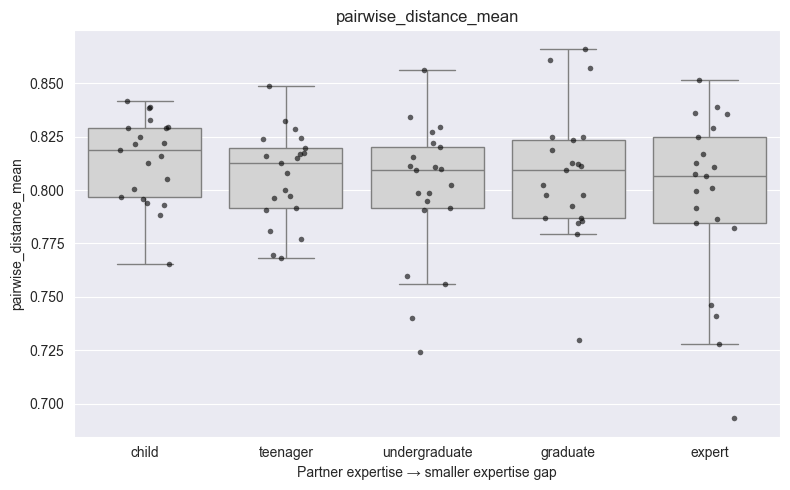

In [135]:
plot_metric_distribution(
    conversation_geometry,
    "pairwise_distance_mean"
)

In [44]:
conversation_geometry

,dataset,conversation_id,video_id,file_number,level,level_label,n_utterances,n_pairs,n_words,n_turns,...,nearest_neighbor_distance_median,knn_distance_median,maximum_available_rank,numerical_rank,total_variance,spectral_entropy,spectral_entropy_normalized,spectral_effective_rank,participation_ratio,pc1_variance_share
0,wired,wired_Talia_12,talia,12,0,child,27,351,315,14,...,0.501682,0.730119,26,26,0.825017,2.993523,0.918795,19.955860,16.181812,0.133915
1,wired,wired_astro_12,astro,12,0,child,56,1540,647,23,...,0.399942,0.595853,55,55,0.816119,3.508485,0.875516,33.397620,22.543430,0.121501
2,wired,wired_blockchain_12,blockchain,12,0,child,20,190,191,9,...,0.433820,0.788989,19,19,0.832669,2.693383,0.914736,14.781598,12.488393,0.148911
3,wired,wired_crispr_12,crispr,12,0,child,21,210,152,12,...,0.403874,0.757450,20,18,0.812852,2.639855,0.881205,14.011167,11.503853,0.174152
4,wired,wired_dimension_12,dimension,12,0,child,89,3916,689,50,...,0.310556,0.546307,88,81,0.795924,3.683957,0.822801,39.803570,22.846723,0.144173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,wired,wired_nuclear_16,nuclear,16,4,expert,44,946,849,11,...,0.445602,0.629145,43,43,0.791545,3.391523,0.901713,29.711171,21.622796,0.128743
101,wired,wired_sensing_16,sensing,16,4,expert,56,1540,882,27,...,0.486627,0.652179,55,50,0.829185,3.464621,0.864570,31.964335,21.181875,0.141975
102,wired,wired_sleep_16,sleep,16,4,expert,31,465,823,13,...,0.341957,0.446537,30,30,0.693088,2.986731,0.878141,19.820781,13.797187,0.177302
103,wired,wired_time_16,time,16,4,expert,63,1953,1182,23,...,0.483401,0.622610,62,62,0.801034,3.757115,0.910345,42.824685,31.911495,0.083664


In [45]:
def plot_metric_trajectories(df, metric, ylabel=None):
    fig, ax = plt.subplots(figsize=(8, 5))

    # One thin trajectory per topic
    sns.lineplot(
        data=df,
        x="level",
        y=metric,
        units="video_id",
        estimator=None,
        color="gray",
        alpha=0.3,
        linewidth=1,
        marker="o",
        markersize=3,
        ax=ax,
    )

    # Overall mean and 95% bootstrap CI
    sns.lineplot(
        data=df,
        x="level",
        y=metric,
        estimator="mean",
        errorbar=("ci", 95),
        color="black",
        linewidth=3,
        marker="o",
        markersize=7,
        ax=ax,
    )

    ax.set_xticks(range(5))
    ax.set_xticklabels(level_order)
    ax.set_xlabel("Partner expertise → smaller expertise gap")
    ax.set_ylabel(ylabel or metric)
    ax.set_title(ylabel or metric)

    plt.tight_layout()
    plt.show()

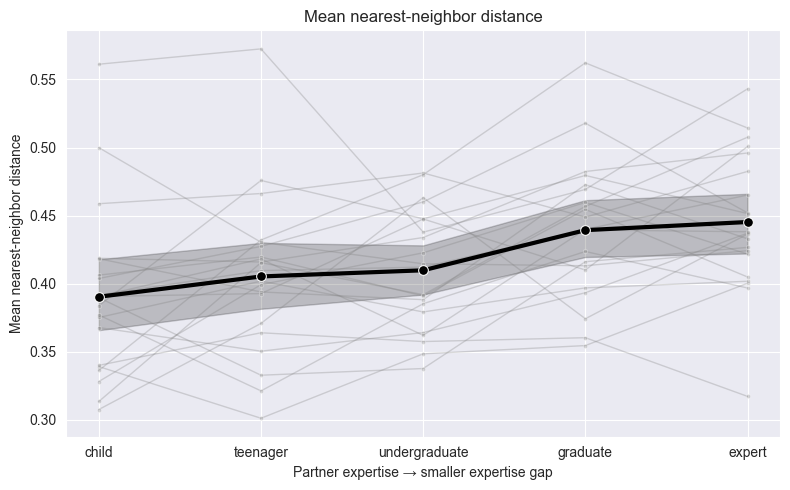

In [110]:
plot_metric_trajectories(
    conversation_geometry,
    "nearest_neighbor_distance_mean",
    "Mean nearest-neighbor distance",
)

In [111]:
def plot_child_expert_difference(df, metric, ylabel=None):
    endpoints = (
        df[df["level_label"].isin(["child", "expert"])]
        .pivot(
            index="video_id",
            columns="level_label",
            values=metric,
        )
        .dropna()
    )

    endpoints["difference"] = (
        endpoints["expert"] - endpoints["child"]
    )

    endpoints = endpoints.sort_values("difference")

    fig, ax = plt.subplots(figsize=(7, 7))

    ax.scatter(
        endpoints["difference"],
        endpoints.index,
        color="black",
        s=35,
    )

    ax.axvline(0, color="gray", linestyle="--")

    ax.axvline(
        endpoints["difference"].mean(),
        color="red",
        linewidth=2,
        label=(
            "Mean difference = "
            f"{endpoints['difference'].mean():.3f}"
        ),
    )

    ax.set_xlabel(
        f"Expert − child difference\n"
        f"({ylabel or metric})"
    )
    ax.set_ylabel("Topic")
    ax.set_title("Smallest gap versus largest gap")
    ax.legend()

    plt.tight_layout()
    plt.show()

In [112]:
def plot_sample_size_diagnostic(df, metric, ylabel=None):
    plt.figure(figsize=(7, 5))

    sns.scatterplot(
        data=df,
        x="n_utterances",
        y=metric,
        hue="level_label",
        hue_order=level_order,
        alpha=0.8,
    )

    sns.regplot(
        data=df,
        x="n_utterances",
        y=metric,
        scatter=False,
        color="black",
        line_kws={"linestyle": "--"},
    )

    plt.xlabel("Number of utterances")
    plt.ylabel(ylabel or metric)
    plt.title(f"{ylabel or metric} versus conversation size")
    plt.tight_layout()
    plt.show()

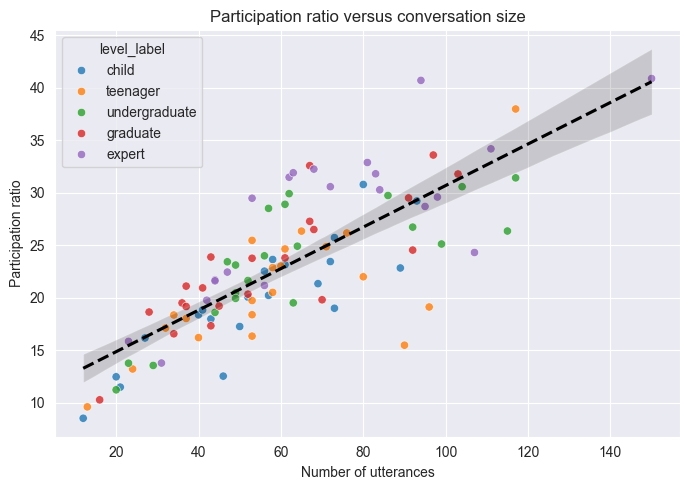

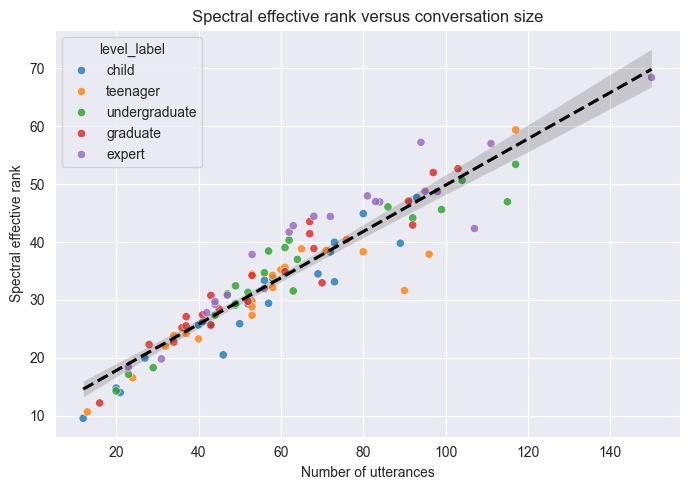

In [113]:
plot_sample_size_diagnostic(
    conversation_geometry,
    "participation_ratio",
    "Participation ratio",
)

plot_sample_size_diagnostic(
    conversation_geometry,
    "spectral_effective_rank",
    "Spectral effective rank",
)

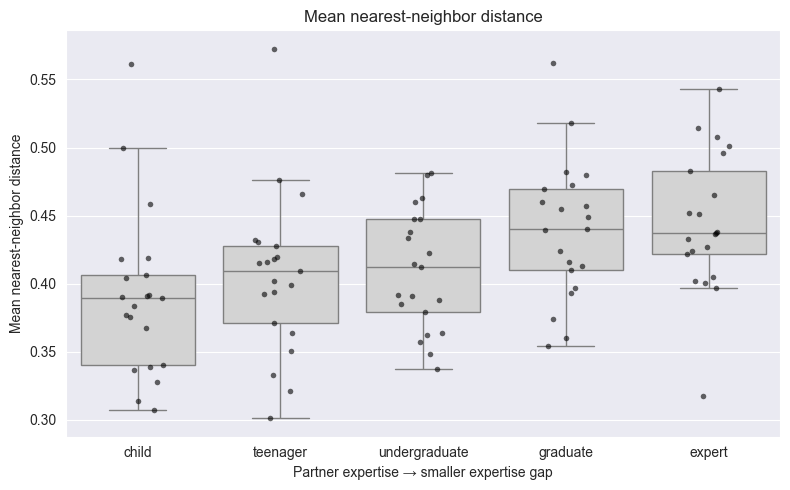

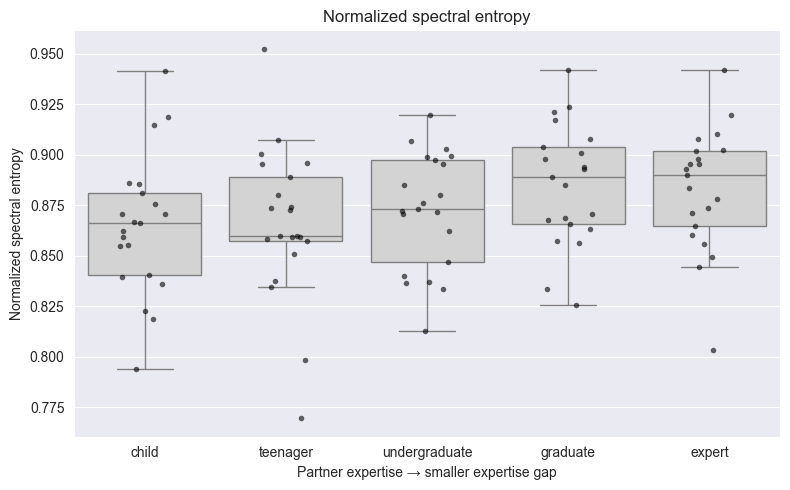

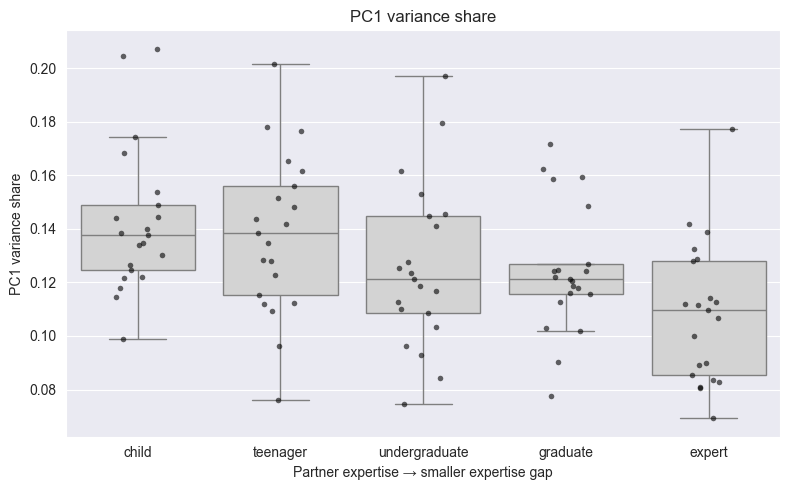

In [114]:
plot_metric_distribution(
    conversation_geometry,
    "nearest_neighbor_distance_mean",
    "Mean nearest-neighbor distance",
)

plot_metric_distribution(
    conversation_geometry,
    "spectral_entropy_normalized",
    "Normalized spectral entropy",
)

plot_metric_distribution(
    conversation_geometry,
    "pc1_variance_share",
    "PC1 variance share",
)

In [117]:
conversation_geometry.columns

Index(['dataset', 'conversation_id', 'video_id', 'file_number', 'level',
       'level_label', 'n_utterances', 'n_pairs', 'n_words', 'n_turns',
       'embedding_dimension', 'k_used', 'pairwise_cosine_similarity_mean',
       'pairwise_cosine_similarity_sd', 'pairwise_cosine_similarity_q10',
       'pairwise_cosine_similarity_median', 'pairwise_cosine_similarity_q90',
       'centroid_resultant_length', 'centroid_dispersion_cosine',
       'radial_distance_mean_check', 'radial_distance_median',
       'radial_distance_q90', 'pairwise_distance_mean', 'pairwise_distance_sd',
       'pairwise_distance_q10', 'pairwise_distance_median',
       'pairwise_distance_q90', 'pairwise_semantic_span',
       'nearest_neighbor_distance_mean', 'nearest_neighbor_distance_median',
       'knn_distance_median', 'maximum_available_rank', 'numerical_rank',
       'total_variance', 'spectral_entropy', 'spectral_entropy_normalized',
       'spectral_effective_rank', 'participation_ratio', 'pc1_variance_shar

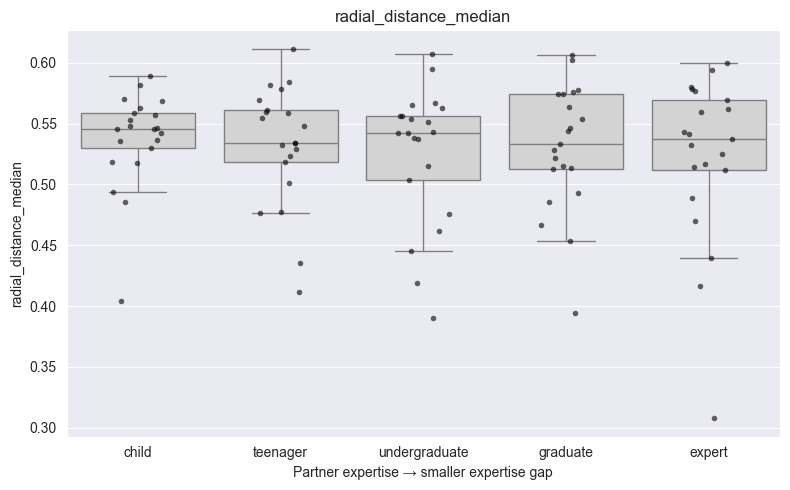

In [122]:
plot_metric_distribution(
    conversation_geometry,
    "radial_distance_median"
)

# dynamic metrics

In [56]:
import re
import numpy as np
import pandas as pd


def _sample_sd(values):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]

    if len(values) < 2:
        return np.nan

    return float(np.std(values, ddof=1))


def _linear_slope(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)

    if valid.sum() < 2:
        return np.nan

    x = x[valid]
    y = y[valid]

    if np.isclose(np.ptp(x), 0):
        return np.nan

    return float(np.polyfit(x, y, deg=1)[0])


def _mean_or_nan(values):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]

    if len(values) == 0:
        return np.nan

    return float(np.mean(values))


def standardize_speaker_role(value):
    """
    Convert existing speaker labels to 'expert' or 'learner'.

    This recognizes labels such as:
        Speaker A
        Speaker B
        Speaker 1
        expert
        child
        teenager
        college student
        graduate student
    """
    if pd.isna(value):
        return None

    label = str(value).strip().lower()

    if (
        label == "expert"
        or "speaker a" in label
        or re.search(r"\bspeaker\s*1\b", label)
    ):
        return "expert"

    learner_terms = [
        "learner",
        "speaker b",
        "child",
        "teen",
        "student",
        "undergraduate",
        "graduate",
        "college",
        "novice",
        "partner",
    ]

    if any(term in label for term in learner_terms):
        return "learner"

    return None

In [57]:
#trajectory calculations
def _calculate_order_metrics(X):
    """
    Calculate metrics that depend directly on utterance order.
    X must already contain unit-normalized embeddings.
    """
    n = len(X)

    # ------------------------------------------------------------
    # Consecutive semantic movement
    # ------------------------------------------------------------

    adjacent_similarities = np.sum(
        X[:-1] * X[1:],
        axis=1,
    )

    adjacent_similarities = np.clip(
        adjacent_similarities,
        -1.0,
        1.0,
    )

    step_cosine_distances = (
        1.0 - adjacent_similarities
    )

    # Euclidean chord distances on the unit sphere.
    # Needed for valid path-efficiency calculations.
    step_chord_distances = np.linalg.norm(
        X[1:] - X[:-1],
        axis=1,
    )

    # Each step is placed at the midpoint between two utterances.
    step_times = (
        np.arange(n - 1) + 0.5
    ) / (n - 1)

    step_distance_slope = _linear_slope(
        step_times,
        step_cosine_distances,
    )

    early_steps = (
        step_cosine_distances[
            step_times <= 1 / 3
        ]
    )

    late_steps = (
        step_cosine_distances[
            step_times >= 2 / 3
        ]
    )

    early_step_mean = _mean_or_nan(early_steps)
    late_step_mean = _mean_or_nan(late_steps)

    # ------------------------------------------------------------
    # Path length, net displacement, and efficiency
    # ------------------------------------------------------------

    total_path_length_chord = float(
        np.sum(step_chord_distances)
    )

    net_displacement_chord = float(
        np.linalg.norm(X[-1] - X[0])
    )

    net_displacement_cosine = float(
        np.clip(
            1.0 - np.dot(X[0], X[-1]),
            0.0,
            2.0,
        )
    )

    if total_path_length_chord > 1e-15:
        trajectory_efficiency_chord = float(
            net_displacement_chord
            / total_path_length_chord
        )
    else:
        trajectory_efficiency_chord = np.nan

    # ------------------------------------------------------------
    # Directional persistence
    # ------------------------------------------------------------

    movement_vectors = X[1:] - X[:-1]

    movement_norms = np.linalg.norm(
        movement_vectors,
        axis=1,
    )

    valid_movements = movement_norms > 1e-15

    movement_directions = np.full_like(
        movement_vectors,
        np.nan,
    )

    movement_directions[valid_movements] = (
        movement_vectors[valid_movements]
        / movement_norms[valid_movements, None]
    )

    persistence_values = []

    for index in range(len(movement_directions) - 1):
        first = movement_directions[index]
        second = movement_directions[index + 1]

        if np.isfinite(first).all() and np.isfinite(second).all():
            persistence_values.append(
                np.clip(
                    np.dot(first, second),
                    -1.0,
                    1.0,
                )
            )

    persistence_values = np.asarray(
        persistence_values,
        dtype=float,
    )

    directional_persistence_mean = _mean_or_nan(
        persistence_values
    )

    if len(persistence_values):
        directional_reversal_rate = float(
            np.mean(persistence_values < 0)
        )
    else:
        directional_reversal_rate = np.nan

    # ------------------------------------------------------------
    # Change in movement magnitude
    # ------------------------------------------------------------

    step_size_changes = np.diff(
        step_cosine_distances
    )

    mean_absolute_step_change = _mean_or_nan(
        np.abs(step_size_changes)
    )

    # ------------------------------------------------------------
    # Distance from the beginning
    # ------------------------------------------------------------

    utterance_times = np.linspace(0, 1, n)

    distance_from_start = np.clip(
        1.0 - X @ X[0],
        0.0,
        2.0,
    )

    distance_from_start_slope = _linear_slope(
        utterance_times,
        distance_from_start,
    )

    distance_from_start_auc = float(
        np.trapz(
            distance_from_start,
            utterance_times,
        )
    )

    maximum_index = int(
        np.argmax(distance_from_start)
    )

    return {
        "step_cosine_distances":
            step_cosine_distances,

        "step_chord_distances":
            step_chord_distances,

        "step_times":
            step_times,

        "step_distance_slope":
            step_distance_slope,

        "step_distance_early_mean":
            early_step_mean,

        "step_distance_late_mean":
            late_step_mean,

        "step_distance_late_minus_early":
            late_step_mean - early_step_mean,

        "total_path_length_chord":
            total_path_length_chord,

        "net_displacement_chord":
            net_displacement_chord,

        "net_displacement_cosine":
            net_displacement_cosine,

        "trajectory_efficiency_chord":
            trajectory_efficiency_chord,

        "directional_persistence_values":
            persistence_values,

        "directional_persistence_mean":
            directional_persistence_mean,

        "directional_reversal_rate":
            directional_reversal_rate,

        "step_size_changes":
            step_size_changes,

        "mean_absolute_step_change":
            mean_absolute_step_change,

        "utterance_times":
            utterance_times,

        "distance_from_start":
            distance_from_start,

        "distance_from_start_slope":
            distance_from_start_slope,

        "distance_from_start_auc":
            distance_from_start_auc,

        "distance_from_start_max":
            float(distance_from_start[maximum_index]),

        "distance_from_start_max_time":
            float(utterance_times[maximum_index]),
    }

In [58]:
#conversation-level dynamic function
#adds comparison against all pair geometry, recurrence, speaker transitions, and shuffle-order baselines
def calculate_conversation_dynamics(
    embeddings,
    speaker_roles=None,
    recurrence_min_lag=4,
    recurrence_max_lag=10,
    n_permutations=200,
    random_state=2026,
):
    """
    Calculate Stage 1 trajectory metrics for one conversation.

    Parameters
    ----------
    embeddings : array, shape (n_utterances, embedding_dimension)
        Embeddings in chronological order.

    speaker_roles : array-like, optional
        One standardized speaker role per utterance:
        'expert' or 'learner'.

    recurrence_min_lag : int
        Smallest utterance separation treated as nonlocal.

    recurrence_max_lag : int
        Largest separation used for medium-lag recurrence.

    n_permutations : int
        Number of fixed-endpoint shuffled-order baselines.

    random_state : int
        Reproducibility seed.

    Returns
    -------
    scalar_metrics : dict
        One-row-per-conversation summaries.

    dynamic_series : dict
        Arrays retained for later trajectory plots.
    """
    X = np.asarray(
        embeddings,
        dtype=np.float64,
    )

    if X.ndim != 2:
        raise ValueError(
            "embeddings must have shape "
            "(n_utterances, embedding_dimension)"
        )

    if len(X) < 4:
        raise ValueError(
            "At least four utterances are required "
            "for Stage 1 dynamics."
        )

    if not np.isfinite(X).all():
        raise ValueError(
            "Embeddings contain NaN or infinite values."
        )

    norms = np.linalg.norm(
        X,
        axis=1,
        keepdims=True,
    )

    if np.any(norms == 0):
        raise ValueError(
            "At least one embedding has zero norm."
        )

    X = X / norms

    n, d = X.shape

    ordered = _calculate_order_metrics(X)

    # ------------------------------------------------------------
    # 1. Static all-pair baseline
    # ------------------------------------------------------------

    similarity_matrix = np.clip(
        X @ X.T,
        -1.0,
        1.0,
    )

    upper_triangle = np.triu_indices(
        n,
        k=1,
    )

    all_pair_similarities = (
        similarity_matrix[upper_triangle]
    )

    all_pair_distances = (
        1.0 - all_pair_similarities
    )

    all_pair_distance_mean = float(
        np.mean(all_pair_distances)
    )

    all_pair_similarity_mean = float(
        np.mean(all_pair_similarities)
    )

    step_distance_mean = float(
        np.mean(
            ordered["step_cosine_distances"]
        )
    )

    # Negative = adjacent utterances are closer than arbitrary pairs.
    step_distance_excess = float(
        step_distance_mean
        - all_pair_distance_mean
    )

    # ------------------------------------------------------------
    # 2. Medium-lag recurrence
    # ------------------------------------------------------------

    largest_lag = min(
        recurrence_max_lag,
        n - 1,
    )

    recurrence_by_lag = {}

    if largest_lag >= recurrence_min_lag:
        for lag in range(
            recurrence_min_lag,
            largest_lag + 1,
        ):
            lag_similarities = np.sum(
                X[:-lag] * X[lag:],
                axis=1,
            )

            recurrence_by_lag[lag] = float(
                np.mean(
                    np.clip(
                        lag_similarities,
                        -1.0,
                        1.0,
                    )
                )
            )

        # Each lag receives equal weight.
        medium_lag_similarity_mean = float(
            np.mean(
                list(recurrence_by_lag.values())
            )
        )

        medium_lag_excess_similarity = float(
            medium_lag_similarity_mean
            - all_pair_similarity_mean
        )

    else:
        medium_lag_similarity_mean = np.nan
        medium_lag_excess_similarity = np.nan

    # Exploratory: closest eligible prior utterance.
    # This is more sensitive to conversation length.
    best_prior_similarities = []
    best_prior_lags = []

    for current_index in range(
        recurrence_min_lag,
        n,
    ):
        last_eligible_index = (
            current_index
            - recurrence_min_lag
        )

        prior_similarities = (
            X[:last_eligible_index + 1]
            @ X[current_index]
        )

        best_index = int(
            np.argmax(prior_similarities)
        )

        best_prior_similarities.append(
            prior_similarities[best_index]
        )

        best_prior_lags.append(
            current_index - best_index
        )

    # ------------------------------------------------------------
    # 3. Speaker-transition movement
    # ------------------------------------------------------------

    transition_results = {
        "speaker_switch_rate": np.nan,

        "expert_to_learner_step_mean": np.nan,
        "learner_to_expert_step_mean": np.nan,
        "expert_to_expert_step_mean": np.nan,
        "learner_to_learner_step_mean": np.nan,

        "n_expert_to_learner_steps": 0,
        "n_learner_to_expert_steps": 0,
        "n_expert_to_expert_steps": 0,
        "n_learner_to_learner_steps": 0,

        "learner_to_expert_minus_expert_to_learner_step":
            np.nan,
    }

    if speaker_roles is not None:
        roles = np.asarray(
            speaker_roles,
            dtype=object,
        )

        if len(roles) != n:
            raise ValueError(
                "speaker_roles must have one value "
                "per utterance."
            )

        transition_values = {
            "expert_to_learner": [],
            "learner_to_expert": [],
            "expert_to_expert": [],
            "learner_to_learner": [],
        }

        known_transitions = 0
        speaker_switches = 0

        for index, distance in enumerate(
            ordered["step_cosine_distances"]
        ):
            source = roles[index]
            target = roles[index + 1]

            if (
                source not in {"expert", "learner"}
                or target not in {"expert", "learner"}
            ):
                continue

            known_transitions += 1

            if source != target:
                speaker_switches += 1

            transition_name = (
                f"{source}_to_{target}"
            )

            transition_values[
                transition_name
            ].append(distance)

        if known_transitions:
            transition_results[
                "speaker_switch_rate"
            ] = (
                speaker_switches
                / known_transitions
            )

        for transition_name, values in (
            transition_values.items()
        ):
            transition_results[
                f"{transition_name}_step_mean"
            ] = _mean_or_nan(values)

            transition_results[
                f"n_{transition_name}_steps"
            ] = len(values)

        learner_to_expert = transition_results[
            "learner_to_expert_step_mean"
        ]

        expert_to_learner = transition_results[
            "expert_to_learner_step_mean"
        ]

        if (
            np.isfinite(learner_to_expert)
            and np.isfinite(expert_to_learner)
        ):
            transition_results[
                "learner_to_expert_minus_"
                "expert_to_learner_step"
            ] = (
                learner_to_expert
                - expert_to_learner
            )

    # ------------------------------------------------------------
    # 4. Fixed-endpoint shuffle baselines
    # ------------------------------------------------------------

    shuffle_metric_names = [
        "step_distance_slope",
        "trajectory_efficiency_chord",
        "directional_persistence_mean",
        "distance_from_start_auc",
    ]

    shuffle_values = {
        name: []
        for name in shuffle_metric_names
    }

    rng = np.random.default_rng(
        random_state
    )

    if n_permutations > 0 and n > 3:
        interior_indices = np.arange(
            1,
            n - 1,
        )

        for _ in range(n_permutations):
            shuffled_indices = np.concatenate([
                [0],
                rng.permutation(
                    interior_indices
                ),
                [n - 1],
            ])

            shuffled = _calculate_order_metrics(
                X[shuffled_indices]
            )

            for name in shuffle_metric_names:
                shuffle_values[name].append(
                    shuffled[name]
                )

    shuffle_results = {}

    for name in shuffle_metric_names:
        null_values = np.asarray(
            shuffle_values[name],
            dtype=float,
        )

        null_values = null_values[
            np.isfinite(null_values)
        ]

        observed_value = ordered[name]

        if (
            len(null_values)
            and np.isfinite(observed_value)
        ):
            null_mean = float(
                np.mean(null_values)
            )

            null_sd = (
                float(np.std(null_values, ddof=1))
                if len(null_values) > 1
                else np.nan
            )

            shuffle_results[
                f"{name}_shuffle_mean"
            ] = null_mean

            shuffle_results[
                f"{name}_excess_vs_shuffle"
            ] = (
                observed_value - null_mean
            )

            if (
                np.isfinite(null_sd)
                and null_sd > 1e-15
            ):
                shuffle_results[
                    f"{name}_shuffle_z"
                ] = (
                    observed_value - null_mean
                ) / null_sd
            else:
                shuffle_results[
                    f"{name}_shuffle_z"
                ] = np.nan
        else:
            shuffle_results[
                f"{name}_shuffle_mean"
            ] = np.nan

            shuffle_results[
                f"{name}_excess_vs_shuffle"
            ] = np.nan

            shuffle_results[
                f"{name}_shuffle_z"
            ] = np.nan

    # ------------------------------------------------------------
    # 5. Collect scalar outputs
    # ------------------------------------------------------------

    scalar_metrics = {
        "n_utterances": int(n),
        "n_steps": int(n - 1),
        "embedding_dimension": int(d),

        # Consecutive movement
        "step_cosine_distance_mean":
            step_distance_mean,

        "step_cosine_distance_sd":
            _sample_sd(
                ordered["step_cosine_distances"]
            ),

        "step_cosine_distance_median":
            float(
                np.median(
                    ordered[
                        "step_cosine_distances"
                    ]
                )
            ),

        "step_cosine_distance_q90":
            float(
                np.quantile(
                    ordered[
                        "step_cosine_distances"
                    ],
                    0.90,
                )
            ),

        # Dynamic movement relative to global geometry
        "all_pair_distance_mean_check":
            all_pair_distance_mean,

        "step_distance_excess_over_all_pairs":
            step_distance_excess,

        # Development over time
        "step_distance_slope":
            ordered["step_distance_slope"],

        "step_distance_early_mean":
            ordered["step_distance_early_mean"],

        "step_distance_late_mean":
            ordered["step_distance_late_mean"],

        "step_distance_late_minus_early":
            ordered[
                "step_distance_late_minus_early"
            ],

        # Path structure
        "total_path_length_chord":
            ordered["total_path_length_chord"],

        "net_displacement_chord":
            ordered["net_displacement_chord"],

        "net_displacement_cosine":
            ordered["net_displacement_cosine"],

        "trajectory_efficiency_chord":
            ordered[
                "trajectory_efficiency_chord"
            ],

        # Direction and volatility
        "directional_persistence_mean":
            ordered[
                "directional_persistence_mean"
            ],

        "directional_reversal_rate":
            ordered[
                "directional_reversal_rate"
            ],

        "mean_absolute_step_change":
            ordered[
                "mean_absolute_step_change"
            ],

        # Recurrence
        "medium_lag_similarity_mean":
            medium_lag_similarity_mean,

        "medium_lag_excess_similarity":
            medium_lag_excess_similarity,

        "best_prior_recurrence_similarity_mean":
            _mean_or_nan(
                best_prior_similarities
            ),

        "best_prior_recurrence_lag_mean":
            _mean_or_nan(
                best_prior_lags
            ),

        # Development away from the beginning
        "distance_from_start_slope":
            ordered[
                "distance_from_start_slope"
            ],

        "distance_from_start_auc":
            ordered[
                "distance_from_start_auc"
            ],

        "distance_from_start_max":
            ordered[
                "distance_from_start_max"
            ],

        "distance_from_start_max_time":
            ordered[
                "distance_from_start_max_time"
            ],

        # Null-model bookkeeping
        "n_order_permutations":
            int(n_permutations),
    }

    scalar_metrics.update(
        transition_results
    )

    scalar_metrics.update(
        shuffle_results
    )

    dynamic_series = {
        "step_times":
            ordered["step_times"],

        "step_cosine_distances":
            ordered["step_cosine_distances"],

        "step_chord_distances":
            ordered["step_chord_distances"],

        "directional_persistence":
            ordered[
                "directional_persistence_values"
            ],

        "utterance_times":
            ordered["utterance_times"],

        "distance_from_start":
            ordered["distance_from_start"],

        "recurrence_by_lag":
            recurrence_by_lag,
    }

    # Mathematical check for chord-distance efficiency.
    if np.isfinite(
        scalar_metrics[
            "trajectory_efficiency_chord"
        ]
    ):
        assert (
            -1e-10
            <= scalar_metrics[
                "trajectory_efficiency_chord"
            ]
            <= 1 + 1e-10
        )

    return scalar_metrics, dynamic_series

apply calculations to each conversation

In [59]:
# Find the speaker column used in the existing table.
speaker_candidates = [
    "speaker_role",
    "speaker",
    "speaker_label",
]

speaker_column = next(
    (
        column
        for column in speaker_candidates
        if column in geometry_utterances.columns
    ),
    None,
)

print("Speaker column:", speaker_column)

if speaker_column is None:
    print(
        "No recognized speaker column found. "
        "General dynamics will still be calculated, "
        "but speaker-transition metrics will be missing."
    )

Speaker column: speaker_role


In [60]:
dynamic_records = []
conversation_dynamic_series = {}

group_columns = [
    "dataset",
    "conversation_id",
]

for group_number, (group_key, group) in enumerate(
    geometry_utterances.groupby(
        group_columns,
        sort=False,
        observed=True,
    )
):
    dataset, conversation_id = group_key

    # embedding_idx follows the original transcript order.
    group = (
        group
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .copy()
    )

    embedding_indices = group[
        "embedding_idx"
    ].to_numpy(dtype=int)

    conversation_embeddings = (
        E_utterances[embedding_indices]
    )

    if speaker_column is not None:
        speaker_roles = (
            group[speaker_column]
            .map(standardize_speaker_role)
            .to_numpy()
        )
    else:
        speaker_roles = None

    scalar_metrics, dynamic_series = (
        calculate_conversation_dynamics(
            conversation_embeddings,
            speaker_roles=speaker_roles,

            # Exclude the preceding three utterances.
            recurrence_min_lag=4,

            # Examine returns 4–10 utterances later.
            recurrence_max_lag=10,

            n_permutations=200,

            # Different but reproducible seed per conversation.
            random_state=2026 + group_number,
        )
    )

    row = {
        "dataset": dataset,
        "conversation_id": conversation_id,
    }

    for column in [
        "video_id",
        "file_number",
        "level",
        "level_label",
    ]:
        if column in group.columns:
            row[column] = group[
                column
            ].iloc[0]

    if "n_words" in group.columns:
        row["n_words"] = int(
            group["n_words"].sum()
        )
    elif "text" in group.columns:
        row["n_words"] = int(
            group["text"]
            .astype(str)
            .str.split()
            .str.len()
            .sum()
        )

    if "turn_id" in group.columns:
        row["n_turns"] = int(
            group["turn_id"].nunique()
        )

    row.update(scalar_metrics)
    dynamic_records.append(row)

    conversation_dynamic_series[
        (dataset, conversation_id)
    ] = dynamic_series


conversation_dynamics = pd.DataFrame(
    dynamic_records
)

sort_columns = [
    column
    for column in [
        "level",
        "dataset",
        "conversation_id",
    ]
    if column in conversation_dynamics.columns
]

conversation_dynamics = (
    conversation_dynamics
    .sort_values(sort_columns)
    .reset_index(drop=True)
)

print(
    "Conversations analyzed:",
    len(conversation_dynamics),
)

print(
    "Dynamics table shape:",
    conversation_dynamics.shape,
)

display(conversation_dynamics)

/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_23541/3298689629.py:172: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(


Conversations analyzed: 105
Dynamics table shape: (105, 59)


,dataset,conversation_id,video_id,file_number,level,level_label,n_words,n_turns,n_utterances,n_steps,...,step_distance_slope_shuffle_z,trajectory_efficiency_chord_shuffle_mean,trajectory_efficiency_chord_excess_vs_shuffle,trajectory_efficiency_chord_shuffle_z,directional_persistence_mean_shuffle_mean,directional_persistence_mean_excess_vs_shuffle,directional_persistence_mean_shuffle_z,distance_from_start_auc_shuffle_mean,distance_from_start_auc_excess_vs_shuffle,distance_from_start_auc_shuffle_z
0,wired,wired_Talia_12,talia,12,0,child,315,14,27,26,...,-0.431775,0.041748,0.003638,5.457888,-0.496839,0.043161,1.873163,0.818846,1.110223e-16,NaN
1,wired,wired_astro_12,astro,12,0,child,647,23,56,55,...,-0.025628,0.018487,0.002099,9.623505,-0.493350,0.051439,3.231895,0.883317,-2.220446e-16,NaN
2,wired,wired_blockchain_12,blockchain,12,0,child,191,9,20,19,...,1.299513,0.055104,0.003629,3.356776,-0.494013,0.054655,1.799485,0.888595,1.110223e-16,NaN
3,wired,wired_crispr_12,crispr,12,0,child,152,12,21,20,...,-0.756377,0.052204,0.007296,4.776498,-0.500374,0.042615,1.391224,0.877861,1.110223e-16,NaN
4,wired,wired_dimension_12,dimension,12,0,child,689,50,89,88,...,1.454334,0.011654,0.000793,5.623901,-0.497892,0.055565,4.067861,0.781396,-1.110223e-16,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,wired,wired_nuclear_16,nuclear,16,4,expert,849,11,44,43,...,1.030209,0.024185,0.001414,4.400572,-0.494496,0.002954,0.168527,0.712126,1.110223e-16,NaN
101,wired,wired_sensing_16,sensing,16,4,expert,882,27,56,55,...,0.174412,0.017109,0.000578,2.049066,-0.500762,-0.002061,-0.130711,0.725656,0.000000e+00,NaN
102,wired,wired_sleep_16,sleep,16,4,expert,823,13,31,30,...,-0.456573,0.039395,0.003748,5.401261,-0.490890,-0.021770,-0.888153,0.946041,1.110223e-16,NaN
103,wired,wired_time_16,time,16,4,expert,1182,23,63,62,...,1.406218,0.016999,0.000800,5.354500,-0.498005,0.028564,2.489069,0.729836,3.330669e-16,NaN


In [61]:
if speaker_column is not None:
    speaker_mapping_check = (
        geometry_utterances[
            [speaker_column]
        ]
        .drop_duplicates()
        .assign(
            standardized_role=lambda frame:
                frame[speaker_column].map(
                    standardize_speaker_role
                )
        )
    )

    display(speaker_mapping_check)

,speaker_role,standardized_role
0,partner,learner
1,expert,expert


## visualizations for trajectory metrics

matched topic trajectories for each summary metric

In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

level_order = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert",
]

level_x = {
    level: index
    for index, level in enumerate(level_order)
}


def plot_dynamic_metric_trajectories(
    df,
    metric,
    ylabel=None,
    zero_reference=False,
    ax=None,
):
    plot_df = df.dropna(subset=[metric]).copy()

    plot_df["_level_x"] = (
        plot_df["level_label"]
        .astype(str)
        .str.lower()
        .map(level_x)
    )

    plot_df["_video_group"] = (
        plot_df["dataset"].astype(str)
        + "::"
        + plot_df["video_id"].astype(str)
    )

    plot_df = plot_df.dropna(
        subset=["_level_x"]
    )

    if ax is None:
        _, ax = plt.subplots(
            figsize=(8, 5)
        )

    # One matched trajectory per video
    for _, video_df in plot_df.groupby(
        "_video_group"
    ):
        video_df = video_df.sort_values(
            "_level_x"
        )

        ax.plot(
            video_df["_level_x"],
            video_df[metric],
            color="gray",
            alpha=0.25,
            linewidth=1,
            marker="o",
            markersize=3,
        )

    # Mean across videos
    level_means = (
        plot_df.groupby("_level_x")[metric]
        .mean()
        .reindex(range(5))
    )

    ax.plot(
        range(5),
        level_means,
        color="black",
        linewidth=3,
        marker="o",
        markersize=7,
    )

    if zero_reference:
        ax.axhline(
            0,
            color="red",
            linestyle="--",
            linewidth=1,
        )

    ax.set_xticks(range(5))
    ax.set_xticklabels(
        level_order,
        rotation=20,
    )

    ax.set_xlabel(
        "Partner expertise → smaller expertise gap"
    )

    ax.set_ylabel(ylabel or metric)
    ax.set_title(ylabel or metric)

    return ax

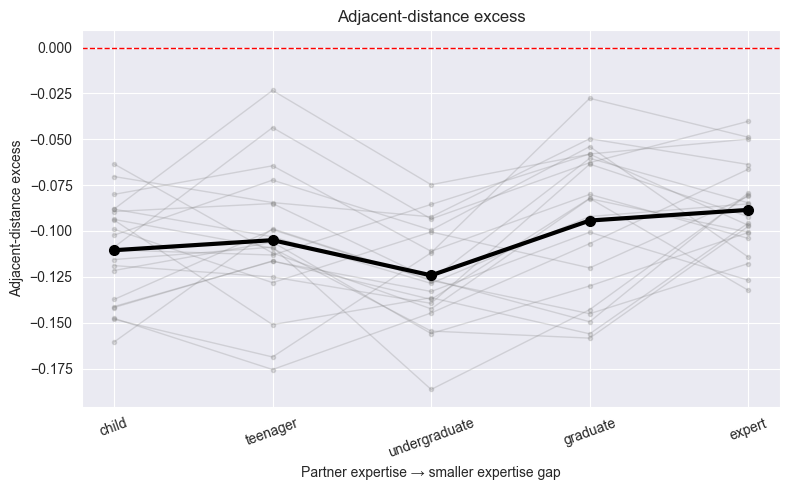

In [63]:
plot_dynamic_metric_trajectories(
    conversation_dynamics,
    metric="step_distance_excess_over_all_pairs",
    ylabel="Adjacent-distance excess",
    zero_reference=True,
)

plt.tight_layout()
plt.show()

In [64]:
dynamic_metric_labels = {
    "step_distance_excess_over_all_pairs":
        "Sequential coherence",

    "step_distance_slope_excess_vs_shuffle":
        "Change in movement over time",

    "trajectory_efficiency_chord_excess_vs_shuffle":
        "Trajectory efficiency vs. shuffle",

    "directional_persistence_mean_excess_vs_shuffle":
        "Directional persistence vs. shuffle",

    "mean_absolute_step_change":
        "Movement volatility",

    "medium_lag_excess_similarity":
        "Medium-lag recurrence",

    "distance_from_start_auc_excess_vs_shuffle":
        "Sustained departure vs. shuffle",

    "learner_to_expert_minus_expert_to_learner_step":
        "Response-transition asymmetry",
}

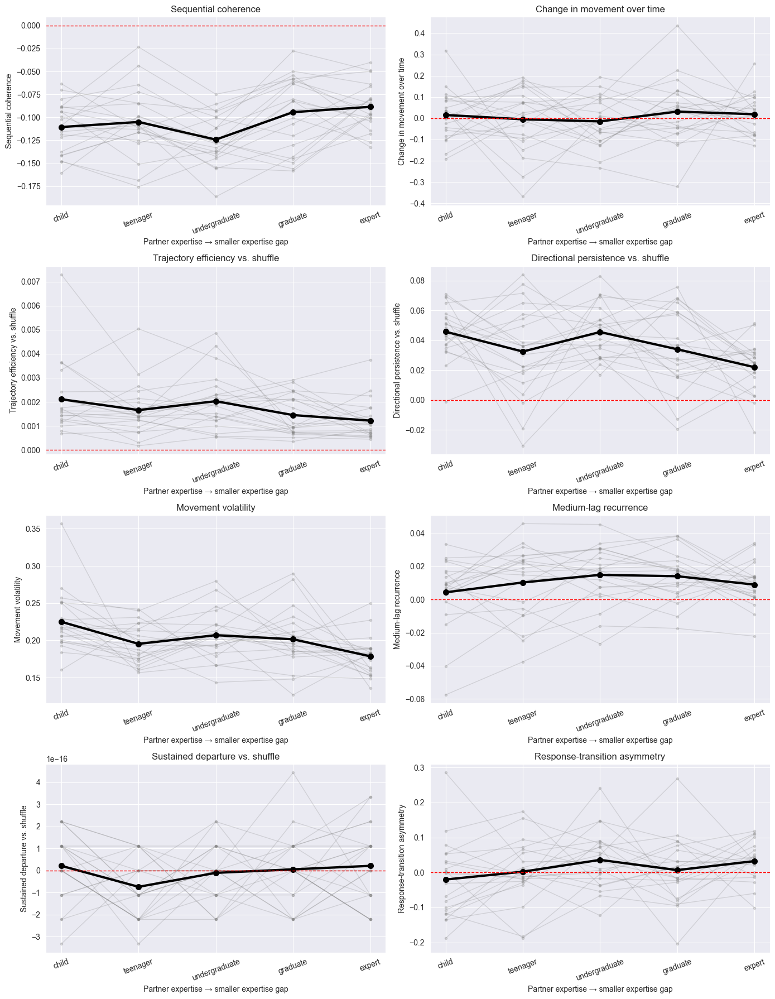

In [65]:
fig, axes = plt.subplots(
    4,
    2,
    figsize=(14, 18),
)

axes = axes.flatten()

for ax, (metric, label) in zip(
    axes,
    dynamic_metric_labels.items(),
):
    plot_dynamic_metric_trajectories(
        conversation_dynamics,
        metric=metric,
        ylabel=label,
        zero_reference=(
            "excess" in metric
            or "minus" in metric
        ),
        ax=ax,
    )

plt.tight_layout()
plt.show()

In [66]:
def plot_observed_vs_shuffle(
    df,
    observed_metric,
    shuffle_metric,
    label=None,
):
    plot_df = df.dropna(
        subset=[
            observed_metric,
            shuffle_metric,
        ]
    )

    fig, ax = plt.subplots(
        figsize=(7, 6)
    )

    sns.scatterplot(
        data=plot_df,
        x=shuffle_metric,
        y=observed_metric,
        hue="level_label",
        hue_order=level_order,
        s=55,
        alpha=0.8,
        ax=ax,
    )

    minimum = min(
        plot_df[observed_metric].min(),
        plot_df[shuffle_metric].min(),
    )

    maximum = max(
        plot_df[observed_metric].max(),
        plot_df[shuffle_metric].max(),
    )

    ax.plot(
        [minimum, maximum],
        [minimum, maximum],
        color="black",
        linestyle="--",
    )

    ax.set_xlabel("Mean shuffled-order value")
    ax.set_ylabel("Observed-order value")
    ax.set_title(label or observed_metric)

    plt.tight_layout()
    plt.show()

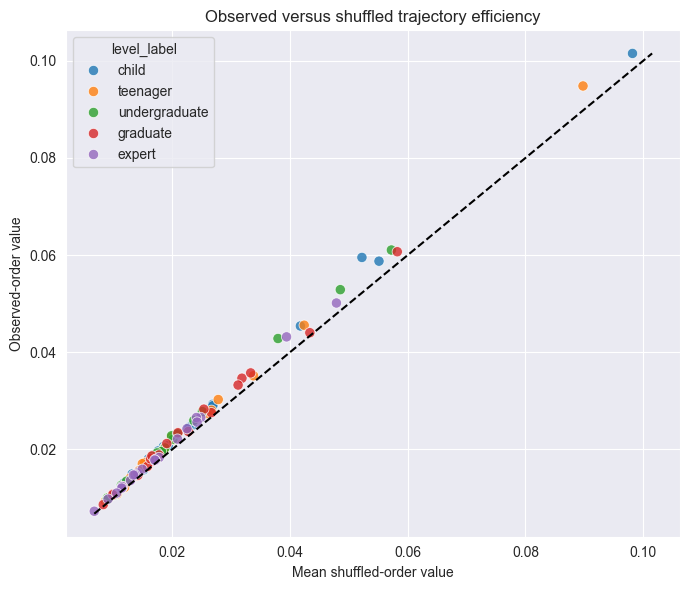

In [67]:
plot_observed_vs_shuffle(
    conversation_dynamics,
    observed_metric=
        "trajectory_efficiency_chord",
    shuffle_metric=
        "trajectory_efficiency_chord_shuffle_mean",
    label="Observed versus shuffled trajectory efficiency",
)

interpretation: above diagonal-> observed convo has higher efficiency than shuffled baseline
colors separating differently around diagonal -> strength of temporal organization vaires with gap

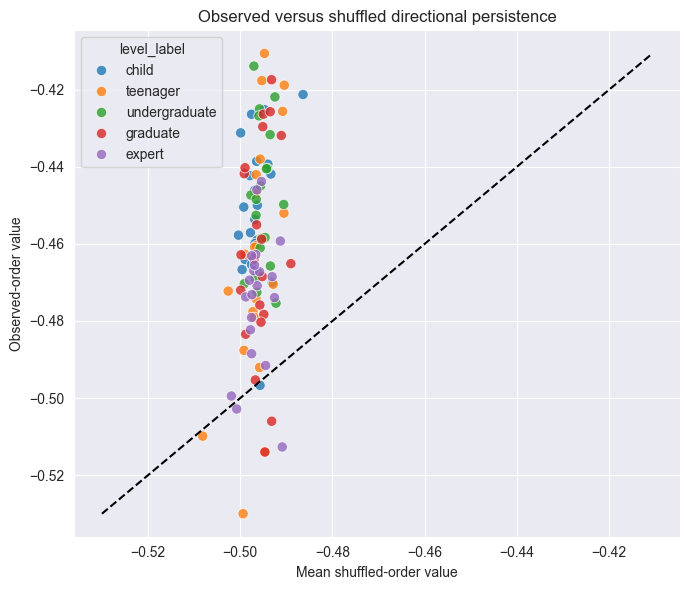

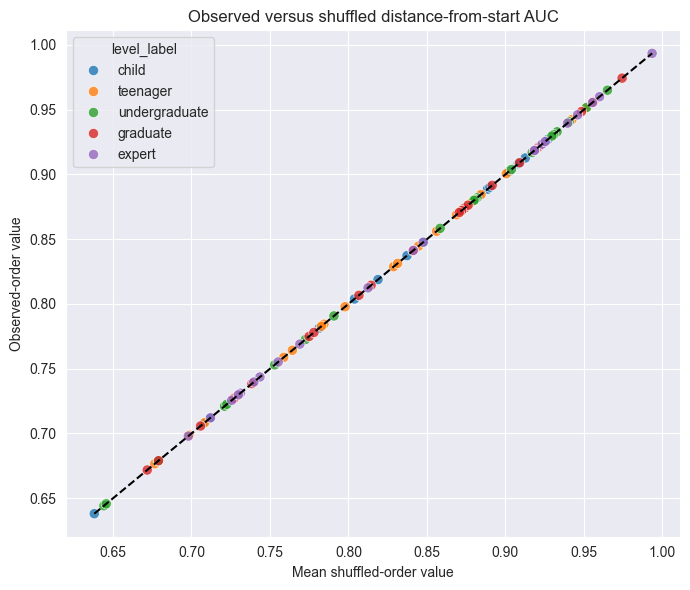

In [68]:
plot_observed_vs_shuffle(
    conversation_dynamics,
    "directional_persistence_mean",
    "directional_persistence_mean_shuffle_mean",
    "Observed versus shuffled directional persistence",
)

plot_observed_vs_shuffle(
    conversation_dynamics,
    "distance_from_start_auc",
    "distance_from_start_auc_shuffle_mean",
    "Observed versus shuffled distance-from-start AUC",
)

### visualizting the actual temporal series

In [69]:
#binned time series table
def build_binned_dynamic_series(
    conversation_dynamics,
    conversation_dynamic_series,
    time_key,
    value_key,
    n_bins=10,
):
    records = []

    for _, row in (
        conversation_dynamics.iterrows()
    ):
        key = (
            row["dataset"],
            row["conversation_id"],
        )

        if key not in conversation_dynamic_series:
            continue

        series = conversation_dynamic_series[key]

        times = np.asarray(
            series[time_key],
            dtype=float,
        )

        values = np.asarray(
            series[value_key],
            dtype=float,
        )

        valid = (
            np.isfinite(times)
            & np.isfinite(values)
        )

        times = times[valid]
        values = values[valid]

        bin_number = np.minimum(
            np.floor(times * n_bins).astype(int),
            n_bins - 1,
        )

        temporary = pd.DataFrame({
            "time_bin": bin_number,
            "value": values,
        })

        # One value per conversation per time bin
        temporary = (
            temporary
            .groupby("time_bin", as_index=False)
            ["value"]
            .mean()
        )

        temporary["normalized_time"] = (
            temporary["time_bin"] + 0.5
        ) / n_bins

        temporary["dataset"] = row["dataset"]
        temporary["conversation_id"] = (
            row["conversation_id"]
        )
        temporary["video_id"] = row["video_id"]
        temporary["level_label"] = (
            str(row["level_label"]).lower()
        )

        records.append(temporary)

    return pd.concat(
        records,
        ignore_index=True,
    )

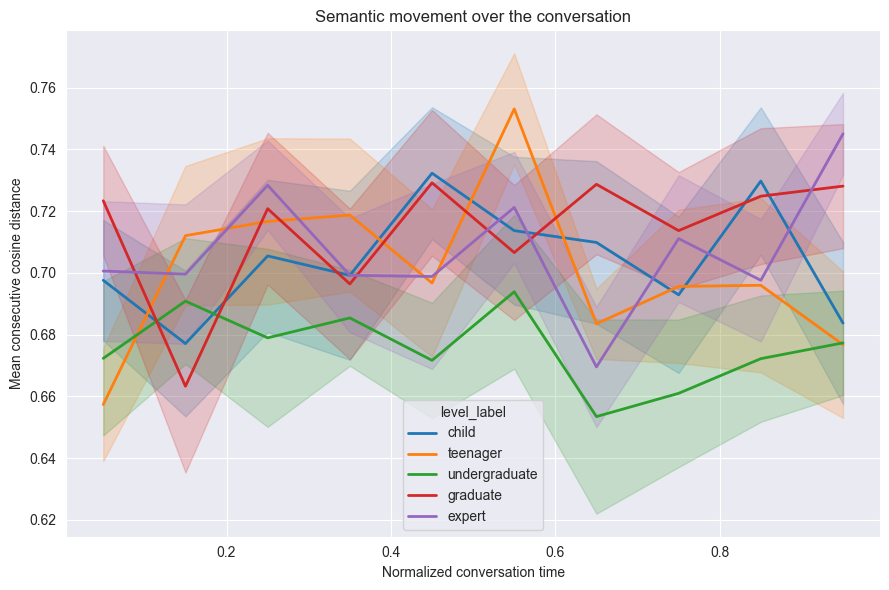

In [70]:
#plot sematic movement over tim e
step_time_df = build_binned_dynamic_series(
    conversation_dynamics,
    conversation_dynamic_series,
    time_key="step_times",
    value_key="step_cosine_distances",
    n_bins=10,
)

plt.figure(figsize=(9, 6))

sns.lineplot(
    data=step_time_df,
    x="normalized_time",
    y="value",
    hue="level_label",
    hue_order=level_order,
    estimator="mean",
    errorbar=("se", 1),
    linewidth=2,
)

plt.xlabel("Normalized conversation time")
plt.ylabel("Mean consecutive cosine distance")
plt.title("Semantic movement over the conversation")
plt.tight_layout()
plt.show()

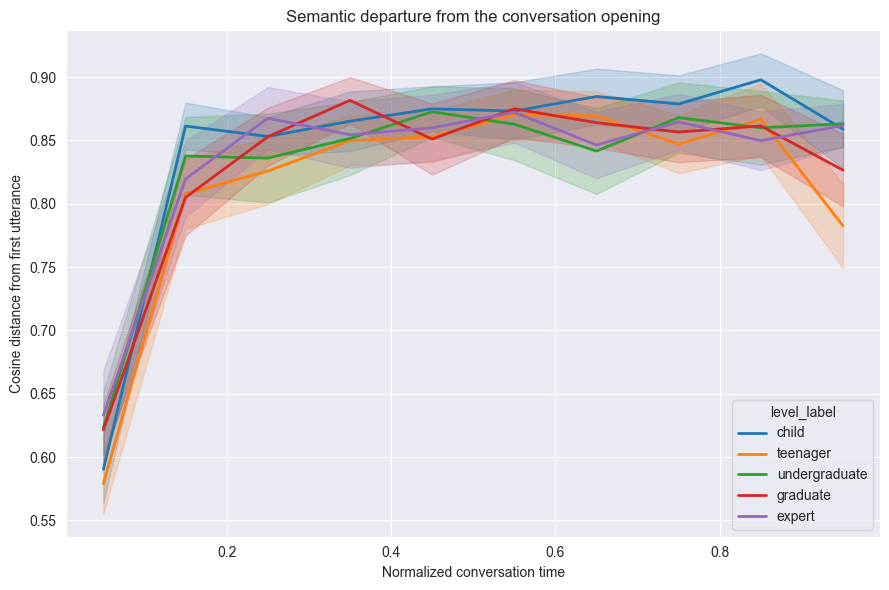

In [71]:
#distance from beginning
start_distance_df = (
    build_binned_dynamic_series(
        conversation_dynamics,
        conversation_dynamic_series,
        time_key="utterance_times",
        value_key="distance_from_start",
        n_bins=10,
    )
)

plt.figure(figsize=(9, 6))

sns.lineplot(
    data=start_distance_df,
    x="normalized_time",
    y="value",
    hue="level_label",
    hue_order=level_order,
    estimator="mean",
    errorbar=("se", 1),
    linewidth=2,
)

plt.xlabel("Normalized conversation time")
plt.ylabel("Cosine distance from first utterance")
plt.title("Semantic departure from the conversation opening")
plt.tight_layout()
plt.show()

In [72]:
#when conversation RETURN to related semantic material
recurrence_records = []

for _, row in conversation_dynamics.iterrows():
    key = (
        row["dataset"],
        row["conversation_id"],
    )

    recurrence_by_lag = (
        conversation_dynamic_series[key]
        ["recurrence_by_lag"]
    )

    for lag, similarity in (
        recurrence_by_lag.items()
    ):
        recurrence_records.append({
            "dataset": row["dataset"],
            "conversation_id":
                row["conversation_id"],
            "video_id": row["video_id"],
            "level_label":
                str(row["level_label"]).lower(),
            "lag": lag,
            "similarity": similarity,
        })

recurrence_lag_df = pd.DataFrame(
    recurrence_records
)

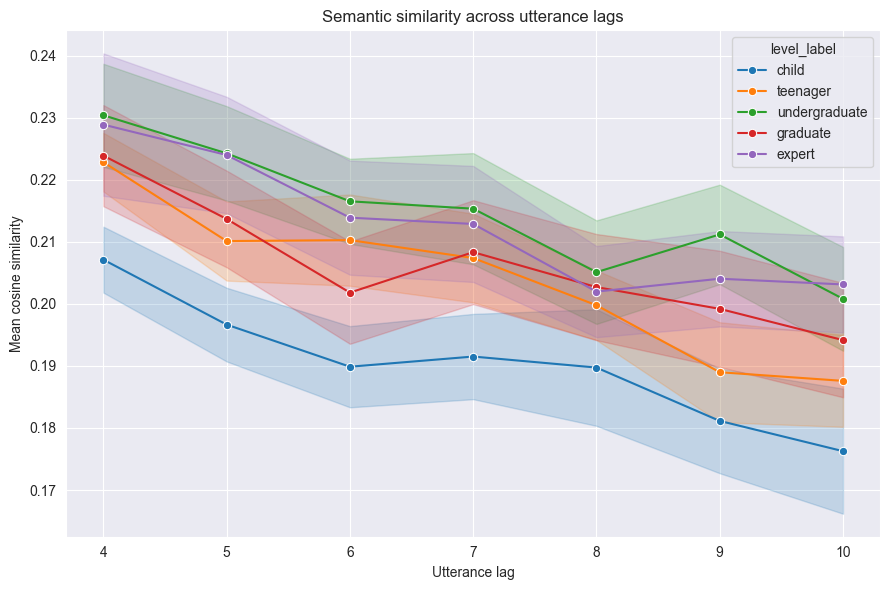

In [73]:
plt.figure(figsize=(9, 6))

sns.lineplot(
    data=recurrence_lag_df,
    x="lag",
    y="similarity",
    hue="level_label",
    hue_order=level_order,
    estimator="mean",
    errorbar=("se", 1),
    marker="o",
)

plt.xlabel("Utterance lag")
plt.ylabel("Mean cosine similarity")
plt.title("Semantic similarity across utterance lags")
plt.tight_layout()
plt.show()

interpretation: slow decline -> semantic material remains active over longer spans
lower curve -> faster semantic departure

In [74]:
#speaker transition plot
transition_long = conversation_dynamics.melt(
    id_vars=[
        "dataset",
        "video_id",
        "conversation_id",
        "level_label",
    ],
    value_vars=[
        "expert_to_learner_step_mean",
        "learner_to_expert_step_mean",
    ],
    var_name="transition",
    value_name="mean_step_distance",
)

transition_long["transition"] = (
    transition_long["transition"].map({
        "expert_to_learner_step_mean":
            "Expert → learner",

        "learner_to_expert_step_mean":
            "Learner → expert",
    })
)

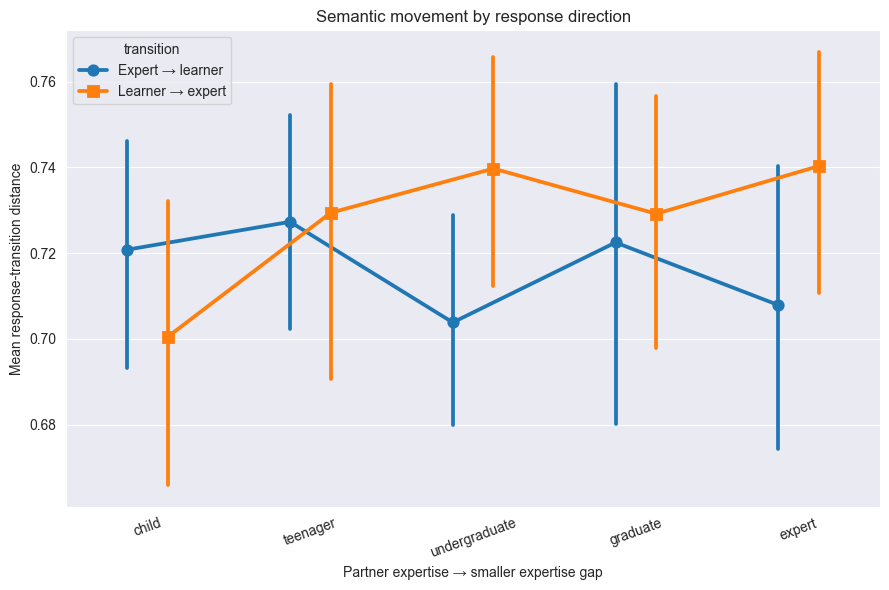

In [75]:
plt.figure(figsize=(9, 6))

sns.pointplot(
    data=transition_long,
    x="level_label",
    y="mean_step_distance",
    hue="transition",
    order=level_order,
    errorbar=("ci", 95),
    dodge=0.25,
    markers=["o", "s"],
)

plt.xlabel(
    "Partner expertise → smaller expertise gap"
)
plt.ylabel("Mean response-transition distance")
plt.title("Semantic movement by response direction")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

interpretation: learner to expert higher -> expert response introduce more semantic movement. if lines converge as expertise increases, it would suggest that response direction asymmetry shrinks with gap. diverging lines would suggest more asymmetry

## change focus to time windows

previous part looks at OVERALL CONVERSATION'S TRAJECTORY. now look at HOW local geometry changes from beginning to end

divide each convo into 5 windows, each containing 20% of the conversation.(important to note that this can cause issues since utterance count/amount of text within each window will differ)

In [76]:
import numpy as np
import pandas as pd

n_windows = 5

window_count_records = []

for group_key, group in geometry_utterances.groupby(
    ["dataset", "conversation_id"],
    sort=False,
    observed=True,
):
    dataset, conversation_id = group_key

    group = (
        group
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    window_positions = np.array_split(
        np.arange(len(group)),
        n_windows,
    )

    for window_index, positions in enumerate(
        window_positions,
        start=1,
    ):
        row = {
            "dataset": dataset,
            "conversation_id": conversation_id,
            "window_index": window_index,
            "n_window_utterances": len(positions),
        }

        for column in [
            "video_id",
            "level",
            "level_label",
        ]:
            if column in group.columns:
                row[column] = group[column].iloc[0]

        window_count_records.append(row)


window_counts = pd.DataFrame(
    window_count_records
)

display(
    window_counts[
        "n_window_utterances"
    ].describe()
)

display(
    window_counts.sort_values(
        "n_window_utterances"
    ).head(20)
)

count    525.000000
mean      12.160000
std        5.302052
min        2.000000
25%        9.000000
50%       11.000000
75%       15.000000
max       30.000000
Name: n_window_utterances, dtype: float64

,dataset,conversation_id,window_index,n_window_utterances,video_id,level,level_label
384,wired,wired_neuro_13,5,2,neuro,1,teenager
379,wired,wired_neuro_12,5,2,neuro,0,child
378,wired,wired_neuro_12,4,2,neuro,0,child
383,wired,wired_neuro_13,4,2,neuro,1,teenager
377,wired,wired_neuro_12,3,2,neuro,0,child
375,wired,wired_neuro_12,1,3,neuro,0,child
393,wired,wired_neuro_15,4,3,neuro,3,graduate
392,wired,wired_neuro_15,3,3,neuro,3,graduate
380,wired,wired_neuro_13,1,3,neuro,1,teenager
394,wired,wired_neuro_15,5,3,neuro,3,graduate


In [77]:
print("Number of windows:", len(window_counts))

print(
    window_counts.groupby(
        ["dataset", "conversation_id"]
    ).size().value_counts()
)

Number of windows: 525
5    105
Name: count, dtype: int64


In [78]:
target_m = 20

minimum_window_size = int(
    window_counts[
        "n_window_utterances"
    ].min()
)

m_per_window = min(
    target_m,
    minimum_window_size,
)

print("Smallest window:", minimum_window_size)
print("Utterances sampled per window:", m_per_window)

Smallest window: 2
Utterances sampled per window: 2


In [79]:
candidate_windows = [5, 4, 3]
candidate_m = [8, 10, 12, 15, 20]

design_records = []

for candidate_n_windows in candidate_windows:
    for candidate_sample_size in candidate_m:
        required_utterances = (
            candidate_n_windows
            * candidate_sample_size
        )

        temporary = conversation_sizes.copy()

        temporary["eligible"] = (
            temporary["n_utterances"]
            >= required_utterances
        )

        video_summary = (
            temporary
            .groupby(
                ["dataset", "video_id"],
                observed=True,
            )
            .agg(
                n_levels=(
                    "level_label",
                    "nunique",
                ),
                all_levels_eligible=(
                    "eligible",
                    "all",
                ),
            )
            .reset_index()
        )

        fully_matched_videos = (
            video_summary[
                (
                    video_summary["n_levels"] == 5
                )
                &
                (
                    video_summary[
                        "all_levels_eligible"
                    ]
                )
            ]
        )

        design_records.append({
            "n_windows":
                candidate_n_windows,

            "m_per_window":
                candidate_sample_size,

            "required_utterances":
                required_utterances,

            "eligible_conversations":
                int(
                    temporary[
                        "eligible"
                    ].sum()
                ),

            "eligible_conversations_percent":
                100 * temporary[
                    "eligible"
                ].mean(),

            "fully_matched_videos":
                len(fully_matched_videos),

            "matched_conversations":
                5 * len(
                    fully_matched_videos
                ),
        })


design_comparison = pd.DataFrame(
    design_records
)

display(
    design_comparison.sort_values(
        [
            "n_windows",
            "m_per_window",
        ],
        ascending=[
            False,
            True,
        ],
    )
)

NameError: name 'conversation_sizes' is not defined

In [ ]:
window_metrics = [
    "pairwise_distance_mean",
    "pairwise_distance_sd",
    "radial_distance_q90",
    "nearest_neighbor_distance_mean",
    "knn_distance_median",
    "spectral_entropy_normalized",
    "participation_ratio",
    "pc1_variance_share",
]

In [ ]:
n_windows = 3
m_per_window = 10
n_resamples = 200

In [ ]:
eligibility_by_level = (
    conversation_sizes
    .groupby(
        "level_label",
        observed=True,
    )
    .agg(
        total_conversations=(
            "conversation_id",
            "count",
        ),
        eligible_conversations=(
            "eligible_stage2",
            "sum",
        ),
    )
)

eligibility_by_level[
    "eligible_percent"
] = (
    100
    * eligibility_by_level[
        "eligible_conversations"
    ]
    / eligibility_by_level[
        "total_conversations"
    ]
)

display(eligibility_by_level)

In [ ]:
video_eligibility = (
    conversation_sizes
    .groupby(
        ["dataset", "video_id"],
        observed=True,
    )
    .agg(
        n_levels=(
            "level_label",
            "nunique",
        ),
        all_eligible=(
            "eligible_stage2",
            "all",
        ),
    )
    .reset_index()
)

retained_videos = video_eligibility[
    (
        video_eligibility["n_levels"] == 5
    )
    &
    (
        video_eligibility["all_eligible"]
    )
][
    ["dataset", "video_id"]
].copy()

print(
    "Matched videos retained:",
    len(retained_videos),
)

In [ ]:
stage2_utterances_matched = (
    geometry_utterances
    .merge(
        retained_videos,
        on=[
            "dataset",
            "video_id",
        ],
        how="inner",
    )
    .copy()
)

print(
    "Matched conversations:",
    stage2_utterances_matched[
        ["dataset", "conversation_id"]
    ].drop_duplicates().shape[0]
)

In [ ]:
eligible_conversation_keys = (
    conversation_sizes[
        conversation_sizes[
            "eligible_stage2"
        ]
    ][
        ["dataset", "conversation_id"]
    ]
)

stage2_utterances_unbalanced = (
    geometry_utterances
    .merge(
        eligible_conversation_keys,
        on=[
            "dataset",
            "conversation_id",
        ],
        how="inner",
    )
    .copy()
)

print(
    "Eligible conversations:",
    stage2_utterances_unbalanced[
        ["dataset", "conversation_id"]
    ].drop_duplicates().shape[0]
)

In [ ]:
grouped_conversations = (
    stage2_utterances_matched
    .groupby(
        ["dataset", "conversation_id"],
        sort=False,
        observed=True,
    )
)
n_windows = 3
m_per_window = 10
n_resamples = 200

In [ ]:
window_geometry_records = []
window_metric_draws = {}

grouped_conversations = (
    stage2_utterances_matched
    .groupby(
        ["dataset", "conversation_id"],
        sort=False,
        observed=True,
    )
)

for group_number, (group_key, group) in enumerate(
    grouped_conversations
):
    dataset, conversation_id = group_key

    # Preserve chronological order
    group = (
        group
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    embedding_indices = group[
        "embedding_idx"
    ].to_numpy(dtype=int)

    conversation_embeddings = (
        E_utterances[embedding_indices]
    )

    # Divide into beginning, middle, and end
    window_positions_list = np.array_split(
        np.arange(len(group)),
        n_windows,
    )

    for zero_based_window, window_positions in enumerate(
        window_positions_list
    ):
        window_index = zero_based_window + 1

        assert len(window_positions) >= m_per_window

        # Reproducible independent RNG per window
        seed_sequence = np.random.SeedSequence([
            2026,
            group_number,
            window_index,
        ])

        rng = np.random.default_rng(
            seed_sequence
        )

        # If exactly 10 utterances exist, there is only
        # one possible sample.
        repetitions_used = (
            1
            if len(window_positions) == m_per_window
            else n_resamples
        )

        draw_records = []

        for repetition in range(repetitions_used):
            sampled_positions = rng.choice(
                window_positions,
                size=m_per_window,
                replace=False,
            )

            sampled_embeddings = (
                conversation_embeddings[
                    sampled_positions
                ]
            )

            scalar_metrics, _ = (
                calculate_conversation_geometry(
                    sampled_embeddings,
                    k=5,
                )
            )

            draw_records.append({
                "repetition": repetition,
                **{
                    metric:
                        scalar_metrics[metric]
                    for metric in window_metrics
                },
            })

        draws_df = pd.DataFrame(
            draw_records
        )

        row = {
            "dataset": dataset,
            "conversation_id": conversation_id,
            "window_index": window_index,

            # Actual proportional midpoint:
            # 1/6, 1/2, 5/6
            "window_midpoint": (
                zero_based_window + 0.5
            ) / n_windows,

            # Beginning=0, middle=0.5, end=1
            "time_linear": (
                zero_based_window
                / (n_windows - 1)
            ),

            # Beginning=-0.5, middle=0, end=0.5
            "time_c": (
                zero_based_window
                / (n_windows - 1)
                - 0.5
            ),

            "n_window_utterances":
                len(window_positions),

            "m_sampled":
                m_per_window,

            "n_resamples_used":
                repetitions_used,
        }

        # Retain conversation metadata
        for column in [
            "video_id",
            "file_number",
            "level",
            "level_label",
        ]:
            if column in group.columns:
                row[column] = group[
                    column
                ].iloc[0]

        # Average the repeated subsample estimates
        for metric in window_metrics:
            values = draws_df[
                metric
            ].to_numpy(dtype=float)

            row[metric] = float(
                np.nanmean(values)
            )

            # Monte Carlo/subsampling variability
            row[f"{metric}_mc_sd"] = (
                float(
                    np.nanstd(
                        values,
                        ddof=1,
                    )
                )
                if np.isfinite(values).sum() > 1
                else np.nan
            )

        window_geometry_records.append(row)

        # Retain individual draws for reliability checks
        window_metric_draws[
            (
                dataset,
                conversation_id,
                window_index,
            )
        ] = draws_df

In [ ]:
window_geometry = pd.DataFrame(
    window_geometry_records
)

window_geometry = (
    window_geometry
    .sort_values([
        "dataset",
        "conversation_id",
        "window_index",
    ])
    .reset_index(drop=True)
)

display(window_geometry)

In [ ]:
assert window_geometry[
    "pairwise_distance_mean"
].between(0, 2).all()

assert window_geometry[
    "nearest_neighbor_distance_mean"
].between(0, 2).all()

assert window_geometry[
    "spectral_entropy_normalized"
].between(0, 1).all()

assert window_geometry[
    "pc1_variance_share"
].between(0, 1).all()

assert window_geometry[
    "participation_ratio"
].between(1, 9).all()

In [ ]:
reliability_records = []

for metric in window_metrics:
    mc_column = f"{metric}_mc_sd"

    reliability_records.append({
        "metric": metric,

        "median_mc_sd":
            window_geometry[
                mc_column
            ].median(),

        "q90_mc_sd":
            window_geometry[
                mc_column
            ].quantile(0.90),

        "maximum_mc_sd":
            window_geometry[
                mc_column
            ].max(),
    })

window_reliability = pd.DataFrame(
    reliability_records
)

display(window_reliability)


In [ ]:
window_geometry

summary: evaluated window design options. since some conversations were just too short, only included videos that fit the design with three sections, ten utterances per window. 16 videos were eligible. the ten utterances in each window were sampled without replacement and the sampling was repeated 200 times(reduces dependence on one arbitrary selection of utterances). resulting estimates were averaged across repetitions, and standard deviation across repetitions was retained as a measure of subsampling variability.window-level metrics were calculated for each (mean and standard deviation of pairwise cosine distance, radial Q90 distance, mean nearest-neighbor distance, median k-nearest-neighbor distance, normalized spectral entropy, participation ratio, and PC1 variance share.)

## visualizing window level stuff

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

level_order = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert",
]

level_palette = dict(
    zip(
        level_order,
        sns.color_palette(
            "viridis",
            len(level_order),
        ),
    )
)

window_plot_df = window_geometry.copy()

window_plot_df["level_label"] = (
    window_plot_df["level_label"]
    .astype(str)
    .str.lower()
)

window_plot_df["window_label"] = (
    window_plot_df["window_index"].map({
        1: "Beginning",
        2: "Middle",
        3: "End",
    })
)

window_plot_df["video_group"] = (
    window_plot_df["dataset"].astype(str)
    + "::"
    + window_plot_df["video_id"].astype(str)
)

window_plot_df["conversation_group"] = (
    window_plot_df["dataset"].astype(str)
    + "::"
    + window_plot_df[
        "conversation_id"
    ].astype(str)
)

In [ ]:
#mean developmental trajectories
def plot_window_development(
    df,
    metric,
    ylabel=None,
):
    fig, ax = plt.subplots(
        figsize=(9, 6)
    )

    sns.lineplot(
        data=df,
        x="window_index",
        y=metric,
        hue="level_label",
        hue_order=level_order,
        palette=level_palette,
        estimator="mean",
        errorbar=("ci", 95),
        marker="o",
        markersize=8,
        linewidth=2.5,
        ax=ax,
    )

    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels([
        "Beginning",
        "Middle",
        "End",
    ])

    ax.set_xlabel("Conversation stage")
    ax.set_ylabel(ylabel or metric)
    ax.set_title(
        f"{ylabel or metric} across the conversation"
    )

    ax.legend(
        title="Partner expertise",
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
    )

    plt.tight_layout()
    plt.show()

In [ ]:
plot_window_development(
    window_plot_df,
    metric="pc1_variance_share",
    ylabel="PC1 variance share",
)

In [ ]:
window_metric_labels = {
    "pairwise_distance_mean":
        "Mean pairwise distance",

    "pairwise_distance_sd":
        "Pairwise-distance SD",

    "radial_distance_q90":
        "Radial Q90",

    "nearest_neighbor_distance_mean":
        "Mean NN distance",

    "knn_distance_median":
        "Median kNN distance",

    "spectral_entropy_normalized":
        "Normalized spectral entropy",

    "participation_ratio":
        "Participation ratio",

    "pc1_variance_share":
        "PC1 variance share",
}

In [ ]:
fig, axes = plt.subplots(
    4,
    2,
    figsize=(14, 20),
)

axes = axes.flatten()

for ax, (metric, label) in zip(
    axes,
    window_metric_labels.items(),
):
    sns.lineplot(
        data=window_plot_df,
        x="window_index",
        y=metric,
        hue="level_label",
        hue_order=level_order,
        palette=level_palette,
        estimator="mean",
        errorbar=None,
        marker="o",
        linewidth=2,
        ax=ax,
        legend=False,
    )

    ax.set_xticks([1, 2, 3])
    ax.set_xticklabels([
        "Beginning",
        "Middle",
        "End",
    ])

    ax.set_xlabel("")
    ax.set_ylabel(label)
    ax.set_title(label)

# One shared legend
handles = [
    plt.Line2D(
        [0],
        [0],
        color=level_palette[level],
        marker="o",
        linewidth=2,
        label=level,
    )
    for level in level_order
]

fig.legend(
    handles=handles,
    labels=level_order,
    title="Partner expertise",
    loc="center right",
)

plt.tight_layout(
    rect=[0, 0, 0.88, 1]
)

plt.show()

## individual video trajectories

In [ ]:
def plot_video_window_trajectories(
    df,
    metric,
    ylabel=None,
):
    fig, axes = plt.subplots(
        1,
        5,
        figsize=(18, 4),
        sharex=True,
        sharey=True,
    )

    for ax, level in zip(
        axes,
        level_order,
    ):
        level_df = df[
            df["level_label"] == level
        ]

        for _, video_df in level_df.groupby(
            "video_group"
        ):
            video_df = video_df.sort_values(
                "window_index"
            )

            ax.plot(
                video_df["window_index"],
                video_df[metric],
                color=level_palette[level],
                alpha=0.25,
                linewidth=1,
                marker="o",
                markersize=3,
            )

        level_mean = (
            level_df
            .groupby("window_index")[metric]
            .mean()
        )

        ax.plot(
            level_mean.index,
            level_mean.values,
            color="black",
            linewidth=3,
            marker="o",
            markersize=6,
        )

        ax.set_title(level)
        ax.set_xticks([1, 2, 3])
        ax.set_xticklabels([
            "Beginning",
            "Middle",
            "End",
        ], rotation=30)

    axes[0].set_ylabel(
        ylabel or metric
    )

    fig.suptitle(
        ylabel or metric,
        y=1.05,
    )

    plt.tight_layout()
    plt.show()

In [ ]:
plot_video_window_trajectories(
    window_plot_df,
    "spectral_entropy_normalized",
    "Normalized spectral entropy",
)

In [ ]:
#beginning to end changes
def calculate_window_changes(
    df,
    metric,
):
    change_df = (
        df.pivot(
            index=[
                "dataset",
                "video_id",
                "conversation_id",
                "level_label",
                "video_group",
            ],
            columns="window_index",
            values=metric,
        )
        .dropna(
            subset=[1, 3]
        )
        .reset_index()
    )

    change_df["beginning"] = (
        change_df[1]
    )

    change_df["middle"] = (
        change_df[2]
    )

    change_df["end"] = (
        change_df[3]
    )

    change_df["end_minus_beginning"] = (
        change_df["end"]
        - change_df["beginning"]
    )

    return change_df

In [ ]:
def plot_beginning_end_changes(
    df,
    metric,
    ylabel=None,
):
    change_df = calculate_window_changes(
        df,
        metric,
    )

    fig, ax = plt.subplots(
        figsize=(9, 6)
    )

    sns.boxplot(
        data=change_df,
        x="level_label",
        y="end_minus_beginning",
        order=level_order,
        showfliers=False,
        color="lightgray",
        ax=ax,
    )

    sns.stripplot(
        data=change_df,
        x="level_label",
        y="end_minus_beginning",
        order=level_order,
        hue="level_label",
        hue_order=level_order,
        palette=level_palette,
        jitter=0.15,
        size=5,
        alpha=0.75,
        legend=False,
        ax=ax,
    )

    ax.axhline(
        0,
        color="black",
        linestyle="--",
    )

    ax.set_xlabel(
        "Partner expertise → smaller expertise gap"
    )

    ax.set_ylabel(
        f"End − beginning\n"
        f"({ylabel or metric})"
    )

    ax.set_title(
        "Beginning-to-end geometric change"
    )

    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()

In [ ]:
plot_beginning_end_changes(
    window_plot_df,
    "participation_ratio",
    "Participation ratio",
)

In [ ]:
def plot_matched_change_trajectories(
    df,
    metric,
    ylabel=None,
):
    change_df = calculate_window_changes(
        df,
        metric,
    )

    level_x = {
        level: index
        for index, level in enumerate(
            level_order
        )
    }

    change_df["_level_x"] = (
        change_df["level_label"]
        .map(level_x)
    )

    fig, ax = plt.subplots(
        figsize=(9, 6)
    )

    for _, video_df in change_df.groupby(
        "video_group"
    ):
        video_df = video_df.sort_values(
            "_level_x"
        )

        ax.plot(
            video_df["_level_x"],
            video_df[
                "end_minus_beginning"
            ],
            color="gray",
            alpha=0.3,
            linewidth=1,
            marker="o",
            markersize=3,
        )

    mean_change = (
        change_df
        .groupby("_level_x")[
            "end_minus_beginning"
        ]
        .mean()
        .reindex(range(5))
    )

    ax.plot(
        range(5),
        mean_change,
        color="black",
        linewidth=3,
        marker="o",
        markersize=7,
    )

    ax.axhline(
        0,
        color="red",
        linestyle="--",
    )

    ax.set_xticks(range(5))
    ax.set_xticklabels(
        level_order,
        rotation=20,
    )

    ax.set_xlabel(
        "Partner expertise → smaller expertise gap"
    )

    ax.set_ylabel(
        f"End − beginning\n"
        f"({ylabel or metric})"
    )

    ax.set_title(
        "Matched developmental changes"
    )

    plt.tight_layout()
    plt.show()

In [ ]:
window_plot_df

In [ ]:
plot_matched_change_trajectories(window_plot_df, "nearest_neighbor_distance_mean")

In [ ]:
def plot_change_heatmap(
    df,
    metric,
    label=None,
):
    change_df = calculate_window_changes(
        df,
        metric,
    )

    change_matrix = (
        change_df.pivot(
            index="video_group",
            columns="level_label",
            values="end_minus_beginning",
        )
        .reindex(columns=level_order)
    )

    # Order videos by their average change
    row_order = (
        change_matrix.mean(axis=1)
        .sort_values()
        .index
    )

    change_matrix = change_matrix.loc[
        row_order
    ]

    maximum_absolute_value = np.nanmax(
        np.abs(change_matrix.to_numpy())
    )

    plt.figure(figsize=(9, 9))

    sns.heatmap(
        change_matrix,
        cmap="coolwarm",
        center=0,
        vmin=-maximum_absolute_value,
        vmax=maximum_absolute_value,
        linewidths=0.5,
        cbar_kws={
            "label":
                "End − beginning"
        },
    )

    plt.xlabel("Partner expertise")
    plt.ylabel("Video/topic")
    plt.title(
        label or metric
    )

    plt.tight_layout()
    plt.show()

# response-focus metrics

In [ ]:
stage3_source = (
    stage2_utterances_matched.copy()
)

role_map = {
    "expert": "expert",
    "partner": "partner",
    "learner": "partner",
}

stage3_source["_role"] = (
    stage3_source["speaker_role"]
    .astype(str)
    .str.strip()
    .str.lower()
    .map(role_map)
)

print(
    stage3_source["_role"]
    .value_counts(dropna=False)
)

assert stage3_source["_role"].notna().all()

collapse utterances into turns

In [109]:
turn_records = []
turn_embedding_list = []

conversation_groups = (
    stage3_source.groupby(
        ["dataset", "conversation_id"],
        sort=False,
        observed=True,
    )
)

for group_key, group in conversation_groups:
    dataset, conversation_id = group_key

    group = (
        group
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .reset_index(drop=True)
        .copy()
    )

    # A new turn begins whenever the speaker changes.
    group["_new_turn"] = (
        group["_role"]
        .ne(group["_role"].shift())
    )

    group["_turn_order"] = (
        group["_new_turn"]
        .cumsum()
        .astype(int)
        - 1
    )

    for turn_order, turn_group in group.groupby(
        "_turn_order",
        sort=True,
    ):
        embedding_indices = turn_group[
            "embedding_idx"
        ].to_numpy(dtype=int)

        utterance_embeddings = (
            E_utterances[
                embedding_indices
            ]
        )

        turn_centroid = (
            utterance_embeddings.mean(axis=0)
        )

        turn_resultant_length = float(
            np.linalg.norm(turn_centroid)
        )

        if turn_resultant_length == 0:
            raise ValueError(
                f"Zero-norm turn embedding in "
                f"{conversation_id}, turn {turn_order}"
            )

        turn_embedding = (
            turn_centroid
            / turn_resultant_length
        )

        turn_embedding_idx = len(
            turn_embedding_list
        )

        turn_embedding_list.append(
            turn_embedding
        )

        row = {
            "dataset": dataset,
            "conversation_id": conversation_id,
            "turn_order": int(turn_order),
            "turn_embedding_idx":
                turn_embedding_idx,

            "speaker_role":
                turn_group["_role"].iloc[0],

            "n_utterances_in_turn":
                len(turn_group),

            # Within-turn semantic concentration
            "turn_resultant_length":
                turn_resultant_length,

            "first_embedding_idx":
                int(embedding_indices.min()),

            "last_embedding_idx":
                int(embedding_indices.max()),
        }

        if "text" in turn_group.columns:
            row["turn_text"] = " ".join(
                turn_group["text"].astype(str)
            )

            row["n_words_in_turn"] = int(
                turn_group["text"]
                .astype(str)
                .str.split()
                .str.len()
                .sum()
            )

        for column in [
            "video_id",
            "file_number",
            "level",
            "level_label",
        ]:
            if column in turn_group.columns:
                row[column] = turn_group[
                    column
                ].iloc[0]

        turn_records.append(row)


turns = pd.DataFrame(
    turn_records
)

E_turns = np.vstack(
    turn_embedding_list
).astype(np.float64)

turns = (
    turns
    .sort_values([
        "dataset",
        "conversation_id",
        "turn_order",
    ])
    .reset_index(drop=True)
)

print("Turns:", len(turns))
print("Turn embeddings:", E_turns.shape)

display(turns.head())

NameError: name 'stage3_source' is not defined

In [ ]:
assert len(turns) == len(E_turns)

assert np.allclose(
    np.linalg.norm(E_turns, axis=1),
    1.0,
    atol=1e-10,
)

# Every turn must contain only one role.
assert turns["speaker_role"].isin(
    ["expert", "partner"]
).all()

In [ ]:
alternation_checks = []

for _, group in turns.groupby(
    ["dataset", "conversation_id"],
    observed=True,
):
    roles = group.sort_values(
        "turn_order"
    )["speaker_role"].to_numpy()

    alternation_checks.append(
        np.all(roles[1:] != roles[:-1])
    )

assert all(alternation_checks)

response transition table

calculate metrics for the transitions

In [ ]:
def normalized_recent_centroid(
    X,
    indices,
    history_k=3,
):
    indices = np.asarray(
        indices,
        dtype=int,
    )

    if len(indices) == 0:
        return None

    recent_indices = indices[
        -history_k:
    ]

    centroid = X[
        recent_indices
    ].mean(axis=0)

    centroid_norm = np.linalg.norm(
        centroid
    )

    if centroid_norm == 0:
        return None

    return centroid / centroid_norm


def cosine_similarity(first, second):
    return float(
        np.clip(
            np.dot(first, second),
            -1.0,
            1.0,
        )
    )


def cosine_distance(first, second):
    return float(
        1.0
        - cosine_similarity(
            first,
            second,
        )
    )

In [ ]:
history_k = 3
transition_records = []

for group_key, group in turns.groupby(
    ["dataset", "conversation_id"],
    sort=False,
    observed=True,
):
    dataset, conversation_id = group_key

    group = (
        group
        .sort_values("turn_order")
        .reset_index(drop=True)
    )

    embedding_indices = group[
        "turn_embedding_idx"
    ].to_numpy(dtype=int)

    X = E_turns[
        embedding_indices
    ]

    roles = group[
        "speaker_role"
    ].to_numpy()

    n_turns = len(group)
    n_transitions = n_turns - 1

    if n_transitions < 1:
        continue

    for current_index in range(
        1,
        n_turns,
    ):
        source_index = current_index - 1

        source_role = roles[
            source_index
        ]

        responder_role = roles[
            current_index
        ]

        source_embedding = X[
            source_index
        ]

        response_embedding = X[
            current_index
        ]

        response_similarity = (
            cosine_similarity(
                response_embedding,
                source_embedding,
            )
        )

        response_distance = (
            1.0 - response_similarity
        )

        # --------------------------------------------------------
        # Responder's previous turn
        # --------------------------------------------------------

        previous_own_indices = np.flatnonzero(
            roles[:current_index]
            == responder_role
        )

        if len(previous_own_indices):
            previous_own_index = int(
                previous_own_indices[-1]
            )

            self_similarity = (
                cosine_similarity(
                    response_embedding,
                    X[previous_own_index],
                )
            )

            self_update_distance = (
                1.0 - self_similarity
            )

            immediate_accommodation = (
                response_similarity
                - self_similarity
            )

        else:
            previous_own_index = None
            self_similarity = np.nan
            self_update_distance = np.nan
            immediate_accommodation = np.nan

        # --------------------------------------------------------
        # Recent speaker-history centroids
        # --------------------------------------------------------

        previous_other_indices = np.flatnonzero(
            roles[:current_index]
            != responder_role
        )

        own_history_centroid = (
            normalized_recent_centroid(
                X,
                previous_own_indices,
                history_k=history_k,
            )
        )

        other_history_centroid = (
            normalized_recent_centroid(
                X,
                previous_other_indices,
                history_k=history_k,
            )
        )

        if (
            own_history_centroid is not None
            and other_history_centroid is not None
        ):
            own_history_similarity = (
                cosine_similarity(
                    response_embedding,
                    own_history_centroid,
                )
            )

            other_history_similarity = (
                cosine_similarity(
                    response_embedding,
                    other_history_centroid,
                )
            )

            history_accommodation = (
                other_history_similarity
                - own_history_similarity
            )
        else:
            own_history_similarity = np.nan
            other_history_similarity = np.nan
            history_accommodation = np.nan

        # --------------------------------------------------------
        # Expert–partner centroid convergence
        # --------------------------------------------------------

        before_expert_indices = np.flatnonzero(
            roles[:current_index]
            == "expert"
        )

        before_partner_indices = np.flatnonzero(
            roles[:current_index]
            == "partner"
        )

        after_expert_indices = np.flatnonzero(
            roles[:current_index + 1]
            == "expert"
        )

        after_partner_indices = np.flatnonzero(
            roles[:current_index + 1]
            == "partner"
        )

        expert_before = normalized_recent_centroid(
            X,
            before_expert_indices,
            history_k=history_k,
        )

        partner_before = normalized_recent_centroid(
            X,
            before_partner_indices,
            history_k=history_k,
        )

        expert_after = normalized_recent_centroid(
            X,
            after_expert_indices,
            history_k=history_k,
        )

        partner_after = normalized_recent_centroid(
            X,
            after_partner_indices,
            history_k=history_k,
        )

        if (
            expert_before is not None
            and partner_before is not None
        ):
            role_distance_before = (
                cosine_distance(
                    expert_before,
                    partner_before,
                )
            )
        else:
            role_distance_before = np.nan

        if (
            expert_after is not None
            and partner_after is not None
        ):
            role_distance_after = (
                cosine_distance(
                    expert_after,
                    partner_after,
                )
            )
        else:
            role_distance_after = np.nan

        if (
            np.isfinite(role_distance_before)
            and np.isfinite(role_distance_after)
        ):
            convergence_contribution = (
                role_distance_before
                - role_distance_after
            )
        else:
            convergence_contribution = np.nan

        # --------------------------------------------------------
        # Normalized response time
        # --------------------------------------------------------

        if n_transitions > 1:
            time_linear = (
                current_index - 1
            ) / (n_transitions - 1)
        else:
            time_linear = 0.5

        time_c = (
            time_linear - 0.5
        )

        window_index = min(
            int(
                np.floor(
                    time_linear * 3
                )
            )
            + 1,
            3,
        )

        row = {
            "dataset": dataset,
            "conversation_id":
                conversation_id,

            "transition_order":
                current_index,

            "source_role":
                source_role,

            "responder_role":
                responder_role,

            "transition_type":
                f"{source_role}_to_"
                f"{responder_role}",

            "time_linear":
                time_linear,

            "time_c":
                time_c,

            "window_index":
                window_index,

            "response_similarity":
                response_similarity,

            "response_distance":
                response_distance,

            "self_similarity":
                self_similarity,

            "self_update_distance":
                self_update_distance,

            "immediate_accommodation_index":
                immediate_accommodation,

            "own_history_similarity":
                own_history_similarity,

            "other_history_similarity":
                other_history_similarity,

            "history_accommodation_index":
                history_accommodation,

            "rolling_role_centroid_distance_before":
                role_distance_before,

            "rolling_role_centroid_distance_after":
                role_distance_after,

            "convergence_contribution":
                convergence_contribution,
        }

        for column in [
            "video_id",
            "file_number",
            "level",
            "level_label",
        ]:
            if column in group.columns:
                row[column] = group[
                    column
                ].iloc[0]

        transition_records.append(row)


turn_transitions = pd.DataFrame(
    transition_records
)

turn_transitions = (
    turn_transitions
    .sort_values([
        "dataset",
        "conversation_id",
        "transition_order",
    ])
    .reset_index(drop=True)
)

display(turn_transitions.head())

In [ ]:
#validation
print(
    "Transitions:",
    len(turn_transitions)
)

print(
    turn_transitions[
        "transition_type"
    ].value_counts()
)

print(
    turn_transitions[
        [
            "response_distance",
            "self_update_distance",
            "immediate_accommodation_index",
            "history_accommodation_index",
            "convergence_contribution",
        ]
    ].isna().sum()
)

In [ ]:
assert set(
    turn_transitions[
        "transition_type"
    ].unique()
).issubset({
    "expert_to_partner",
    "partner_to_expert",
})

In [ ]:
assert turn_transitions[
    "response_distance"
].between(0, 2).all()

In [ ]:
response_window_geometry = (
    turn_transitions
    .groupby(
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
            "window_index",
            "responder_role",
        ],
        observed=True,
    )
    .agg(
        n_responses=(
            "response_distance",
            "size",
        ),

        response_distance_mean=(
            "response_distance",
            "mean",
        ),

        response_distance_sd=(
            "response_distance",
            "std",
        ),

        n_self_updates=(
            "self_update_distance",
            "count",
        ),

        self_update_distance_mean=(
            "self_update_distance",
            "mean",
        ),

        immediate_accommodation_mean=(
            "immediate_accommodation_index",
            "mean",
        ),

        n_history_accommodation=(
            "history_accommodation_index",
            "count",
        ),

        history_accommodation_mean=(
            "history_accommodation_index",
            "mean",
        ),

        n_convergence_contributions=(
            "convergence_contribution",
            "count",
        ),

        convergence_contribution_mean=(
            "convergence_contribution",
            "mean",
        ),
    )
    .reset_index()
)

In [ ]:
window_time_map = {
    1: -0.5,
    2: 0.0,
    3: 0.5,
}

gap_map = {
    "expert": 0,
    "graduate": 1,
    "undergraduate": 2,
    "teenager": 3,
    "child": 4,
}

response_window_geometry[
    "time_c"
] = (
    response_window_geometry[
        "window_index"
    ].map(window_time_map)
)

response_window_geometry[
    "level_label"
] = (
    response_window_geometry[
        "level_label"
    ]
    .astype(str)
    .str.lower()
)

response_window_geometry[
    "gap_score"
] = (
    response_window_geometry[
        "level_label"
    ].map(gap_map)
)

response_window_geometry[
    "gap_c"
] = (
    response_window_geometry[
        "gap_score"
    ]
    - 2
)

response_window_geometry[
    "responder_expert"
] = (
    response_window_geometry[
        "responder_role"
    ]
    == "expert"
).astype(int)

response_window_geometry[
    "video_group"
] = (
    response_window_geometry[
        "dataset"
    ].astype(str)
    + "::"
    + response_window_geometry[
        "video_id"
    ].astype(str)
)

response_window_geometry[
    "conversation_group"
] = (
    response_window_geometry[
        "dataset"
    ].astype(str)
    + "::"
    + response_window_geometry[
        "conversation_id"
    ].astype(str)
)

response_window_geometry[
    "window_group"
] = (
    response_window_geometry[
        "conversation_group"
    ]
    + "::"
    + response_window_geometry[
        "window_index"
    ].astype(str)
)

display(response_window_geometry.head())

In [ ]:
display(
    response_window_geometry[
        "n_responses"
    ].describe()
)

display(
    response_window_geometry[
        "n_responses"
    ].value_counts().sort_index()
)

In [ ]:
response_cells_primary = (
    response_window_geometry[
        response_window_geometry[
            "n_responses"
        ] >= 2
    ]
    .copy()
)

## model response distance

![img](img.png)

In [ ]:
import statsmodels.formula.api as smf


def prepare_stage3_outcome(
    df,
    outcome,
    count_column=None,
    minimum_count=2,
):
    model_df = df.copy()

    if count_column is not None:
        model_df = model_df[
            model_df[count_column]
            >= minimum_count
        ]

    required = [
        outcome,
        "gap_c",
        "time_c",
        "responder_expert",
        "video_group",
        "conversation_group",
        "window_group",
    ]

    model_df = (
        model_df[required]
        .dropna()
        .copy()
    )

    outcome_sd = model_df[
        outcome
    ].std(ddof=1)

    model_df["outcome_z"] = (
        model_df[outcome]
        - model_df[outcome].mean()
    ) / outcome_sd

    return model_df

In [ ]:
response_model_df = (
    prepare_stage3_outcome(
        response_window_geometry,
        outcome="response_distance_mean",
        count_column="n_responses",
        minimum_count=2,
    )
)

response_model = smf.mixedlm(
    (
        "outcome_z ~ "
        "gap_c * time_c * responder_expert"
    ),
    data=response_model_df,
    groups="video_group",
    re_formula="1",
    vc_formula={
        "conversation_intercept":
            "0 + C(conversation_group)",

        "window_intercept":
            "0 + C(window_group)",
    },
).fit(
    reml=True,
    method="lbfgs",
)

print(response_model.summary())

## model accommodation


In [ ]:
accommodation_model_df = (
    prepare_stage3_outcome(
        response_window_geometry,
        outcome=
            "history_accommodation_mean",
        count_column=
            "n_history_accommodation",
        minimum_count=2,
    )
)

accommodation_model = smf.mixedlm(
    (
        "outcome_z ~ "
        "gap_c * time_c * responder_expert"
    ),
    data=accommodation_model_df,
    groups="video_group",
    re_formula="1",
    vc_formula={
        "conversation_intercept":
            "0 + C(conversation_group)",

        "window_intercept":
            "0 + C(window_group)",
    },
).fit(
    reml=True,
    method="lbfgs",
)

print(accommodation_model.summary())

In [ ]:
#convergence contribution
convergence_model_df = (
    prepare_stage3_outcome(
        response_window_geometry,
        outcome=
            "convergence_contribution_mean",
        count_column=
            "n_convergence_contributions",
        minimum_count=2,
    )
)

convergence_model = smf.mixedlm(
    (
        "outcome_z ~ "
        "gap_c * time_c * responder_expert"
    ),
    data=convergence_model_df,
    groups="video_group",
    re_formula="1",
    vc_formula={
        "conversation_intercept":
            "0 + C(conversation_group)",

        "window_intercept":
            "0 + C(window_group)",
    },
).fit(
    reml=True,
    method="lbfgs",
)

print(convergence_model.summary())

In [ ]:
#OVERALL DYADIC ALIGNMENT. overall expert-partner distance within each window
alignment_window_geometry = (
    turn_transitions
    .groupby(
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
            "window_index",
        ],
        observed=True,
    )
    .agg(
        n_alignment_observations=(
            "rolling_role_centroid_distance_after",
            "count",
        ),

        rolling_role_centroid_distance_mean=(
            "rolling_role_centroid_distance_after",
            "mean",
        ),
    )
    .reset_index()
)

alignment_window_geometry[
    "time_c"
] = (
    alignment_window_geometry[
        "window_index"
    ].map(window_time_map)
)

alignment_window_geometry[
    "level_label"
] = (
    alignment_window_geometry[
        "level_label"
    ]
    .astype(str)
    .str.lower()
)

alignment_window_geometry[
    "gap_score"
] = (
    alignment_window_geometry[
        "level_label"
    ].map(gap_map)
)

alignment_window_geometry[
    "gap_c"
] = (
    alignment_window_geometry[
        "gap_score"
    ]
    - 2
)

alignment_window_geometry[
    "video_group"
] = (
    alignment_window_geometry[
        "dataset"
    ].astype(str)
    + "::"
    + alignment_window_geometry[
        "video_id"
    ].astype(str)
)

alignment_window_geometry[
    "conversation_group"
] = (
    alignment_window_geometry[
        "dataset"
    ].astype(str)
    + "::"
    + alignment_window_geometry[
        "conversation_id"
    ].astype(str)
)

In [ ]:
alignment_model_df = (
    alignment_window_geometry[
        alignment_window_geometry[
            "n_alignment_observations"
        ] >= 2
    ]
    .dropna(
        subset=[
            "rolling_role_centroid_distance_mean",
            "gap_c",
            "time_c",
        ]
    )
    .copy()
)

alignment_outcome = (
    "rolling_role_centroid_distance_mean"
)

alignment_model_df[
    "outcome_z"
] = (
    alignment_model_df[
        alignment_outcome
    ]
    - alignment_model_df[
        alignment_outcome
    ].mean()
) / alignment_model_df[
    alignment_outcome
].std(ddof=1)

In [ ]:
alignment_model = smf.mixedlm(
    "outcome_z ~ gap_c * time_c",
    data=alignment_model_df,
    groups="video_group",
    re_formula="1",
    vc_formula={
        "conversation_intercept":
            "0 + C(conversation_group)"
    },
).fit(
    reml=True,
    method="lbfgs",
)

print(alignment_model.summary())

## refocus on adaptation to "novelty"

In [ ]:
adaptation_records = []
history_k = 3

for group_key, group in turns.groupby(
    ["dataset", "conversation_id"],
    sort=False,
    observed=True,
):
    dataset, conversation_id = group_key

    group = (
        group
        .sort_values("turn_order")
        .reset_index(drop=True)
    )

    embedding_indices = group[
        "turn_embedding_idx"
    ].to_numpy(dtype=int)

    X = E_turns[embedding_indices]

    roles = group[
        "speaker_role"
    ].to_numpy()

    n_turns = len(group)
    n_transitions = n_turns - 1

    for current_index in range(
        1,
        n_turns,
    ):
        source_index = current_index - 1

        # We specifically want:
        # expert introduction → partner response
        if not (
            roles[source_index] == "expert"
            and roles[current_index] == "partner"
        ):
            continue

        expert_input = X[source_index]
        partner_response = X[current_index]

        previous_partner_indices = (
            np.flatnonzero(
                roles[:current_index]
                == "partner"
            )
        )

        # First partner response has no prior
        # articulated partner state.
        if len(previous_partner_indices):
            previous_partner_index = int(
                previous_partner_indices[-1]
            )

            previous_partner = X[
                previous_partner_index
            ]

            recent_partner_indices = (
                previous_partner_indices[
                    -history_k:
                ]
            )

            partner_history_centroid = (
                normalized_recent_centroid(
                    X,
                    recent_partner_indices,
                    history_k=history_k,
                )
            )

            # ------------------------------------------
            # Expert novelty relative to partner history
            # ------------------------------------------

            expert_novelty_to_centroid = (
                cosine_distance(
                    expert_input,
                    partner_history_centroid,
                )
            )

            similarities_to_recent_partner = (
                X[recent_partner_indices]
                @ expert_input
            )

            expert_novelty_to_nearest = float(
                1.0
                - np.max(
                    similarities_to_recent_partner
                )
            )

            # ------------------------------------------
            # Before-versus-after partner uptake
            # ------------------------------------------

            distance_before = cosine_distance(
                previous_partner,
                expert_input,
            )

            distance_after = cosine_distance(
                partner_response,
                expert_input,
            )

            uptake_closure = (
                distance_before
                - distance_after
            )

            if distance_before > 1e-12:
                relative_uptake_closure = (
                    uptake_closure
                    / distance_before
                )
            else:
                relative_uptake_closure = np.nan

            # ------------------------------------------
            # Direction of partner movement
            # ------------------------------------------

            partner_update_vector = (
                partner_response
                - previous_partner
            )

            expert_target_vector = (
                expert_input
                - previous_partner
            )

            update_norm = np.linalg.norm(
                partner_update_vector
            )

            target_norm = np.linalg.norm(
                expert_target_vector
            )

            if (
                update_norm > 1e-12
                and target_norm > 1e-12
            ):
                directional_adaptation = float(
                    np.clip(
                        np.dot(
                            partner_update_vector,
                            expert_target_vector,
                        )
                        / (
                            update_norm
                            * target_norm
                        ),
                        -1.0,
                        1.0,
                    )
                )
            else:
                directional_adaptation = np.nan

        else:
            previous_partner_index = None
            expert_novelty_to_centroid = np.nan
            expert_novelty_to_nearest = np.nan
            distance_before = np.nan
            distance_after = cosine_distance(
                partner_response,
                expert_input,
            )
            uptake_closure = np.nan
            relative_uptake_closure = np.nan
            directional_adaptation = np.nan

        # ----------------------------------------------
        # Forward alignment with the next expert turn
        # ----------------------------------------------

        later_expert_indices = (
            np.flatnonzero(
                roles[current_index + 1:]
                == "expert"
            )
            + current_index
            + 1
        )

        if len(later_expert_indices):
            next_expert_index = int(
                later_expert_indices[0]
            )

            next_expert = X[
                next_expert_index
            ]

            current_expert_similarity = (
                cosine_similarity(
                    partner_response,
                    expert_input,
                )
            )

            next_expert_similarity = (
                cosine_similarity(
                    partner_response,
                    next_expert,
                )
            )

            forward_alignment_excess = (
                next_expert_similarity
                - current_expert_similarity
            )
        else:
            next_expert_similarity = np.nan
            forward_alignment_excess = np.nan

        # ----------------------------------------------
        # Retention in the partner's next turn
        # ----------------------------------------------

        later_partner_indices = (
            np.flatnonzero(
                roles[current_index + 1:]
                == "partner"
            )
            + current_index
            + 1
        )

        if (
            len(later_partner_indices)
            and np.isfinite(distance_before)
        ):
            next_partner_index = int(
                later_partner_indices[0]
            )

            retained_distance = cosine_distance(
                X[next_partner_index],
                expert_input,
            )

            retained_uptake_closure = (
                distance_before
                - retained_distance
            )
        else:
            retained_distance = np.nan
            retained_uptake_closure = np.nan

        if n_transitions > 1:
            time_linear = (
                current_index - 1
            ) / (n_transitions - 1)
        else:
            time_linear = 0.5

        window_index = min(
            int(
                np.floor(
                    time_linear * 3
                )
            ) + 1,
            3,
        )

        row = {
            "dataset": dataset,
            "conversation_id":
                conversation_id,

            "expert_turn_order":
                source_index,

            "partner_response_turn_order":
                current_index,

            "time_linear":
                time_linear,

            "time_c":
                time_linear - 0.5,

            "window_index":
                window_index,

            "expert_novelty_to_centroid":
                expert_novelty_to_centroid,

            "expert_novelty_to_nearest":
                expert_novelty_to_nearest,

            "partner_distance_before":
                distance_before,

            "partner_distance_after":
                distance_after,

            "uptake_closure":
                uptake_closure,

            "relative_uptake_closure":
                relative_uptake_closure,

            "directional_adaptation":
                directional_adaptation,

            "next_expert_similarity":
                next_expert_similarity,

            "forward_alignment_excess":
                forward_alignment_excess,

            "retained_distance":
                retained_distance,

            "retained_uptake_closure":
                retained_uptake_closure,
        }

        for column in [
            "video_id",
            "file_number",
            "level",
            "level_label",
        ]:
            if column in group.columns:
                row[column] = group[
                    column
                ].iloc[0]

        adaptation_records.append(row)


partner_adaptation_events = pd.DataFrame(
    adaptation_records
)

partner_adaptation_events[
    "level_label"
] = (
    partner_adaptation_events[
        "level_label"
    ]
    .astype(str)
    .str.lower()
)

partner_adaptation_events[
    "window_label"
] = (
    partner_adaptation_events[
        "window_index"
    ].map({
        1: "Beginning",
        2: "Middle",
        3: "End",
    })
)

display(partner_adaptation_events.head())

In [ ]:
adaptation_valid = (
    partner_adaptation_events
    .dropna(
        subset=[
            "partner_distance_before",
            "partner_distance_after",
        ]
    )
)

g = sns.relplot(
    data=adaptation_valid,
    x="partner_distance_before",
    y="partner_distance_after",
    hue="level_label",
    hue_order=level_order,
    col="window_label",
    col_order=[
        "Beginning",
        "Middle",
        "End",
    ],
    palette=level_palette,
    alpha=0.45,
    s=35,
    height=4,
    aspect=1,
)

for ax in g.axes.flat:
    lower = min(
        ax.get_xlim()[0],
        ax.get_ylim()[0],
    )

    upper = max(
        ax.get_xlim()[1],
        ax.get_ylim()[1],
    )

    ax.plot(
        [lower, upper],
        [lower, upper],
        color="black",
        linestyle="--",
    )

g.set_axis_labels(
    "Distance before expert introduction",
    "Distance after partner response",
)

g.fig.suptitle(
    "Partner movement toward expert-introduced information",
    y=1.05,
)

plt.show()

In [ ]:
novelty_uptake = (
    partner_adaptation_events
    .dropna(
        subset=[
            "expert_novelty_to_centroid",
            "uptake_closure",
        ]
    )
)

g = sns.lmplot(
    data=novelty_uptake,
    x="expert_novelty_to_centroid",
    y="uptake_closure",
    hue="level_label",
    hue_order=level_order,
    col="window_label",
    col_order=[
        "Beginning",
        "Middle",
        "End",
    ],
    palette=level_palette,
    scatter_kws={
        "alpha": 0.25,
        "s": 25,
    },
    line_kws={
        "linewidth": 2,
    },
    ci=None,
    height=4,
    aspect=1,
)

for ax in g.axes.flat:
    ax.axhline(
        0,
        color="black",
        linestyle="--",
    )

g.set_axis_labels(
    "Novelty relative to partner’s prior horizon",
    "Partner uptake closure",
)

g.fig.suptitle(
    "Adaptation to expert-introduced novelty",
    y=1.05,
)

plt.show()

In [ ]:
novelty_uptake = (
    partner_adaptation_events
    .dropna(
        subset=[
            "expert_novelty_to_centroid",
            "uptake_closure",
        ]
    )
)

g = sns.lmplot(
    data=novelty_uptake,
    x="expert_novelty_to_centroid",
    y="uptake_closure",
    hue="level_label",
    hue_order=level_order,
    col="window_label",
    col_order=[
        "Beginning",
        "Middle",
        "End",
    ],
    palette=level_palette,
    scatter_kws={
        "alpha": 0.25,
        "s": 25,
    },
    line_kws={
        "linewidth": 2,
    },
    ci=None,
    height=4,
    aspect=1,
)

for ax in g.axes.flat:
    ax.axhline(
        0,
        color="black",
        linestyle="--",
    )

g.set_axis_labels(
    "Novelty relative to partner’s prior horizon",
    "Partner uptake closure",
)

g.fig.suptitle(
    "Adaptation to expert-introduced novelty",
    y=1.05,
)

plt.show()

In [ ]:
adaptation_window = (
    partner_adaptation_events
    .groupby(
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level_label",
            "window_index",
            "window_label",
        ],
        observed=True,
    )
    .agg(
        n_adaptation_events=(
            "uptake_closure",
            "count",
        ),

        expert_novelty_mean=(
            "expert_novelty_to_centroid",
            "mean",
        ),

        uptake_closure_mean=(
            "uptake_closure",
            "mean",
        ),

        directional_adaptation_mean=(
            "directional_adaptation",
            "mean",
        ),

        retained_uptake_mean=(
            "retained_uptake_closure",
            "mean",
        ),

        forward_alignment_mean=(
            "forward_alignment_excess",
            "mean",
        ),
    )
    .reset_index()
)

In [ ]:
anticipation_df = (
    partner_adaptation_events
    .dropna(
        subset=[
            "partner_distance_after",
            "next_expert_similarity",
        ]
    )
    .copy()
)

anticipation_df[
    "current_expert_similarity"
] = (
    1
    - anticipation_df[
        "partner_distance_after"
    ]
)

g = sns.relplot(
    data=anticipation_df,
    x="current_expert_similarity",
    y="next_expert_similarity",
    hue="level_label",
    hue_order=level_order,
    col="window_label",
    col_order=[
        "Beginning",
        "Middle",
        "End",
    ],
    palette=level_palette,
    alpha=0.4,
    height=4,
)

for ax in g.axes.flat:
    lower = min(
        ax.get_xlim()[0],
        ax.get_ylim()[0],
    )

    upper = max(
        ax.get_xlim()[1],
        ax.get_ylim()[1],
    )

    ax.plot(
        [lower, upper],
        [lower, upper],
        color="black",
        linestyle="--",
    )

g.set_axis_labels(
    "Alignment with current expert turn",
    "Alignment with next expert turn",
)

g.fig.suptitle(
    "Forward alignment of partner responses",
    y=1.05,
)

plt.show()

## adaptation smoothness

In [ ]:
smoothness_records = []

turn_lookup = (
    turns.set_index([
        "dataset",
        "conversation_id",
        "turn_order",
    ])
)

for event_index, event in (
    partner_adaptation_events.iterrows()
):
    dataset = event["dataset"]
    conversation_id = event[
        "conversation_id"
    ]

    expert_turn_order = int(
        event["expert_turn_order"]
    )

    response_turn_order = int(
        event[
            "partner_response_turn_order"
        ]
    )

    conversation_turns = (
        turns[
            (
                turns["dataset"]
                == dataset
            )
            &
            (
                turns["conversation_id"]
                == conversation_id
            )
        ]
        .sort_values("turn_order")
    )

    previous_partner_turns = (
        conversation_turns[
            (
                conversation_turns[
                    "speaker_role"
                ] == "partner"
            )
            &
            (
                conversation_turns[
                    "turn_order"
                ] < response_turn_order
            )
        ]
    )

    # The first partner response has no
    # previous partner position.
    if len(previous_partner_turns) == 0:
        smoothness_records.append({
            "event_index": event_index,
            "n_response_utterances": np.nan,
            "response_path_net_uptake": np.nan,
            "response_path_total_adjustment": np.nan,
            "signed_adaptation_fluency": np.nan,
            "monotonic_progress_fraction": np.nan,
            "radial_detour": np.nan,
        })

        continue

    previous_partner_turn = (
        previous_partner_turns.iloc[-1]
    )

    expert_turn = turn_lookup.loc[
        (
            dataset,
            conversation_id,
            expert_turn_order,
        )
    ]

    response_turn = turn_lookup.loc[
        (
            dataset,
            conversation_id,
            response_turn_order,
        )
    ]

    previous_partner_embedding = (
        E_turns[
            int(
                previous_partner_turn[
                    "turn_embedding_idx"
                ]
            )
        ]
    )

    expert_embedding = (
        E_turns[
            int(
                expert_turn[
                    "turn_embedding_idx"
                ]
            )
        ]
    )

    # Recover the individual utterances
    # contained in the response turn.
    response_first_idx = int(
        response_turn[
            "first_embedding_idx"
        ]
    )

    response_last_idx = int(
        response_turn[
            "last_embedding_idx"
        ]
    )

    response_rows = (
        stage3_source[
            (
                stage3_source["dataset"]
                == dataset
            )
            &
            (
                stage3_source[
                    "conversation_id"
                ] == conversation_id
            )
            &
            (
                stage3_source[
                    "embedding_idx"
                ].between(
                    response_first_idx,
                    response_last_idx,
                )
            )
        ]
        .sort_values("embedding_idx")
    )

    response_embedding_indices = (
        response_rows[
            "embedding_idx"
        ].to_numpy(dtype=int)
    )

    response_utterance_embeddings = (
        E_utterances[
            response_embedding_indices
        ]
    )

    n_response_utterances = len(
        response_utterance_embeddings
    )

    # Start at the partner's previous turn,
    # then follow each response utterance.
    response_path = np.vstack([
        previous_partner_embedding,
        response_utterance_embeddings,
    ])

    response_path = (
        response_path
        / np.linalg.norm(
            response_path,
            axis=1,
            keepdims=True,
        )
    )

    distances_to_expert = np.clip(
        1.0
        - response_path
        @ expert_embedding,
        0.0,
        2.0,
    )

    # Positive progress = moved closer.
    progress_steps = (
        distances_to_expert[:-1]
        - distances_to_expert[1:]
    )

    net_uptake = float(
        distances_to_expert[0]
        - distances_to_expert[-1]
    )

    total_adjustment = float(
        np.sum(
            np.abs(progress_steps)
        )
    )

    if total_adjustment > 1e-12:
        signed_fluency = float(
            net_uptake
            / total_adjustment
        )
    else:
        signed_fluency = np.nan

    monotonic_progress_fraction = float(
        np.mean(
            progress_steps > 0
        )
    )

    radial_detour = float(
        total_adjustment
        - abs(net_uptake)
    )

    # A single utterance can show uptake,
    # but not meaningful internal smoothness.
    if n_response_utterances < 2:
        signed_fluency_for_analysis = np.nan
        monotonic_fraction_for_analysis = np.nan
        radial_detour_for_analysis = np.nan
    else:
        signed_fluency_for_analysis = (
            signed_fluency
        )

        monotonic_fraction_for_analysis = (
            monotonic_progress_fraction
        )

        radial_detour_for_analysis = (
            radial_detour
        )

    smoothness_records.append({
        "event_index": event_index,

        "n_response_utterances":
            n_response_utterances,

        "response_path_net_uptake":
            net_uptake,

        "response_path_total_adjustment":
            total_adjustment,

        "signed_adaptation_fluency":
            signed_fluency_for_analysis,

        "monotonic_progress_fraction":
            monotonic_fraction_for_analysis,

        "radial_detour":
            radial_detour_for_analysis,

        # Optional: retain for individual
        # trajectory inspection.
        "distance_path_to_expert":
            distances_to_expert,
    })

In [ ]:
smoothness_df = pd.DataFrame(
    smoothness_records
).set_index("event_index")

partner_adaptation_events = (
    partner_adaptation_events.join(
        smoothness_df
    )
)

In [ ]:
display(
    partner_adaptation_events[
        [
            "n_response_utterances",
            "uptake_closure",
            "signed_adaptation_fluency",
            "monotonic_progress_fraction",
            "radial_detour",
        ]
    ].describe()
)

assert (
    partner_adaptation_events[
        "signed_adaptation_fluency"
    ]
    .dropna()
    .between(-1, 1)
    .all()
)

In [ ]:
coverage_by_level = (
    partner_adaptation_events
    .groupby(
        "level_label",
        observed=True,
    )
    .agg(
        total_events=(
            "conversation_id",
            "size",
        ),

        multi_utterance_responses=(
            "signed_adaptation_fluency",
            "count",
        ),
    )
)

coverage_by_level[
    "coverage_percent"
] = (
    100
    * coverage_by_level[
        "multi_utterance_responses"
    ]
    / coverage_by_level[
        "total_events"
    ]
)

display(coverage_by_level)

In [ ]:
fluency_plot_df = (
    partner_adaptation_events
    .dropna(
        subset=[
            "uptake_closure",
            "signed_adaptation_fluency",
            "expert_novelty_to_centroid",
        ]
    )
)

plt.figure(figsize=(9, 7))

sns.scatterplot(
    data=fluency_plot_df,
    x="uptake_closure",
    y="signed_adaptation_fluency",
    hue="level_label",
    hue_order=level_order,
    palette=level_palette,
    size="expert_novelty_to_centroid",
    sizes=(20, 140),
    alpha=0.45,
)

plt.axvline(
    0,
    color="black",
    linestyle="--",
)

plt.axhline(
    0,
    color="black",
    linestyle="--",
)

plt.xlabel(
    "Partner uptake of expert information"
)

plt.ylabel(
    "Signed adaptation fluency"
)

plt.title(
    "Success and smoothness of adaptation to novelty"
)

plt.tight_layout()
plt.show()

## efficient movement

In [105]:
import numpy as np
import pandas as pd

from scipy.spatial.distance import pdist
from statsmodels.stats.multitest import multipletests
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt

In [106]:
CONVERSATION_COL = "conversation_id"

VIDEO_COL = (
    "video_id"
    if "video_id" in turns.columns
    else "dataset"
)

LEVEL_COL = "level_label"
SPEAKER_COL = "speaker_role"

possible_order_columns = [
    "turn_index",
    "turn_idx",
    "turn_number",
    "turn_id",
    "first_embedding_idx",
    "start_embedding_idx",
]

ORDER_COL = next(
    (
        col for col in possible_order_columns
        if col in turns.columns
    ),
    None,
)

print("Video column:", VIDEO_COL)
print("Turn-order column:", ORDER_COL)

Video column: video_id
Turn-order column: turn_id


In [107]:
turns_refine = turns.copy().reset_index(drop=True)

X_turns = np.asarray(
    E_turns,
    dtype=float,
).copy()

assert len(turns_refine) == len(X_turns), (
    f"{len(turns_refine)} turn rows but "
    f"{len(X_turns)} embeddings"
)

norms = np.linalg.norm(
    X_turns,
    axis=1,
    keepdims=True,
)

if np.any(norms < 1e-12):
    raise ValueError(
        "At least one turn embedding has approximately zero norm."
    )

X_turns = X_turns / norms

# Preserve the mapping to the embedding matrix
turns_refine["_embedding_row"] = np.arange(
    len(turns_refine)
)

NameError: name 'E_turns' is not defined

In [ ]:
turns_refine["_role"] = (
    turns_refine[SPEAKER_COL]
    .astype(str)
    .str.lower()
    .str.strip()
    .replace({
        "learner": "partner",
        "novice": "partner",
    })
)

print(
    turns_refine["_role"]
    .value_counts(dropna=False)
)

In [ ]:
turns_refine["video_uid"] = (
    turns_refine[VIDEO_COL].astype(str)
)

turns_refine["conversation_uid"] = (
    turns_refine["video_uid"]
    + "::"
    + turns_refine[CONVERSATION_COL].astype(str)
)

In [108]:
if ORDER_COL is None:
    # Assumes turns are already in chronological order
    turns_refine["_turn_order"] = (
        turns_refine
        .groupby(
            "conversation_uid",
            sort=False,
        )
        .cumcount()
    )
else:
    turns_refine["_turn_order"] = (
        turns_refine[ORDER_COL]
    )

turns_refine = (
    turns_refine
    .sort_values(
        [
            "video_uid",
            "conversation_uid",
            "_turn_order",
        ]
    )
    .reset_index(drop=True)
)

turns_refine["_conversation_position"] = (
    turns_refine
    .groupby("conversation_uid")
    .cumcount()
)

turns_refine["_conversation_n_turns"] = (
    turns_refine
    .groupby("conversation_uid")[
        "_conversation_position"
    ]
    .transform("size")
)

denominator = (
    turns_refine["_conversation_n_turns"] - 1
)

turns_refine["_conversation_time"] = np.where(
    denominator > 0,
    (
        turns_refine["_conversation_position"]
        / denominator
    ),
    0.5,
)

KeyError: 'video_uid'

In [ ]:
EPSILON = 1e-12


def vector_cosine(a, b):
    """Cosine between two displacement vectors."""

    denominator = (
        np.linalg.norm(a)
        * np.linalg.norm(b)
    )

    if denominator < EPSILON:
        return np.nan

    value = np.dot(a, b) / denominator

    return float(
        np.clip(value, -1.0, 1.0)
    )


def unit_vector(x):
    norm = np.linalg.norm(x)

    if norm < EPSILON:
        return None

    return x / norm


def assign_stage(time_value):
    if time_value < 1 / 3:
        return "Beginning"

    if time_value < 2 / 3:
        return "Middle"

    return "End"

In [ ]:
def calculate_local_refinement(points):
    """
    Calculate trajectory-refinement metrics for an ordered
    sequence of unit-normalized embeddings.
    """

    points = np.asarray(
        points,
        dtype=float,
    )

    if len(points) < 3:
        raise ValueError(
            "At least three points are required."
        )

    # -----------------------------------------
    # 1. Step vectors and distances
    # -----------------------------------------

    step_vectors = np.diff(
        points,
        axis=0,
    )

    step_distances = np.linalg.norm(
        step_vectors,
        axis=1,
    )

    path_length = step_distances.sum()

    direct_displacement = np.linalg.norm(
        points[-1] - points[0]
    )

    if path_length > EPSILON:
        route_efficiency = (
            direct_displacement
            / path_length
        )

        route_efficiency = float(
            np.clip(
                route_efficiency,
                0.0,
                1.0,
            )
        )
    else:
        route_efficiency = np.nan

    # -----------------------------------------
    # 2. Directional persistence
    # -----------------------------------------

    directional_cosines = [
        vector_cosine(
            step_vectors[i],
            step_vectors[i + 1],
        )
        for i in range(
            len(step_vectors) - 1
        )
    ]

    directional_cosines = np.asarray(
        directional_cosines,
        dtype=float,
    )

    directional_persistence = (
        np.nanmean(directional_cosines)
        if np.any(
            np.isfinite(directional_cosines)
        )
        else np.nan
    )

    turning_cost = (
        (1 - directional_persistence) / 2
        if np.isfinite(
            directional_persistence
        )
        else np.nan
    )

    # -----------------------------------------
    # 3. Backtracking relative to endpoint
    # -----------------------------------------

    endpoint = points[-1]

    distance_to_endpoint = np.linalg.norm(
        points - endpoint,
        axis=1,
    )

    progress = (
        distance_to_endpoint[:-1]
        - distance_to_endpoint[1:]
    )

    backward_movement = np.maximum(
        -progress,
        0,
    ).sum()

    if path_length > EPSILON:
        backtracking_fraction = (
            backward_movement
            / path_length
        )
    else:
        backtracking_fraction = np.nan

    monotonic_progress_fraction = np.mean(
        progress >= -1e-10
    )

    excess_path_fraction = (
        1 - route_efficiency
        if np.isfinite(route_efficiency)
        else np.nan
    )

    # -----------------------------------------
    # 4. Future-horizon alignment
    # -----------------------------------------

    future_alignments = []

    # At each position, exclude the immediate next
    # point from the future centroid.
    for i in range(len(points) - 2):
        current = points[i]
        next_point = points[i + 1]

        future_centroid = points[
            i + 2:
        ].mean(axis=0)

        future_direction = unit_vector(
            future_centroid
        )

        if future_direction is None:
            continue

        current_movement = (
            next_point - current
        )

        direction_to_future = (
            future_direction - current
        )

        alignment = vector_cosine(
            current_movement,
            direction_to_future,
        )

        future_alignments.append(
            alignment
        )

    future_alignment = (
        np.nanmean(future_alignments)
        if len(future_alignments) > 0
        else np.nan
    )

    # -----------------------------------------
    # 5. Local semantic coverage
    # -----------------------------------------

    local_centroid = points.mean(axis=0)

    centroid_dispersion = np.mean(
        np.linalg.norm(
            points - local_centroid,
            axis=1,
        )
    )

    resultant_length = np.linalg.norm(
        local_centroid
    )

    pairwise_coverage = (
        pdist(
            points,
            metric="euclidean",
        ).mean()
    )

    # -----------------------------------------
    # 6. Pace and acceleration
    # -----------------------------------------

    mean_step_distance = (
        step_distances.mean()
    )

    step_distance_sd = (
        step_distances.std(ddof=0)
    )

    step_distance_cv = (
        step_distance_sd
        / mean_step_distance
        if mean_step_distance > EPSILON
        else np.nan
    )

    acceleration_vectors = np.diff(
        step_vectors,
        axis=0,
    )

    mean_acceleration = np.mean(
        np.linalg.norm(
            acceleration_vectors,
            axis=1,
        )
    )

    normalized_acceleration = (
        mean_acceleration
        / mean_step_distance
        if mean_step_distance > EPSILON
        else np.nan
    )

    coverage_per_path = (
        pairwise_coverage
        / path_length
        if path_length > EPSILON
        else np.nan
    )

    return {
        "path_length": path_length,
        "direct_displacement": direct_displacement,
        "route_efficiency": route_efficiency,
        "excess_path_fraction": excess_path_fraction,

        "directional_persistence": directional_persistence,
        "turning_cost": turning_cost,

        "backward_movement": backward_movement,
        "backtracking_fraction": backtracking_fraction,
        "monotonic_progress_fraction": (
            monotonic_progress_fraction
        ),

        "future_alignment": future_alignment,

        "pairwise_coverage": pairwise_coverage,
        "centroid_dispersion": centroid_dispersion,
        "resultant_length": resultant_length,
        "coverage_per_path": coverage_per_path,

        "mean_step_distance": mean_step_distance,
        "step_distance_sd": step_distance_sd,
        "step_distance_cv": step_distance_cv,
        "normalized_acceleration": (
            normalized_acceleration
        ),
    }

In [104]:
trajectory_roles = {
    "joint": None,
    "expert": "expert",
    "partner": "partner",
}

HORIZONS = [3, 5]

local_results = []

for conversation_uid, conversation in (
    turns_refine
    .groupby(
        "conversation_uid",
        sort=False,
    )
):
    conversation = (
        conversation
        .sort_values("_turn_order")
        .reset_index(drop=True)
    )

    for trajectory_type, role in (
        trajectory_roles.items()
    ):
        if role is None:
            trajectory = conversation.copy()
        else:
            trajectory = (
                conversation[
                    conversation["_role"] == role
                ]
                .copy()
                .reset_index(drop=True)
            )

        for horizon in HORIZONS:
            required_points = horizon + 1

            if len(trajectory) < required_points:
                continue

            for start in range(
                len(trajectory) - horizon
            ):
                stop = start + required_points

                local_window = trajectory.iloc[
                    start:stop
                ]

                embedding_rows = (
                    local_window[
                        "_embedding_row"
                    ]
                    .to_numpy(dtype=int)
                )

                points = X_turns[
                    embedding_rows
                ]

                metrics = (
                    calculate_local_refinement(
                        points
                    )
                )

                midpoint_time = (
                    local_window[
                        "_conversation_time"
                    ]
                    .mean()
                )

                result = {
                    "video_uid": (
                        local_window[
                            "video_uid"
                        ].iloc[0]
                    ),
                    "conversation_uid": (
                        conversation_uid
                    ),
                    "conversation_id": (
                        local_window[
                            CONVERSATION_COL
                        ].iloc[0]
                    ),
                    "level_label": (
                        local_window[
                            LEVEL_COL
                        ].iloc[0]
                    ),
                    "trajectory_type": (
                        trajectory_type
                    ),
                    "horizon": horizon,
                    "local_start": start,
                    "local_end": (
                        start + horizon
                    ),
                    "midpoint_time": (
                        midpoint_time
                    ),
                    "stage": assign_stage(
                        midpoint_time
                    ),
                    "n_trajectory_turns": (
                        len(trajectory)
                    ),
                }

                result.update(metrics)
                local_results.append(result)

trajectory_refinement_local = pd.DataFrame(
    local_results
)

print(
    "Local trajectory windows:",
    len(trajectory_refinement_local),
)

trajectory_refinement_local.head()

NameError: name 'turns_refine' is not defined

In [ ]:
trajectory_refinement_local[
    [
        "route_efficiency",
        "directional_persistence",
        "backtracking_fraction",
        "future_alignment",
    ]
].describe()

In [ ]:
assert (
    trajectory_refinement_local[
        "route_efficiency"
    ]
    .dropna()
    .between(0, 1)
    .all()
)

In [ ]:
coverage_summary = (
    trajectory_refinement_local
    .groupby(
        [
            "trajectory_type",
            "horizon",
        ]
    )
    .agg(
        local_windows=(
            "route_efficiency",
            "size",
        ),
        conversations=(
            "conversation_uid",
            "nunique",
        ),
        videos=(
            "video_uid",
            "nunique",
        ),
    )
    .reset_index()
)

coverage_summary

In [ ]:
stage_coverage = (
    trajectory_refinement_local
    .groupby(
        [
            "trajectory_type",
            "horizon",
            "stage",
        ],
        observed=True,
    )
    .agg(
        local_windows=(
            "route_efficiency",
            "size",
        ),
        conversations=(
            "conversation_uid",
            "nunique",
        ),
    )
    .reset_index()
)

stage_coverage

In [ ]:
metric_columns = [
    "path_length",
    "direct_displacement",
    "route_efficiency",
    "excess_path_fraction",
    "directional_persistence",
    "turning_cost",
    "backward_movement",
    "backtracking_fraction",
    "monotonic_progress_fraction",
    "future_alignment",
    "pairwise_coverage",
    "centroid_dispersion",
    "resultant_length",
    "coverage_per_path",
    "mean_step_distance",
    "step_distance_sd",
    "step_distance_cv",
    "normalized_acceleration",
]

group_columns = [
    "video_uid",
    "conversation_uid",
    "conversation_id",
    "level_label",
    "trajectory_type",
    "horizon",
    "stage",
]

refinement_stage_metrics = (
    trajectory_refinement_local
    .groupby(
        group_columns,
        observed=True,
    )[metric_columns]
    .mean()
    .reset_index()
)

window_counts = (
    trajectory_refinement_local
    .groupby(
        group_columns,
        observed=True,
    )
    .size()
    .rename("n_local_windows")
    .reset_index()
)

refinement_stage_metrics = (
    refinement_stage_metrics
    .merge(
        window_counts,
        on=group_columns,
        how="left",
        validate="one_to_one",
    )
)

print(
    refinement_stage_metrics.shape
)

refinement_stage_metrics.head()

In [ ]:
primary_refinement = (
    refinement_stage_metrics[
        (
            refinement_stage_metrics[
                "trajectory_type"
            ] == "joint"
        )
        &
        (
            refinement_stage_metrics[
                "horizon"
            ] == 3
        )
    ]
    .copy()
)

In [ ]:
complete_conversations = (
    primary_refinement
    .groupby("conversation_uid")[
        "stage"
    ]
    .nunique()
)

complete_conversations = (
    complete_conversations[
        complete_conversations == 3
    ]
    .index
)

primary_refinement = (
    primary_refinement[
        primary_refinement[
            "conversation_uid"
        ].isin(complete_conversations)
    ]
    .copy()
)

print(
    "Complete conversations:",
    primary_refinement[
        "conversation_uid"
    ].nunique(),
)

print(
    "Rows:",
    len(primary_refinement),
)

In [ ]:
gap_mapping = {
    "expert": 0,
    "graduate": 1,
    "grad": 1,
    "graduate student": 1,
    "undergraduate": 2,
    "college": 2,
    "college student": 2,
    "teenager": 3,
    "teen": 3,
    "child": 4,
}

primary_refinement["level_key"] = (
    primary_refinement[
        "level_label"
    ]
    .astype(str)
    .str.lower()
    .str.strip()
)

primary_refinement["gap_score"] = (
    primary_refinement[
        "level_key"
    ]
    .map(gap_mapping)
)

if primary_refinement[
    "gap_score"
].isna().any():
    print(
        "Unmapped labels:",
        primary_refinement.loc[
            primary_refinement[
                "gap_score"
            ].isna(),
            "level_label",
        ].unique()
    )

In [ ]:
time_mapping = {
    "Beginning": -0.5,
    "Middle": 0.0,
    "End": 0.5,
}

primary_refinement["time_c"] = (
    primary_refinement[
        "stage"
    ]
    .map(time_mapping)
    .astype(float)
)

primary_refinement["gap_c"] = (
    primary_refinement["gap_score"]
    - primary_refinement[
        "gap_score"
    ].mean()
)

In [ ]:
def standardize(series):
    sd = series.std(ddof=0)

    if sd < EPSILON:
        raise ValueError(
            f"{series.name} has zero variance."
        )

    return (
        series - series.mean()
    ) / sd

In [ ]:
def fit_refinement_model(
    data,
    outcome,
    adjust_for_coverage=False,
):
    required = [
        outcome,
        "gap_c",
        "time_c",
        "video_uid",
        "conversation_uid",
    ]

    if adjust_for_coverage:
        required.append(
            "pairwise_coverage"
        )

    model_data = (
        data
        .dropna(subset=required)
        .copy()
    )

    outcome_z = f"{outcome}_z"

    model_data[outcome_z] = standardize(
        model_data[outcome]
    )

    formula = (
        f"{outcome_z} ~ gap_c * time_c"
    )

    if adjust_for_coverage:
        model_data["coverage_z"] = (
            standardize(
                model_data[
                    "pairwise_coverage"
                ]
            )
        )

        formula += " + coverage_z"

    model = smf.mixedlm(
        formula=formula,
        data=model_data,
        groups=model_data[
            "video_uid"
        ],
        re_formula="1",
        vc_formula={
            "conversation": (
                "0 + C(conversation_uid)"
            )
        },
    )

    result = model.fit(
        reml=False,
        method="lbfgs",
        maxiter=2000,
    )

    return result, model_data

In [ ]:
route_model, route_data = (
    fit_refinement_model(
        primary_refinement,
        outcome="route_efficiency",
        adjust_for_coverage=False,
    )
)

print(route_model.summary())

In [ ]:
primary_outcomes = [
    "route_efficiency",
    "directional_persistence",
    "backtracking_fraction",
    "future_alignment",
    "normalized_acceleration",
]

model_results = {}
result_rows = []

for outcome in primary_outcomes:
    result, _ = fit_refinement_model(
        primary_refinement,
        outcome=outcome,
        adjust_for_coverage=True,
    )

    model_results[outcome] = result

    for term in [
        "gap_c",
        "time_c",
        "gap_c:time_c",
    ]:
        result_rows.append({
            "metric": outcome,
            "term": term,
            "beta_standardized": (
                result.params.get(
                    term,
                    np.nan,
                )
            ),
            "se": result.bse.get(
                term,
                np.nan,
            ),
            "p_value": result.pvalues.get(
                term,
                np.nan,
            ),
            "converged": result.converged,
        })

refinement_model_summary = pd.DataFrame(
    result_rows
)

In [ ]:
refinement_model_summary["p_fdr_bh"] = np.nan

for term, indices in (
    refinement_model_summary
    .groupby("term")
    .groups
    .items()
):
    p_values = (
        refinement_model_summary
        .loc[indices, "p_value"]
    )

    valid = p_values.notna()

    if valid.any():
        adjusted = multipletests(
            p_values[valid],
            method="fdr_bh",
        )[1]

        refinement_model_summary.loc[
            p_values[valid].index,
            "p_fdr_bh",
        ] = adjusted

refinement_model_summary[
    "significant_fdr_05"
] = (
    refinement_model_summary[
        "p_fdr_bh"
    ] < 0.05
)

refinement_model_summary

In [ ]:
path_cost_data = primary_refinement.copy()

path_cost_data["log_path_length"] = np.log(
    path_cost_data["path_length"]
)

path_cost_data["log_path_z"] = standardize(
    path_cost_data["log_path_length"]
)

path_cost_data["coverage_z"] = standardize(
    path_cost_data["pairwise_coverage"]
)

path_cost_model = smf.mixedlm(
    formula=(
        "log_path_z ~ "
        "coverage_z * gap_c "
        "+ time_c "
        "+ gap_c:time_c"
    ),
    data=path_cost_data,
    groups=path_cost_data["video_uid"],
    re_formula="1",
    vc_formula={
        "conversation": (
            "0 + C(conversation_uid)"
        )
    },
)

path_cost_result = path_cost_model.fit(
    reml=False,
    method="lbfgs",
    maxiter=2000,
)

print(path_cost_result.summary())

In [ ]:
stage_order = [
    "Beginning",
    "Middle",
    "End",
]

level_order = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert",
]

plot_data = primary_refinement.copy()

plot_data["stage"] = pd.Categorical(
    plot_data["stage"],
    categories=stage_order,
    ordered=True,
)

plt.figure(figsize=(9, 5))

sns.lineplot(
    data=plot_data,
    x="stage",
    y="route_efficiency",
    hue="level_key",
    hue_order=level_order,
    estimator="mean",
    errorbar=("ci", 95),
    marker="o",
)

plt.axhline(
    0,
    color="gray",
    linewidth=1,
    alpha=0.5,
)

plt.xlabel("Conversation stage")
plt.ylabel("Local semantic route efficiency")
plt.title(
    "Development of semantic route efficiency"
)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid", context="notebook")

stage_order = [
    "Beginning",
    "Middle",
    "End",
]

level_order = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert",
]

palette = dict(zip(
    level_order,
    sns.color_palette(
        "viridis",
        n_colors=len(level_order),
    )
))

plot_data = primary_refinement.copy()

plot_data["stage"] = pd.Categorical(
    plot_data["stage"],
    categories=stage_order,
    ordered=True,
)

plot_data["level_key"] = (
    plot_data["level_label"]
    .astype(str)
    .str.lower()
    .str.strip()
    .replace({
        "teen": "teenager",
        "college": "undergraduate",
        "college student": "undergraduate",
        "graduate student": "graduate",
    })
)

In [ ]:
g = sns.lmplot(
    data=plot_data,
    x="pairwise_coverage",
    y="route_efficiency",
    hue="level_key",
    hue_order=level_order,
    palette=palette,
    col="stage",
    col_order=stage_order,
    height=4,
    aspect=0.85,
    ci=95,
    scatter_kws={
        "alpha": 0.45,
        "s": 35,
    },
    line_kws={
        "linewidth": 2,
    },
)

g.set_axis_labels(
    "Local semantic coverage",
    "Local route efficiency",
)

g.set_titles("{col_name}")

g.figure.suptitle(
    "Semantic breadth and trajectory refinement",
    y=1.05,
)

plt.show()

In [ ]:
g = sns.lmplot(
    data=plot_data,
    x="pairwise_coverage",
    y="path_length",
    hue="level_key",
    hue_order=level_order,
    palette=palette,
    col="stage",
    col_order=stage_order,
    height=4,
    aspect=0.85,
    ci=95,
    scatter_kws={
        "alpha": 0.4,
        "s": 30,
    },
    line_kws={
        "linewidth": 2,
    },
)

g.set_axis_labels(
    "Local semantic coverage",
    "Total path length",
)

g.set_titles("{col_name}")

g.figure.suptitle(
    "Semantic movement cost relative to coverage",
    y=1.05,
)

plt.show()

In [ ]:
refinement_directions = {
    # Higher raw values indicate greater refinement
    "route_efficiency": 1,
    "directional_persistence": 1,
    "future_alignment": 1,

    # Lower raw values indicate greater refinement
    "backtracking_fraction": -1,
    "normalized_acceleration": -1,
}

metric_labels = {
    "route_efficiency": "Route efficiency",
    "directional_persistence": "Directional persistence",
    "future_alignment": "Future-horizon alignment",
    "backtracking_fraction": "Low backtracking",
    "normalized_acceleration": "Low trajectory acceleration",
}

long_frames = []

for metric, direction in refinement_directions.items():
    temporary = plot_data[
        [
            "conversation_uid",
            "video_uid",
            "level_key",
            "stage",
            metric,
        ]
    ].dropna().copy()

    mean = temporary[metric].mean()
    sd = temporary[metric].std(ddof=0)

    temporary["refinement_z"] = (
        direction
        * (temporary[metric] - mean)
        / sd
    )

    temporary["metric"] = metric_labels[
        metric
    ]

    long_frames.append(temporary)

refinement_long = pd.concat(
    long_frames,
    ignore_index=True,
)

In [ ]:
g = sns.relplot(
    data=refinement_long,
    x="stage",
    y="refinement_z",
    hue="level_key",
    hue_order=level_order,
    palette=palette,
    col="metric",
    col_wrap=3,
    kind="line",
    estimator="mean",
    errorbar=("ci", 95),
    marker="o",
    height=3.4,
    aspect=1.1,
    facet_kws={
        "sharey": True,
    },
)

for ax in g.axes.flat:
    ax.axhline(
        0,
        color="gray",
        linestyle="--",
        linewidth=1,
        alpha=0.7,
    )

g.set_axis_labels(
    "Conversation stage",
    "Refinement-oriented standardized score",
)

g.set_titles("{col_name}")

g.figure.suptitle(
    "Development of trajectory-refinement components",
    y=1.03,
)

plt.show()

In [ ]:
continuous = (
    trajectory_refinement_local[
        (
            trajectory_refinement_local[
                "trajectory_type"
            ] == "joint"
        )
        &
        (
            trajectory_refinement_local[
                "horizon"
            ] == 3
        )
    ]
    .copy()
)

continuous["level_key"] = (
    continuous["level_label"]
    .astype(str)
    .str.lower()
    .str.strip()
    .replace({
        "teen": "teenager",
        "college": "undergraduate",
        "college student": "undergraduate",
        "graduate student": "graduate",
    })
)

continuous["time_bin"] = pd.cut(
    continuous["midpoint_time"],
    bins=np.linspace(0, 1, 11),
    labels=False,
    include_lowest=True,
)

continuous["time_bin_midpoint"] = (
    continuous["time_bin"] + 0.5
) / 10

In [ ]:
continuous_summary = (
    continuous
    .groupby(
        [
            "conversation_uid",
            "video_uid",
            "level_key",
            "time_bin_midpoint",
        ],
        observed=True,
    )["route_efficiency"]
    .mean()
    .reset_index()
)

In [ ]:
plt.figure(figsize=(10, 5))

sns.lineplot(
    data=continuous_summary,
    x="time_bin_midpoint",
    y="route_efficiency",
    hue="level_key",
    hue_order=level_order,
    palette=palette,
    estimator="mean",
    errorbar=("ci", 95),
    marker="o",
)

plt.xlabel("Normalized conversation time")
plt.ylabel("Local route efficiency")
plt.title(
    "Semantic route efficiency across conversational time"
)

plt.xlim(0, 1)
plt.tight_layout()
plt.show()

In [ ]:
coefficient_directions = {
    "route_efficiency": 1,
    "directional_persistence": 1,
    "future_alignment": 1,
    "backtracking_fraction": -1,
    "normalized_acceleration": -1,
}

forest = (
    refinement_model_summary[
        refinement_model_summary[
            "term"
        ] == "gap_c"
    ]
    .copy()
)

forest["direction"] = (
    forest["metric"]
    .map(coefficient_directions)
)

# Original beta describes increasing gap.
# Negating it converts it to movement toward expert.
forest["expert_advantage"] = (
    -forest["direction"]
    * forest["beta_standardized"]
)

forest["ci_lower"] = (
    forest["expert_advantage"]
    - 1.96 * forest["se"]
)

forest["ci_upper"] = (
    forest["expert_advantage"]
    + 1.96 * forest["se"]
)

forest["metric_label"] = (
    forest["metric"]
    .map(metric_labels)
)

forest = forest.sort_values(
    "expert_advantage"
)

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

y = np.arange(len(forest))

ax.errorbar(
    forest["expert_advantage"],
    y,
    xerr=[
        (
            forest["expert_advantage"]
            - forest["ci_lower"]
        ),
        (
            forest["ci_upper"]
            - forest["expert_advantage"]
        ),
    ],
    fmt="o",
    color="black",
    ecolor="gray",
    capsize=4,
)

ax.axvline(
    0,
    color="gray",
    linestyle="--",
    linewidth=1,
)

ax.set_yticks(y)
ax.set_yticklabels(
    forest["metric_label"]
)

ax.set_xlabel(
    "Standardized effect toward the expert end\n"
    "Positive = greater trajectory refinement"
)

ax.set_title(
    "Expertise differences in semantic trajectory refinement"
)

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_turns_pca = pca.fit_transform(X_turns)

trajectory_plot = turns_refine.copy()

trajectory_plot["pc1"] = X_turns_pca[
    trajectory_plot["_embedding_row"],
    0,
]

trajectory_plot["pc2"] = X_turns_pca[
    trajectory_plot["_embedding_row"],
    1,
]

In [ ]:
print(
    trajectory_plot[
        "video_uid"
    ].unique()
)

CHOSEN_VIDEO = 'gravity'

In [ ]:
fig, axes = plt.subplots(
    1,
    2,
    figsize=(12, 5),
)

for ax, level in zip(
    axes,
    ["expert", "child"],
):
    subset = trajectory_plot[
        (
            trajectory_plot[
                "video_uid"
            ] == CHOSEN_VIDEO
        )
        &
        (
            trajectory_plot[
                LEVEL_COL
            ].str.lower() == level
        )
    ].sort_values("_turn_order")

    x = subset["pc1"].to_numpy()
    y = subset["pc2"].to_numpy()

    ax.plot(
        x,
        y,
        color="gray",
        alpha=0.6,
        linewidth=1,
    )

    points = ax.scatter(
        x,
        y,
        c=subset[
            "_conversation_time"
        ],
        cmap="viridis",
        s=35,
    )

    ax.scatter(
        x[0],
        y[0],
        marker="s",
        s=100,
        color="black",
        label="Start",
    )

    ax.scatter(
        x[-1],
        y[-1],
        marker="X",
        s=100,
        color="black",
        label="End",
    )

    ax.set_title(level.title())
    ax.set_xlabel("Global PCA 1")
    ax.set_ylabel("Global PCA 2")
    ax.legend()

fig.colorbar(
    points,
    ax=axes,
    label="Conversation time",
)

fig.suptitle(
    f"Matched semantic trajectories: {CHOSEN_VIDEO}"
)

plt.show()

# multilevel modeling for each metric

model each metric using a mixed effect(multilevel) model. (https://pmc.ncbi.nlm.nih.gov/articles/PMC10171296/)


gap scores: 12->4 13->3 14->2 15->1 16->0

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

analysis_df = conversation_geometry.copy()

gap_map = {
    "expert": 0,
    "graduate": 1,
    "undergraduate": 2,
    "teenager": 3,
    "child": 4,
}

analysis_df["gap_score"] = (
    analysis_df["level_label"]
    .map(gap_map)
    .astype(float)
)

# Centering makes the intercept represent the middle expertise condition.
analysis_df["gap_c"] = (
    analysis_df["gap_score"]
    - analysis_df["gap_score"].mean()
)

# Use a composite identifier in case video_id is repeated across datasets.
analysis_df["video_group"] = (
    analysis_df["dataset"].astype(str)
    + "::"
    + analysis_df["video_id"].astype(str)
)

# Length variable for sensitivity analyses
analysis_df["log_n_utterances"] = np.log(
    analysis_df["n_utterances"]
)

analysis_df["log_n_utterances_c"] = (
    analysis_df["log_n_utterances"]
    - analysis_df["log_n_utterances"].mean()
)

analysis_df["level_label"] = pd.Categorical(
    analysis_df["level_label"],
    categories=[
        "expert",
        "graduate",
        "undergraduate",
        "teenager",
        "child",
    ],
    ordered=True,
)

In [ ]:
#standardize outcomes
def prepare_metric(df, metric):
    model_df = df[
        [
            metric,
            "gap_score",
            "gap_c",
            "level_label",
            "video_group",
            "n_utterances",
            "log_n_utterances_c",
        ]
    ].dropna().copy()

    model_df["outcome_z"] = (
        model_df[metric] - model_df[metric].mean()
    ) / model_df[metric].std(ddof=1)

    return model_df

-> betagap represents SD change in the metric per gap level

## model 0 (null model)

separates vaience into 1: between video variance 2: within video residual variance

In [ ]:
metric = "pairwise_distance_mean"
model_df = prepare_metric(analysis_df, metric)

model_0 = smf.mixedlm(
    "outcome_z ~ 1",
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=True,
    method="lbfgs",
)

print(model_0.summary())

In [ ]:
#intraclass correlation
between_video_variance = model_0.cov_re.iloc[0, 0]
residual_variance = model_0.scale

icc = (
    between_video_variance
    / (between_video_variance + residual_variance)
)

print("ICC:", icc)

icc: % unexplained variation that occurs between videos. 5 is good


## model 1 : linear expertisegap model

In [ ]:
model_1 = smf.mixedlm(
    "outcome_z ~ gap_c",
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=True,
    method="lbfgs",
)

print(model_1.summary())

In [ ]:
beta_gap = model_1.fe_params["gap_c"]
ci_gap = model_1.conf_int().loc["gap_c"]

print("Gap coefficient:", beta_gap)
print("95% CI:", tuple(ci_gap))
print("Predicted child–expert difference:", 4 * beta_gap)

## model 2: length adjusted model

In [ ]:
model_2 = smf.mixedlm(
    "outcome_z ~ gap_c + log_n_utterances_c",
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=True,
    method="lbfgs",
)

print(model_2.summary())

In [ ]:
#compare gap coefficients between length adjusted and not
comparison = pd.DataFrame({
    "model": [
        "Unadjusted",
        "Length-adjusted",
    ],
    "gap_beta": [
        model_1.fe_params["gap_c"],
        model_2.fe_params["gap_c"],
    ],
    "gap_p": [
        model_1.pvalues["gap_c"],
        model_2.pvalues["gap_c"],
    ],
})

display(comparison)

length probably doesnt have too big of an effect

## model 3: categorical expertise model

asks if each partner level differs from expert condition WITHOUT imposing linear progression

In [ ]:
model_3 = smf.mixedlm(
    (
        "outcome_z ~ "
        "C(level_label, Treatment(reference='expert'))"
    ),
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=True,
    method="lbfgs",
)

print(model_3.summary())

In [ ]:
from scipy.stats import chi2

model_linear_ml = smf.mixedlm(
    "outcome_z ~ gap_c",
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=False,
    method="lbfgs",
)

model_categorical_ml = smf.mixedlm(
    (
        "outcome_z ~ "
        "C(level_label, Treatment(reference='expert'))"
    ),
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=False,
    method="lbfgs",
)

lr_statistic = 2 * (
    model_categorical_ml.llf
    - model_linear_ml.llf
)

df_difference = (
    len(model_categorical_ml.fe_params)
    - len(model_linear_ml.fe_params)
)

lr_pvalue = chi2.sf(
    lr_statistic,
    df_difference,
)

print("Linear AIC:", model_linear_ml.aic)
print("Categorical AIC:", model_categorical_ml.aic)
print("Likelihood-ratio statistic:", lr_statistic)
print("Degrees of freedom:", df_difference)
print("p-value:", lr_pvalue)

AIC values are similar - USE LINEAR MODEL FOR PARSIMONY

# model all selected metrics

In [ ]:
# set of metrics to be modeled
metrics_to_model = [
    "pairwise_distance_mean",
    "pairwise_distance_sd",
    "radial_distance_q90",
    "nearest_neighbor_distance_mean",
    "knn_distance_median",
    "spectral_entropy_normalized",
    "participation_ratio",
    "pc1_variance_share",
]

linear random intercept model for each metric

In [ ]:
def fit_metric_model(
    df,
    metric,
    adjust_for_length=False,
    random_slope=False,
):
    model_df = prepare_metric(df, metric)

    formula = "outcome_z ~ gap_c"

    if adjust_for_length:
        formula += " + log_n_utterances_c"

    re_formula = (
        "~gap_c"
        if random_slope
        else "1"
    )

    result = smf.mixedlm(
        formula,
        data=model_df,
        groups=model_df["video_group"],
        re_formula=re_formula,
    ).fit(
        reml=True,
        method="lbfgs",
    )

    return result

In [ ]:
#run models. get gap effects
model_results = {}
summary_records = []

for metric in metrics_to_model:
    result = fit_metric_model(
        analysis_df,
        metric,
        adjust_for_length=False,
        random_slope=False,
    )

    model_results[metric] = result

    ci = result.conf_int().loc["gap_c"]

    summary_records.append({
        "metric": metric,
        "gap_beta_standardized":
            result.fe_params["gap_c"],
        "gap_se":
            result.bse["gap_c"],
        "ci_lower":
            ci.iloc[0],
        "ci_upper":
            ci.iloc[1],
        "p_value":
            result.pvalues["gap_c"],
        "converged":
            result.converged,
        "child_expert_difference_sd":
            4 * result.fe_params["gap_c"],
    })

model_summary = pd.DataFrame(summary_records)

display(model_summary)

In [ ]:
#correct for multiple testing
from statsmodels.stats.multitest import multipletests

model_summary["p_fdr_bh"] = multipletests(
    model_summary["p_value"],
    method="fdr_bh",
)[1]

model_summary["significant_fdr_05"] = (
    model_summary["p_fdr_bh"] < 0.05
)

model_summary = model_summary.sort_values(
    "p_fdr_bh"
).reset_index(drop=True)

display(model_summary)

# diagnostics

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

result = model_results["pairwise_distance_mean"]

residuals = result.resid
fitted = result.fittedvalues

fig, axes = plt.subplots(1, 2, figsize=(11, 4))

sns.scatterplot(
    x=fitted,
    y=residuals,
    ax=axes[0],
)

axes[0].axhline(
    0,
    color="black",
    linestyle="--",
)

axes[0].set_xlabel("Fitted values")
axes[0].set_ylabel("Residuals")
axes[0].set_title("Residuals versus fitted")

stats.probplot(
    residuals,
    dist="norm",
    plot=axes[1],
)

axes[1].set_title("Residual Q–Q plot")

plt.tight_layout()
plt.show()

In [ ]:
model_summary

larger gap -> one dominant semantic direction(this makes sense), less even spectral variation,

## animation of embeddings

In [ ]:
TRAJECTORY_TYPE = "joint"
# "joint", "partner", or "expert"

In [ ]:
# ============================================================
# ANIMATED MATCHED SEMANTIC TRAJECTORIES — GIF ONLY
# Requires:
#   turns_refine
#   X_turns
#   LEVEL_COL
# ============================================================

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from matplotlib.animation import (
    FuncAnimation,
    PillowWriter,
)
from matplotlib.lines import Line2D
from IPython.display import Image, display


# ============================================================
# 1. SETTINGS
# ============================================================

# View available video/topic identifiers with:
# print(turns_refine["video_uid"].unique())

CHOSEN_VIDEO = 'gravity'

# Any two matched partner conditions:
CONDITIONS = [
    "expert",
    "child",
]

# Choose:
#   "joint"   = all expert and partner turns
#   "partner" = partner turns only
#   "expert"  = explaining-expert turns only
TRAJECTORY_TYPE = "joint"

# GIF settings
N_FRAMES = 100
FPS = 12
DPI = 110

OUTPUT_GIF = (
    f"matched_{TRAJECTORY_TYPE}_"
    f"semantic_trajectories.gif"
)


# ============================================================
# 2. PROJECT ALL TURN EMBEDDINGS INTO ONE GLOBAL PCA SPACE
# ============================================================

pca = PCA(
    n_components=2,
    random_state=42,
)

X_turns_pca = pca.fit_transform(
    X_turns
)

animation_data = turns_refine.copy()

# turns_refine may have been sorted after X_turns was made.
# _embedding_row preserves the correct embedding alignment.
animation_data["pc1"] = X_turns_pca[
    animation_data["_embedding_row"],
    0,
]

animation_data["pc2"] = X_turns_pca[
    animation_data["_embedding_row"],
    1,
]

animation_data["level_key"] = (
    animation_data[LEVEL_COL]
    .astype(str)
    .str.lower()
    .str.strip()
    .replace({
        "teen": "teenager",
        "college": "undergraduate",
        "college student": "undergraduate",
        "graduate student": "graduate",
    })
)


# ============================================================
# 3. SELECT THE MATCHED TRAJECTORIES
# ============================================================

condition_data = {}

for condition in CONDITIONS:
    subset = animation_data[
        (
            animation_data[
                "video_uid"
            ] == CHOSEN_VIDEO
        )
        &
        (
            animation_data[
                "level_key"
            ] == condition
        )
    ].copy()

    if TRAJECTORY_TYPE != "joint":
        subset = subset[
            subset["_role"]
            == TRAJECTORY_TYPE
        ].copy()

    subset = (
        subset
        .sort_values("_turn_order")
        .reset_index(drop=True)
    )

    if len(subset) == 0:
        raise ValueError(
            f"No {TRAJECTORY_TYPE} turns found "
            f"for condition '{condition}' "
            f"in video '{CHOSEN_VIDEO}'."
        )

    condition_data[condition] = subset

    print(
        f"{condition}: "
        f"{len(subset)} "
        f"{TRAJECTORY_TYPE} turns"
    )


# ============================================================
# 4. CALCULATE SHARED AXIS LIMITS
# ============================================================

selected_points = pd.concat(
    condition_data.values(),
    ignore_index=True,
)

x_min = selected_points["pc1"].min()
x_max = selected_points["pc1"].max()

y_min = selected_points["pc2"].min()
y_max = selected_points["pc2"].max()

x_range = max(
    x_max - x_min,
    1e-6,
)

y_range = max(
    y_max - y_min,
    1e-6,
)

x_padding = 0.08 * x_range
y_padding = 0.08 * y_range

shared_xlim = (
    x_min - x_padding,
    x_max + x_padding,
)

shared_ylim = (
    y_min - y_padding,
    y_max + y_padding,
)


# ============================================================
# 5. VISUAL SETTINGS
# ============================================================

colorblind_palette = sns.color_palette(
    "colorblind"
)

role_colors = {
    "expert": colorblind_palette[0],
    "partner": colorblind_palette[1],
}

role_markers = {
    "expert": "o",
    "partner": "^",
}

role_labels = {
    "expert": "Explaining expert",
    "partner": "Partner role",
}

if TRAJECTORY_TYPE == "joint":
    visible_roles = [
        "expert",
        "partner",
    ]
else:
    visible_roles = [
        TRAJECTORY_TYPE,
    ]

frame_times = np.linspace(
    0,
    1,
    N_FRAMES,
)


# ============================================================
# 6. CREATE THE FIGURE
# ============================================================

fig, axes = plt.subplots(
    1,
    len(CONDITIONS),
    figsize=(12, 5.5),
    sharex=True,
    sharey=True,
)

if len(CONDITIONS) == 1:
    axes = [axes]

plot_artists = {}

for ax, condition in zip(
    axes,
    CONDITIONS,
):
    subset = condition_data[
        condition
    ]

    ax.set_xlim(shared_xlim)
    ax.set_ylim(shared_ylim)

    ax.set_xlabel("Global PCA 1")
    ax.set_ylabel("Global PCA 2")

    ax.set_title(
        f"{condition.title()} partner condition\n"
        f"{len(subset)} {TRAJECTORY_TYPE} turns"
    )

    # Accumulating trajectory line
    trajectory_line, = ax.plot(
        [],
        [],
        color="gray",
        linewidth=1.4,
        alpha=0.7,
        zorder=1,
    )

    # Separate point collections for each role
    role_scatters = {}

    for role in visible_roles:
        role_scatters[role] = ax.scatter(
            [],
            [],
            marker=role_markers[role],
            color=role_colors[role],
            s=42,
            alpha=0.8,
            zorder=2,
        )

    # First visible turn
    start_point = ax.scatter(
        [],
        [],
        marker="s",
        facecolors="none",
        edgecolors="black",
        linewidths=2,
        s=95,
        zorder=3,
    )

    # Current turn
    current_point = ax.scatter(
        [],
        [],
        marker="*",
        color="black",
        edgecolors="white",
        linewidths=0.7,
        s=170,
        zorder=4,
    )

    # Turn counter
    status_text = ax.text(
        0.02,
        0.98,
        "",
        transform=ax.transAxes,
        ha="left",
        va="top",
    )

    plot_artists[condition] = {
        "line": trajectory_line,
        "role_scatters": role_scatters,
        "start": start_point,
        "current": current_point,
        "status": status_text,
    }


# ============================================================
# 7. LEGEND AND TITLES
# ============================================================

legend_handles = []

for role in visible_roles:
    legend_handles.append(
        Line2D(
            [0],
            [0],
            marker=role_markers[role],
            linestyle="none",
            markerfacecolor=role_colors[role],
            markeredgecolor=role_colors[role],
            label=role_labels[role],
        )
    )

legend_handles.extend([
    Line2D(
        [0],
        [0],
        marker="*",
        linestyle="none",
        color="black",
        markersize=12,
        label="Current turn",
    ),
    Line2D(
        [0],
        [0],
        marker="s",
        linestyle="none",
        markerfacecolor="none",
        markeredgecolor="black",
        markersize=8,
        label="Start",
    ),
])

fig.legend(
    handles=legend_handles,
    loc="lower center",
    ncol=len(legend_handles),
    bbox_to_anchor=(0.5, 0.01),
)

progress_text = fig.text(
    0.5,
    0.94,
    "",
    ha="center",
    va="center",
    fontsize=12,
)

fig.suptitle(
    f"Matched {TRAJECTORY_TYPE} semantic trajectories: "
    f"{CHOSEN_VIDEO}",
    y=0.995,
)

plt.tight_layout(
    rect=[0, 0.09, 1, 0.91]
)


# ============================================================
# 8. ANIMATION UPDATE FUNCTION
# ============================================================

def empty_offsets():
    return np.empty(
        (0, 2)
    )


def update(frame_number):
    progress = frame_times[
        frame_number
    ]

    progress_text.set_text(
        f"Conversation progress: "
        f"{progress:.0%}"
    )

    updated_artists = [
        progress_text
    ]

    for condition in CONDITIONS:
        subset = condition_data[
            condition
        ]

        # Reveal points according to normalized
        # conversation time, not turn number.
        visible = subset[
            subset["_conversation_time"]
            <= progress + 1e-12
        ]

        condition_artists = (
            plot_artists[condition]
        )

        if len(visible) == 0:
            condition_artists[
                "line"
            ].set_data([], [])

            condition_artists[
                "start"
            ].set_offsets(
                empty_offsets()
            )

            condition_artists[
                "current"
            ].set_offsets(
                empty_offsets()
            )

            for scatter in (
                condition_artists[
                    "role_scatters"
                ].values()
            ):
                scatter.set_offsets(
                    empty_offsets()
                )

            condition_artists[
                "status"
            ].set_text(
                f"0 / {len(subset)} turns"
            )

            continue

        x = visible[
            "pc1"
        ].to_numpy()

        y = visible[
            "pc2"
        ].to_numpy()

        # Accumulated trajectory
        condition_artists[
            "line"
        ].set_data(x, y)

        # Start point
        condition_artists[
            "start"
        ].set_offsets(
            [[x[0], y[0]]]
        )

        # Most recently revealed point
        condition_artists[
            "current"
        ].set_offsets(
            [[x[-1], y[-1]]]
        )

        # Reveal speaker-specific markers
        for role, scatter in (
            condition_artists[
                "role_scatters"
            ].items()
        ):
            role_points = visible[
                visible["_role"] == role
            ]

            if len(role_points) == 0:
                scatter.set_offsets(
                    empty_offsets()
                )
            else:
                scatter.set_offsets(
                    role_points[
                        ["pc1", "pc2"]
                    ].to_numpy()
                )

        condition_artists[
            "status"
        ].set_text(
            f"{len(visible)} / "
            f"{len(subset)} turns"
        )

        updated_artists.extend([
            condition_artists["line"],
            condition_artists["start"],
            condition_artists["current"],
            condition_artists["status"],
            *condition_artists[
                "role_scatters"
            ].values(),
        ])

    return updated_artists


# ============================================================
# 9. CREATE, SAVE, AND DISPLAY THE GIF
# ============================================================

matched_anim = FuncAnimation(
    fig,
    update,
    frames=N_FRAMES,
    interval=1000 / FPS,
    blit=False,
    repeat=False,
)

print("Rendering GIF...")

matched_anim.save(
    OUTPUT_GIF,
    writer=PillowWriter(
        fps=FPS,
    ),
    dpi=DPI,
)

plt.close(fig)

print(
    f"Saved: {OUTPUT_GIF}"
)

display(
    Image(
        filename=OUTPUT_GIF,
    )
)

In [ ]:
from pathlib import Path
import json
import numpy as np

EXPORT_DIR = Path(
    "analysis_exports"
)

EXPORT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

In [ ]:
turn_export = turns_refine.copy()

if LEVEL_COL != "level_label":
    turn_export = turn_export.rename(
        columns={
            LEVEL_COL: "level_label"
        }
    )

required_turn_columns = [
    "video_uid",
    "conversation_uid",
    "conversation_id",
    "level_label",
    "_role",
    "_turn_order",
    "_conversation_time",
    "_embedding_row",
]

missing_columns = [
    column
    for column in required_turn_columns
    if column not in turn_export.columns
]

if missing_columns:
    raise ValueError(
        f"Missing turn columns: {missing_columns}"
    )

turn_export = turn_export[
    required_turn_columns
].copy()

turn_export.to_csv(
    EXPORT_DIR / "turns_dynamic.csv",
    index=False,
)

In [ ]:
np.save(
    EXPORT_DIR / "turn_embeddings.npy",
    X_turns,
)

In [ ]:
if "conversation_geometry" in globals():
    conversation_geometry.to_csv(
        EXPORT_DIR / "conversation_geometry.csv",
        index=False,
    )

if "trajectory_refinement_local" in globals():
    trajectory_refinement_local.to_csv(
        EXPORT_DIR
        / "trajectory_refinement_local.csv",
        index=False,
    )

if "refinement_stage_metrics" in globals():
    refinement_stage_metrics.to_csv(
        EXPORT_DIR
        / "refinement_stage_metrics.csv",
        index=False,
    )

In [ ]:
manifest = {
    "n_turns": int(len(turn_export)),
    "embedding_rows": int(X_turns.shape[0]),
    "embedding_dimensions": int(X_turns.shape[1]),
    "distance": "euclidean_chord_on_unit_embeddings",
    "turn_unit": "collapsed consecutive same-speaker utterances",
    "roles": sorted(
        turn_export["_role"]
        .dropna()
        .unique()
        .tolist()
    ),
}

with open(
    EXPORT_DIR / "dynamic_manifest.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        manifest,
        file,
        indent=2,
    )

print(
    "Exported to:",
    EXPORT_DIR.resolve(),
)

# Speaker–speaker centroid geometry (corrected)

This section measures the cosine distance between the explaining expert's mean utterance embedding and the conversation partner's mean utterance embedding in each conversation.

The earlier version returned only `NaN` because the notebook stores `speaker` as `"A"`/`"B"`, while the function searched for `"Speaker A"`/`"Speaker B"`. This corrected version uses the canonical `speaker_role` values already created by the notebook: `"expert"` and `"partner"`.

Run the notebook through the construction of `utterances`, `E_utterances`, and `conversation_geometry` before running this section.

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.spatial.distance import cosine

required_objects = [
    "utterances",
    "E_utterances",
    "conversation_geometry",
]

missing_objects = [
    name for name in required_objects
    if name not in globals()
]

if missing_objects:
    raise RuntimeError(
        "Run the earlier notebook cells first. Missing: "
        + ", ".join(missing_objects)
    )

embedding_matrix = np.asarray(E_utterances)

print("utterances shape:", utterances.shape)
print("embedding matrix shape:", embedding_matrix.shape)
print("speaker values:")
print(utterances["speaker"].value_counts(dropna=False))
print("speaker_role values:")
print(utterances["speaker_role"].value_counts(dropna=False))

utterances shape: (6384, 23)
embedding matrix shape: (6384, 384)
speaker values:
speaker
A    4061
B    2323
Name: count, dtype: int64
speaker_role values:
speaker_role
expert     4061
partner    2323
Name: count, dtype: int64


In [47]:
# Validate the explicit mapping between table rows and embedding rows.
embedding_indices = (
    utterances["embedding_idx"]
    .dropna()
    .astype(int)
    .to_numpy()
)

if len(embedding_indices) == 0:
    raise ValueError("utterances contains no embedding_idx values.")

if embedding_indices.min() < 0:
    raise ValueError("embedding_idx contains a negative value.")

if embedding_indices.max() >= embedding_matrix.shape[0]:
    raise ValueError(
        f"Maximum embedding_idx is {embedding_indices.max()}, "
        f"but E_utterances has {embedding_matrix.shape[0]} rows."
    )

if utterances["embedding_idx"].duplicated().any():
    raise ValueError("embedding_idx must be unique in utterances.")

if not np.isfinite(embedding_matrix).all():
    raise ValueError("E_utterances contains non-finite values.")

print("Embedding alignment checks passed.")

Embedding alignment checks passed.


In [48]:
# Use the same primary subset as the earlier conversation geometry.
# This handles both Boolean and string representations safely.
include_primary = (
    utterances["include_geometry_primary"]
    .astype(str)
    .str.strip()
    .str.lower()
    .isin(["true", "1", "yes"])
)

geometry_utterances = utterances.loc[include_primary].copy()

# Normalize the already-canonical roles defensively.
geometry_utterances["_centroid_role"] = (
    geometry_utterances["speaker_role"]
    .astype(str)
    .str.strip()
    .str.lower()
    .replace({
        "learner": "partner",
        "speaker a": "expert",
        "a": "expert",
        "speaker b": "partner",
        "b": "partner",
    })
)

unexpected_roles = sorted(
    set(geometry_utterances["_centroid_role"].dropna())
    - {"expert", "partner"}
)

if unexpected_roles:
    raise ValueError(
        "Unrecognized speaker roles: "
        + repr(unexpected_roles)
    )

role_counts = (
    geometry_utterances
    .groupby(
        ["dataset", "conversation_id", "_centroid_role"],
        observed=True,
    )
    .size()
    .unstack(fill_value=0)
)

missing_role_conversations = role_counts[
    (role_counts.get("expert", 0) == 0)
    | (role_counts.get("partner", 0) == 0)
]

display(role_counts.head())

if not missing_role_conversations.empty:
    display(missing_role_conversations)
    raise ValueError(
        "At least one primary-geometry conversation lacks an expert "
        "or partner. See the displayed table."
    )

print(
    f"Validated {len(role_counts)} conversations; "
    f"all contain both roles."
)

_centroid_role           expert  partner
dataset conversation_id                 
wired   wired_Talia_12       19        1
        wired_Talia_13       37        8
        wired_Talia_14       29        9
        wired_Talia_15       27        8
        wired_Talia_16       16       27

Validated 105 conversations; all contain both roles.


In [49]:
def calculate_speaker_centroid_distance(
    conversation_utterances,
    embeddings,
    role_column="_centroid_role",
    embedding_index_column="embedding_idx",
):
    """Return expert–partner centroid distances for one conversation."""
    expert_indices = (
        conversation_utterances.loc[
            conversation_utterances[role_column].eq("expert"),
            embedding_index_column,
        ]
        .dropna()
        .astype(int)
        .to_numpy()
    )

    partner_indices = (
        conversation_utterances.loc[
            conversation_utterances[role_column].eq("partner"),
            embedding_index_column,
        ]
        .dropna()
        .astype(int)
        .to_numpy()
    )

    if len(expert_indices) == 0 or len(partner_indices) == 0:
        raise ValueError(
            "Each conversation must contain both expert and partner utterances."
        )

    expert_centroid = embeddings[expert_indices].mean(axis=0)
    partner_centroid = embeddings[partner_indices].mean(axis=0)

    return {
        "expert_n_utterances": int(len(expert_indices)),
        "partner_n_utterances": int(len(partner_indices)),
        "speaker_centroid_cosine_distance": float(
            cosine(expert_centroid, partner_centroid)
        ),
        "speaker_centroid_euclidean_distance": float(
            np.linalg.norm(expert_centroid - partner_centroid)
        ),
    }


# Test one conversation before applying the function to all conversations.
first_key, first_group = next(iter(
    geometry_utterances.groupby(
        ["dataset", "conversation_id"],
        observed=True,
        sort=False,
    )
))

print("Test conversation:", first_key)
print(
    calculate_speaker_centroid_distance(
        first_group,
        embedding_matrix,
    )
)

Test conversation: ('wired', 'wired_Talia_12')
{'expert_n_utterances': 19, 'partner_n_utterances': 1, 'speaker_centroid_cosine_distance': 0.46671104431152344, 'speaker_centroid_euclidean_distance': 0.8467584252357483}


In [50]:
speaker_centroid_records = []

for (dataset, conversation_id), group in (
    geometry_utterances.groupby(
        ["dataset", "conversation_id"],
        observed=True,
        sort=False,
    )
):
    result = calculate_speaker_centroid_distance(
        conversation_utterances=group,
        embeddings=embedding_matrix,
    )

    speaker_centroid_records.append({
        "dataset": dataset,
        "conversation_id": conversation_id,
        **result,
    })

speaker_centroid_geometry = pd.DataFrame(speaker_centroid_records)

if speaker_centroid_geometry.empty:
    raise ValueError("No conversation-level centroid results were created.")

distance_columns = [
    "speaker_centroid_cosine_distance",
    "speaker_centroid_euclidean_distance",
]

if speaker_centroid_geometry[distance_columns].isna().any().any():
    raise ValueError("Centroid calculation unexpectedly produced NaN.")

display(speaker_centroid_geometry.head())
display(speaker_centroid_geometry[distance_columns].describe())

,dataset,conversation_id,expert_n_utterances,partner_n_utterances,speaker_centroid_cosine_distance,speaker_centroid_euclidean_distance
0,wired,wired_Talia_12,19,1,0.466711,0.846758
1,wired,wired_Talia_13,37,8,0.463972,0.469025
2,wired,wired_Talia_14,29,9,0.239723,0.367751
3,wired,wired_Talia_15,27,8,0.233536,0.395115
4,wired,wired_Talia_16,16,27,0.101308,0.287101


,speaker_centroid_cosine_distance,speaker_centroid_euclidean_distance
count,105.000000,105.000000
mean,0.241388,0.369518
std,0.113956,0.122508
min,0.077423,0.186587
25%,0.161981,0.298968
50%,0.230380,0.348282
75%,0.281255,0.405937
max,0.798183,1.027541


In [51]:
# Merge by dataset and conversation_id to avoid accidental cross-dataset matches.
centroid_output_columns = [
    "expert_n_utterances",
    "partner_n_utterances",
    "speaker_centroid_cosine_distance",
    "speaker_centroid_euclidean_distance",
]

conversation_geometry = conversation_geometry.drop(
    columns=[
        column for column in centroid_output_columns
        if column in conversation_geometry.columns
    ],
    errors="ignore",
)

conversation_geometry = conversation_geometry.merge(
    speaker_centroid_geometry,
    on=["dataset", "conversation_id"],
    how="left",
    validate="one_to_one",
)

missing_after_merge = conversation_geometry[
    "speaker_centroid_cosine_distance"
].isna()

print(
    f"Merged centroid metrics into {len(conversation_geometry)} conversations."
)
print("Missing after merge:", int(missing_after_merge.sum()))

if missing_after_merge.any():
    display(
        conversation_geometry.loc[
            missing_after_merge,
            ["dataset", "conversation_id", "level_label"],
        ]
    )
    raise ValueError(
        "Some conversation_geometry rows did not match centroid results."
    )

display(
    conversation_geometry[
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level_label",
            "expert_n_utterances",
            "partner_n_utterances",
            "speaker_centroid_cosine_distance",
        ]
    ].head()
)

Merged centroid metrics into 105 conversations.
Missing after merge: 0


,dataset,video_id,conversation_id,level_label,expert_n_utterances,partner_n_utterances,speaker_centroid_cosine_distance
0,wired,talia,wired_Talia_12,child,19,1,0.466711
1,wired,astro,wired_astro_12,child,35,11,0.170952
2,wired,blockchain,wired_blockchain_12,child,11,4,0.368993
3,wired,crispr,wired_crispr_12,child,12,1,0.798183
4,wired,dimension,wired_dimension_12,child,46,15,0.241155


## Visualizations

Higher cosine distance means the two speakers' average semantic positions are farther apart. The matched-lines plot is especially important because it shows whether the pattern repeats within topics rather than being driven only by differences among topics.

In [52]:
level_lookup = (
    conversation_geometry[["level", "level_label"]]
    .dropna()
    .drop_duplicates()
    .sort_values("level")
)

level_order = level_lookup["level_label"].tolist()
level_values = level_lookup["level"].tolist()

plot_data = conversation_geometry.dropna(
    subset=["level_label", "speaker_centroid_cosine_distance"]
).copy()

if plot_data.empty:
    raise ValueError("No finite centroid distances are available to plot.")

palette = dict(zip(
    level_order,
    sns.color_palette("coolwarm", n_colors=len(level_order)),
))

display(
    plot_data.groupby("level_label", observed=True)[
        "speaker_centroid_cosine_distance"
    ].agg(["count", "mean", "std", "median"])
)

,count,mean,std,median
level_label,,,,
child,21,0.315791,0.144288,0.272044
expert,21,0.161653,0.050399,0.155049
graduate,21,0.197947,0.061106,0.208606
teenager,21,0.306101,0.122703,0.267978
undergraduate,21,0.225448,0.079022,0.212725


/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/2189465919.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax.boxplot(


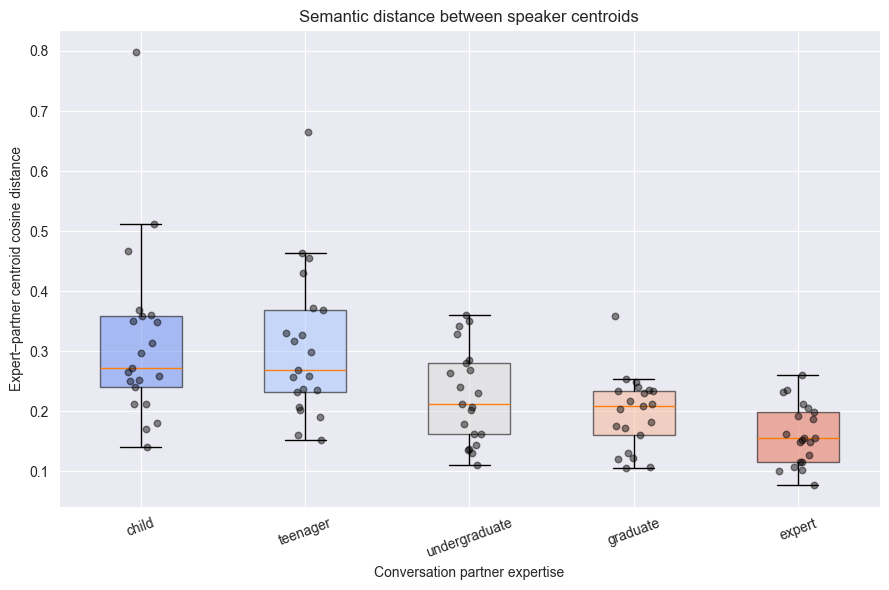

In [53]:
# Distribution by expertise level, using Matplotlib for the box layer.
rng = np.random.default_rng(2026)
groups = [
    plot_data.loc[
        plot_data["level_label"].eq(level),
        "speaker_centroid_cosine_distance",
    ].to_numpy()
    for level in level_order
]

fig, ax = plt.subplots(figsize=(9, 6))

box = ax.boxplot(
    groups,
    labels=level_order,
    showfliers=False,
    patch_artist=True,
)

for patch, level in zip(box["boxes"], level_order):
    patch.set_facecolor(palette[level])
    patch.set_alpha(0.55)

for position, (level, values) in enumerate(
    zip(level_order, groups),
    start=1,
):
    x = position + rng.uniform(-0.12, 0.12, size=len(values))
    ax.scatter(x, values, color="black", alpha=0.45, s=22, zorder=3)

ax.set_xlabel("Conversation partner expertise")
ax.set_ylabel("Expert–partner centroid cosine distance")
ax.set_title("Semantic distance between speaker centroids")
ax.tick_params(axis="x", rotation=20)
plt.tight_layout()
plt.show()

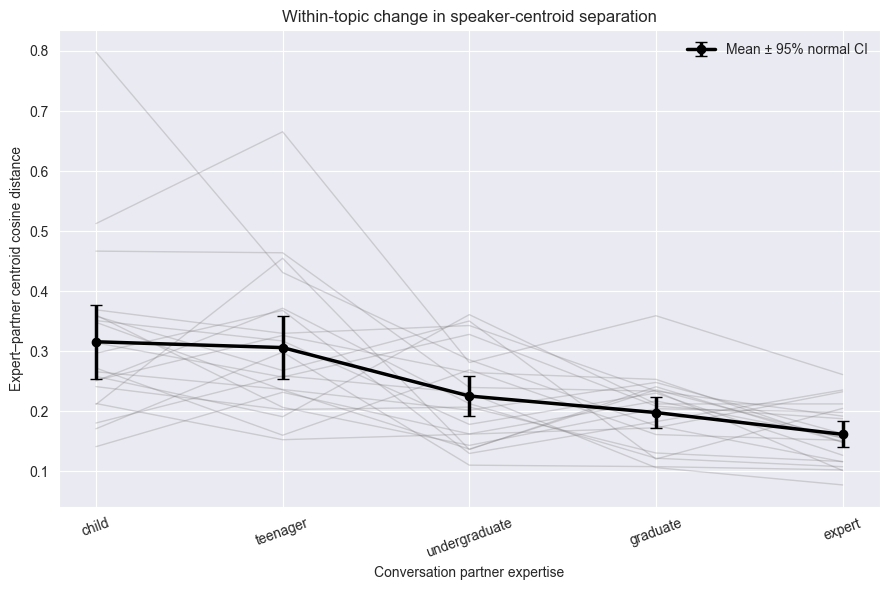

In [54]:
# Matched within-topic trajectories.
fig, ax = plt.subplots(figsize=(9, 6))

for (_, video_id), group in plot_data.groupby(
    ["dataset", "video_id"],
    observed=True,
):
    group = group.sort_values("level")
    ax.plot(
        group["level"],
        group["speaker_centroid_cosine_distance"],
        color="gray",
        alpha=0.3,
        linewidth=1,
    )

level_summary = (
    plot_data.groupby(["level", "level_label"], observed=True)
    ["speaker_centroid_cosine_distance"]
    .agg(["mean", "sem"])
    .reset_index()
    .sort_values("level")
)

ax.errorbar(
    level_summary["level"],
    level_summary["mean"],
    yerr=1.96 * level_summary["sem"],
    color="black",
    marker="o",
    linewidth=2.5,
    capsize=4,
    label="Mean ± 95% normal CI",
)

ax.set_xticks(level_values)
ax.set_xticklabels(level_order, rotation=20)
ax.set_xlabel("Conversation partner expertise")
ax.set_ylabel("Expert–partner centroid cosine distance")
ax.set_title("Within-topic change in speaker-centroid separation")
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

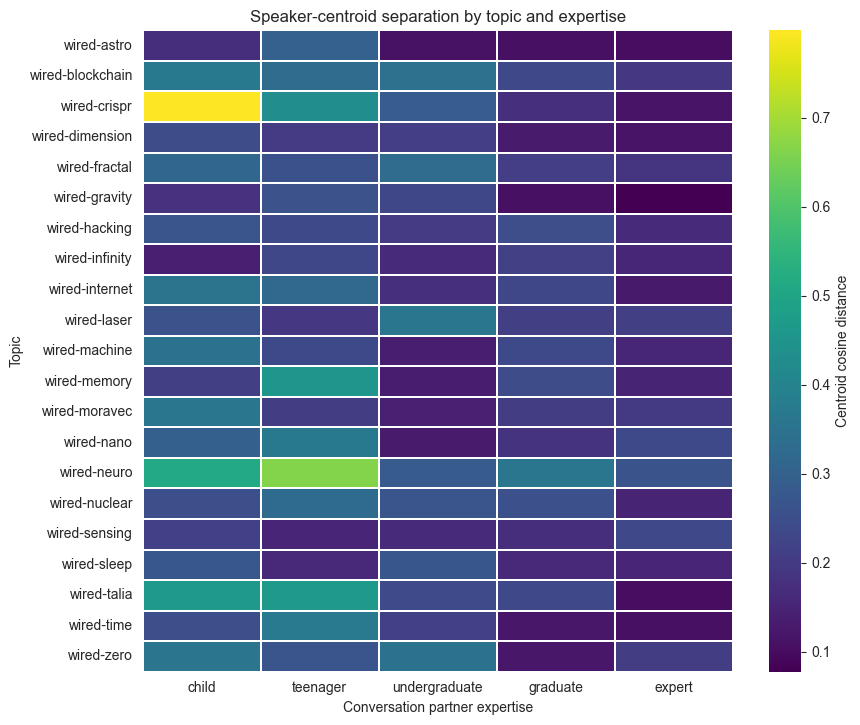

In [55]:
# Topic-by-level heatmap.
centroid_heatmap = (
    plot_data.pivot_table(
        index=["dataset", "video_id"],
        columns="level_label",
        values="speaker_centroid_cosine_distance",
        aggfunc="first",
    )
    .reindex(columns=level_order)
)

fig, ax = plt.subplots(
    figsize=(9, max(5, 0.35 * len(centroid_heatmap)))
)

sns.heatmap(
    centroid_heatmap,
    cmap="viridis",
    linewidths=0.3,
    cbar_kws={"label": "Centroid cosine distance"},
    ax=ax,
)

ax.set_xlabel("Conversation partner expertise")
ax.set_ylabel("Topic")
ax.set_title("Speaker-centroid separation by topic and expertise")
plt.tight_layout()
plt.show()

In [56]:
# Save reusable conversation-level results.
from pathlib import Path

OUTPUT_DIR = Path("analysis_exports")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

speaker_centroid_geometry.to_csv(
    OUTPUT_DIR / "speaker_centroid_geometry.csv",
    index=False,
)

conversation_geometry.to_csv(
    OUTPUT_DIR / "conversation_geometry_with_speaker_centroids.csv",
    index=False,
)

print("Saved centroid results to:", OUTPUT_DIR.resolve())

Saved centroid results to: /Users/yume/PycharmProjects/horizons_2/analysis_exports


In [57]:
import numpy as np
import pandas as pd

from scipy.spatial.distance import cosine
def calculate_cumulative_centroid_trajectory(
    conversation_utterances,
    embeddings,
):
    group = (
        conversation_utterances
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .reset_index(drop=True)
        .copy()
    )

    expert_embeddings = []
    partner_embeddings = []
    trajectory_records = []

    n_total = len(group)

    for position, row in group.iterrows():
        role = row["_centroid_role"]

        embedding_index = int(
            row["embedding_idx"]
        )

        embedding = embeddings[
            embedding_index
        ]

        if role == "expert":
            expert_embeddings.append(
                embedding
            )

        elif role == "partner":
            partner_embeddings.append(
                embedding
            )

        # Distance is undefined until both speakers
        # have contributed at least one utterance.
        if (
            len(expert_embeddings) == 0
            or len(partner_embeddings) == 0
        ):
            continue

        expert_centroid = np.mean(
            expert_embeddings,
            axis=0,
        )

        partner_centroid = np.mean(
            partner_embeddings,
            axis=0,
        )

        euclidean_distance = np.linalg.norm(
            expert_centroid
            - partner_centroid
        )

        cosine_distance = cosine(
            expert_centroid,
            partner_centroid,
        )

        normalized_time = (
            position / (n_total - 1)
            if n_total > 1
            else 0.0
        )

        trajectory_records.append({
            "utterance_position":
                position + 1,

            "normalized_time":
                normalized_time,

            "current_speaker_role":
                role,

            "expert_n_so_far":
                len(expert_embeddings),

            "partner_n_so_far":
                len(partner_embeddings),

            "cumulative_centroid_euclidean_distance":
                float(euclidean_distance),

            "cumulative_centroid_cosine_distance":
                float(cosine_distance),
        })

    return pd.DataFrame(
        trajectory_records
    )

In [58]:
cumulative_centroid_trajectories = []

for (dataset, conversation_id), group in (
    geometry_utterances.groupby(
        [
            "dataset",
            "conversation_id",
        ],
        observed=True,
        sort=False,
    )
):
    trajectory = (
        calculate_cumulative_centroid_trajectory(
            conversation_utterances=group,
            embeddings=embedding_matrix,
        )
    )

    if trajectory.empty:
        continue

    trajectory.insert(
        0,
        "conversation_id",
        conversation_id,
    )

    trajectory.insert(
        0,
        "dataset",
        dataset,
    )

    for column in [
        "video_id",
        "level",
        "level_label",
    ]:
        if column in group.columns:
            trajectory[column] = (
                group[column].iloc[0]
            )

    cumulative_centroid_trajectories.append(
        trajectory
    )

cumulative_centroid_trajectory = (
    pd.concat(
        cumulative_centroid_trajectories,
        ignore_index=True,
    )
)

In [59]:
display(
    cumulative_centroid_trajectory.head()
)

print(
    cumulative_centroid_trajectory.shape
)

,dataset,conversation_id,utterance_position,normalized_time,current_speaker_role,expert_n_so_far,partner_n_so_far,cumulative_centroid_euclidean_distance,cumulative_centroid_cosine_distance,video_id,level,level_label
0,wired,wired_Talia_12,16,0.789474,partner,15,1,0.897596,0.554335,talia,0,child
1,wired,wired_Talia_12,17,0.842105,expert,16,1,0.873117,0.512226,talia,0,child
2,wired,wired_Talia_12,18,0.894737,expert,17,1,0.861734,0.492565,talia,0,child
3,wired,wired_Talia_12,19,0.947368,expert,18,1,0.853875,0.478902,talia,0,child
4,wired,wired_Talia_12,20,1.000000,expert,19,1,0.846758,0.466711,talia,0,child


(4888, 12)


In [60]:
def summarize_cumulative_centroid_trajectory(
    group,
):
    group = (
        group
        .sort_values("normalized_time")
        .dropna(
            subset=[
                "normalized_time",
                "cumulative_centroid_euclidean_distance",
            ]
        )
    )

    time = group[
        "normalized_time"
    ].to_numpy()

    euclidean_distance = group[
        "cumulative_centroid_euclidean_distance"
    ].to_numpy()

    cosine_distance = group[
        "cumulative_centroid_cosine_distance"
    ].to_numpy()

    if (
        len(time) >= 2
        and np.ptp(time) > 0
    ):
        euclidean_slope = np.polyfit(
            time,
            euclidean_distance,
            deg=1,
        )[0]

        cosine_slope = np.polyfit(
            time,
            cosine_distance,
            deg=1,
        )[0]

    else:
        euclidean_slope = np.nan
        cosine_slope = np.nan

    return pd.Series({
        "cumulative_centroid_n_timepoints":
            len(group),

        "cumulative_centroid_euclidean_mean":
            np.mean(euclidean_distance),

        "cumulative_centroid_euclidean_sd":
            (
                np.std(
                    euclidean_distance,
                    ddof=1,
                )
                if len(group) > 1
                else 0.0
            ),

        "cumulative_centroid_euclidean_initial":
            euclidean_distance[0],

        "cumulative_centroid_euclidean_final":
            euclidean_distance[-1],

        "cumulative_centroid_euclidean_change":
            (
                euclidean_distance[-1]
                - euclidean_distance[0]
            ),

        "cumulative_centroid_euclidean_slope":
            euclidean_slope,

        "cumulative_centroid_cosine_mean":
            np.mean(cosine_distance),

        "cumulative_centroid_cosine_sd":
            (
                np.std(
                    cosine_distance,
                    ddof=1,
                )
                if len(group) > 1
                else 0.0
            ),

        "cumulative_centroid_cosine_initial":
            cosine_distance[0],

        "cumulative_centroid_cosine_final":
            cosine_distance[-1],

        "cumulative_centroid_cosine_change":
            (
                cosine_distance[-1]
                - cosine_distance[0]
            ),

        "cumulative_centroid_cosine_slope":
            cosine_slope,
    })

In [61]:
display(
    cumulative_centroid_trajectory.head()
)

print(
    cumulative_centroid_trajectory.shape
)

,dataset,conversation_id,utterance_position,normalized_time,current_speaker_role,expert_n_so_far,partner_n_so_far,cumulative_centroid_euclidean_distance,cumulative_centroid_cosine_distance,video_id,level,level_label
0,wired,wired_Talia_12,16,0.789474,partner,15,1,0.897596,0.554335,talia,0,child
1,wired,wired_Talia_12,17,0.842105,expert,16,1,0.873117,0.512226,talia,0,child
2,wired,wired_Talia_12,18,0.894737,expert,17,1,0.861734,0.492565,talia,0,child
3,wired,wired_Talia_12,19,0.947368,expert,18,1,0.853875,0.478902,talia,0,child
4,wired,wired_Talia_12,20,1.000000,expert,19,1,0.846758,0.466711,talia,0,child


(4888, 12)


In [62]:
def summarize_cumulative_centroid_trajectory(
    group,
):
    group = (
        group
        .sort_values("normalized_time")
        .dropna(
            subset=[
                "normalized_time",
                "cumulative_centroid_euclidean_distance",
            ]
        )
    )

    time = group[
        "normalized_time"
    ].to_numpy()

    euclidean_distance = group[
        "cumulative_centroid_euclidean_distance"
    ].to_numpy()

    cosine_distance = group[
        "cumulative_centroid_cosine_distance"
    ].to_numpy()

    if (
        len(time) >= 2
        and np.ptp(time) > 0
    ):
        euclidean_slope = np.polyfit(
            time,
            euclidean_distance,
            deg=1,
        )[0]

        cosine_slope = np.polyfit(
            time,
            cosine_distance,
            deg=1,
        )[0]

    else:
        euclidean_slope = np.nan
        cosine_slope = np.nan

    return pd.Series({
        "cumulative_centroid_n_timepoints":
            len(group),

        "cumulative_centroid_euclidean_mean":
            np.mean(euclidean_distance),

        "cumulative_centroid_euclidean_sd":
            (
                np.std(
                    euclidean_distance,
                    ddof=1,
                )
                if len(group) > 1
                else 0.0
            ),

        "cumulative_centroid_euclidean_initial":
            euclidean_distance[0],

        "cumulative_centroid_euclidean_final":
            euclidean_distance[-1],

        "cumulative_centroid_euclidean_change":
            (
                euclidean_distance[-1]
                - euclidean_distance[0]
            ),

        "cumulative_centroid_euclidean_slope":
            euclidean_slope,

        "cumulative_centroid_cosine_mean":
            np.mean(cosine_distance),

        "cumulative_centroid_cosine_sd":
            (
                np.std(
                    cosine_distance,
                    ddof=1,
                )
                if len(group) > 1
                else 0.0
            ),

        "cumulative_centroid_cosine_initial":
            cosine_distance[0],

        "cumulative_centroid_cosine_final":
            cosine_distance[-1],

        "cumulative_centroid_cosine_change":
            (
                cosine_distance[-1]
                - cosine_distance[0]
            ),

        "cumulative_centroid_cosine_slope":
            cosine_slope,
    })

In [63]:
cumulative_centroid_summary = (
    cumulative_centroid_trajectory
    .groupby(
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
        ],
        observed=True,
    )
    .apply(
        summarize_cumulative_centroid_trajectory,
        include_groups=False,
    )
    .reset_index()
)

display(
    cumulative_centroid_summary.head()
)

,dataset,video_id,conversation_id,level,level_label,cumulative_centroid_n_timepoints,cumulative_centroid_euclidean_mean,cumulative_centroid_euclidean_sd,cumulative_centroid_euclidean_initial,cumulative_centroid_euclidean_final,cumulative_centroid_euclidean_change,cumulative_centroid_euclidean_slope,cumulative_centroid_cosine_mean,cumulative_centroid_cosine_sd,cumulative_centroid_cosine_initial,cumulative_centroid_cosine_final,cumulative_centroid_cosine_change,cumulative_centroid_cosine_slope
0,wired,astro,wired_astro_12,0,child,45.0,0.501425,0.225030,1.283079,0.304512,-0.978567,-0.665587,0.349422,0.162196,0.823146,0.170952,-0.652194,-0.516384
1,wired,astro,wired_astro_13,1,teenager,49.0,0.650424,0.123571,1.208535,0.439707,-0.768828,-0.344526,0.432444,0.081350,0.730278,0.298495,-0.431783,-0.163562
2,wired,astro,wired_astro_14,2,undergraduate,48.0,0.425086,0.173990,1.064245,0.259133,-0.805111,-0.498034,0.267858,0.126119,0.566308,0.110333,-0.455976,-0.409893
3,wired,astro,wired_astro_15,3,graduate,55.0,0.407775,0.200755,1.393641,0.258377,-1.135265,-0.510691,0.223811,0.164853,0.971118,0.107891,-0.863227,-0.423524
4,wired,astro,wired_astro_16,4,expert,37.0,0.438596,0.170972,0.963484,0.262090,-0.701395,-0.539348,0.224896,0.125773,0.576648,0.102434,-0.474214,-0.392855


In [64]:
conversation_geometry = (
    conversation_geometry
    .merge(
        cumulative_centroid_summary,
        on=[
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
        ],
        how="left",
        validate="one_to_one",
    )
)

In [65]:
euclidean_difference = (
    conversation_geometry[
        "cumulative_centroid_euclidean_final"
    ]
    -
    conversation_geometry[
        "speaker_centroid_euclidean_distance"
    ]
).abs()

cosine_difference = (
    conversation_geometry[
        "cumulative_centroid_cosine_final"
    ]
    -
    conversation_geometry[
        "speaker_centroid_cosine_distance"
    ]
).abs()

print(
    "Maximum Euclidean discrepancy:",
    euclidean_difference.max(),
)

print(
    "Maximum cosine discrepancy:",
    cosine_difference.max(),
)

assert np.allclose(
    conversation_geometry[
        "cumulative_centroid_euclidean_final"
    ],
    conversation_geometry[
        "speaker_centroid_euclidean_distance"
    ],
    equal_nan=True,
)

assert np.allclose(
    conversation_geometry[
        "cumulative_centroid_cosine_final"
    ],
    conversation_geometry[
        "speaker_centroid_cosine_distance"
    ],
    equal_nan=True,
)

Maximum Euclidean discrepancy: 0.0
Maximum cosine discrepancy: 0.0


In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [67]:
trajectory_metric = (
    "cumulative_centroid_euclidean_distance"
)

# Change to this for the cosine version:
# trajectory_metric = (
#     "cumulative_centroid_cosine_distance"
# )

n_time_bins = 20

trajectory_plot_data = (
    cumulative_centroid_trajectory
    .dropna(
        subset=[
            "normalized_time",
            trajectory_metric,
            "level_label",
        ]
    )
    .copy()
)

trajectory_plot_data["time_bin"] = pd.cut(
    trajectory_plot_data["normalized_time"],
    bins=np.linspace(
        0,
        1,
        n_time_bins + 1,
    ),
    labels=False,
    include_lowest=True,
)

trajectory_plot_data["time_bin_midpoint"] = (
    trajectory_plot_data["time_bin"]
    + 0.5
) / n_time_bins

In [68]:
conversation_time_bins = (
    trajectory_plot_data
    .groupby(
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
            "time_bin",
            "time_bin_midpoint",
        ],
        observed=True,
        as_index=False,
    )[trajectory_metric]
    .mean()
)

In [69]:
level_lookup = (
    conversation_time_bins[
        [
            "level",
            "level_label",
        ]
    ]
    .drop_duplicates()
    .sort_values("level")
)

level_order = (
    level_lookup[
        "level_label"
    ].tolist()
)

level_values = (
    level_lookup[
        "level"
    ].tolist()
)

print(level_order)

['child', 'teenager', 'undergraduate', 'graduate', 'expert']


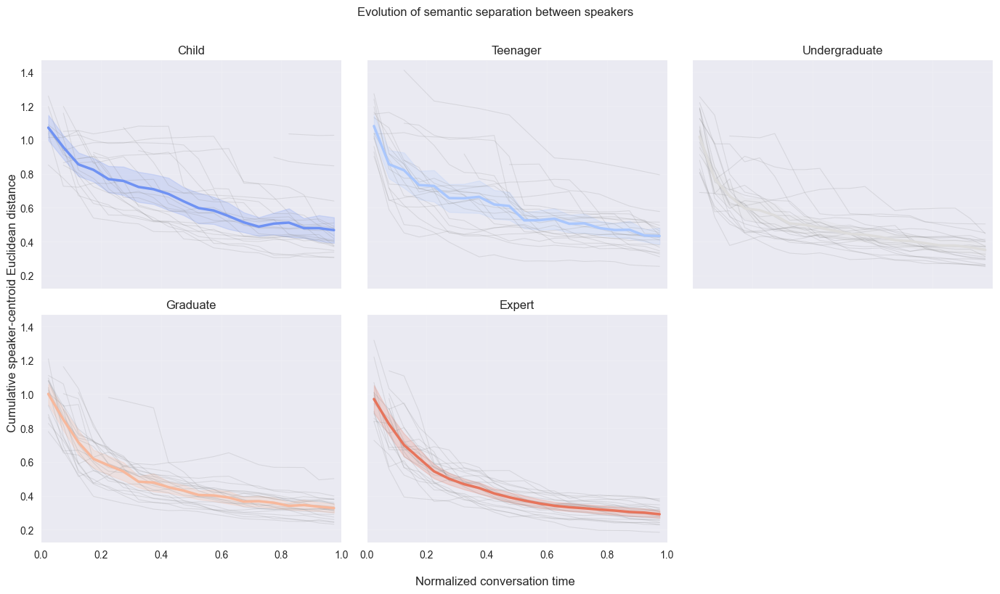

In [70]:
n_levels = len(level_order)

fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(14, 8),
    sharex=True,
    sharey=True,
)

axes = axes.flatten()

level_colors = dict(
    zip(
        level_order,
        sns.color_palette(
            "coolwarm",
            n_colors=n_levels,
        ),
    )
)

for ax, level_label in zip(
    axes,
    level_order,
):
    level_data = (
        conversation_time_bins[
            conversation_time_bins[
                "level_label"
            ] == level_label
        ]
    )

    # Individual conversations
    for _, conversation in (
        level_data.groupby(
            [
                "dataset",
                "conversation_id",
            ],
            observed=True,
        )
    ):
        conversation = (
            conversation
            .sort_values(
                "time_bin_midpoint"
            )
        )

        ax.plot(
            conversation[
                "time_bin_midpoint"
            ],
            conversation[
                trajectory_metric
            ],
            color="gray",
            alpha=0.18,
            linewidth=0.8,
        )

    # Equal-weight level summary
    level_summary = (
        level_data
        .groupby(
            "time_bin_midpoint",
            observed=True,
        )[trajectory_metric]
        .agg(
            mean="mean",
            sem="sem",
            count="count",
        )
        .reset_index()
    )

    lower = (
        level_summary["mean"]
        - 1.96 * level_summary["sem"]
    )

    upper = (
        level_summary["mean"]
        + 1.96 * level_summary["sem"]
    )

    ax.fill_between(
        level_summary[
            "time_bin_midpoint"
        ],
        lower,
        upper,
        color=level_colors[level_label],
        alpha=0.2,
    )

    ax.plot(
        level_summary[
            "time_bin_midpoint"
        ],
        level_summary["mean"],
        color=level_colors[level_label],
        linewidth=2.5,
    )

    ax.set_title(
        level_label.title()
    )

    ax.set_xlim(0, 1)

    ax.grid(
        alpha=0.15
    )

# Remove unused subplot
for ax in axes[len(level_order):]:
    ax.remove()

fig.supxlabel(
    "Normalized conversation time"
)

fig.supylabel(
    "Cumulative speaker-centroid "
    "Euclidean distance"
)

fig.suptitle(
    "Evolution of semantic separation "
    "between speakers",
    y=1.01,
)

plt.tight_layout()
plt.show()

In [71]:
level_time_summary = (
    conversation_time_bins
    .groupby(
        [
            "level",
            "level_label",
            "time_bin_midpoint",
        ],
        observed=True,
    )[trajectory_metric]
    .agg(
        mean="mean",
        sem="sem",
        count="count",
    )
    .reset_index()
)

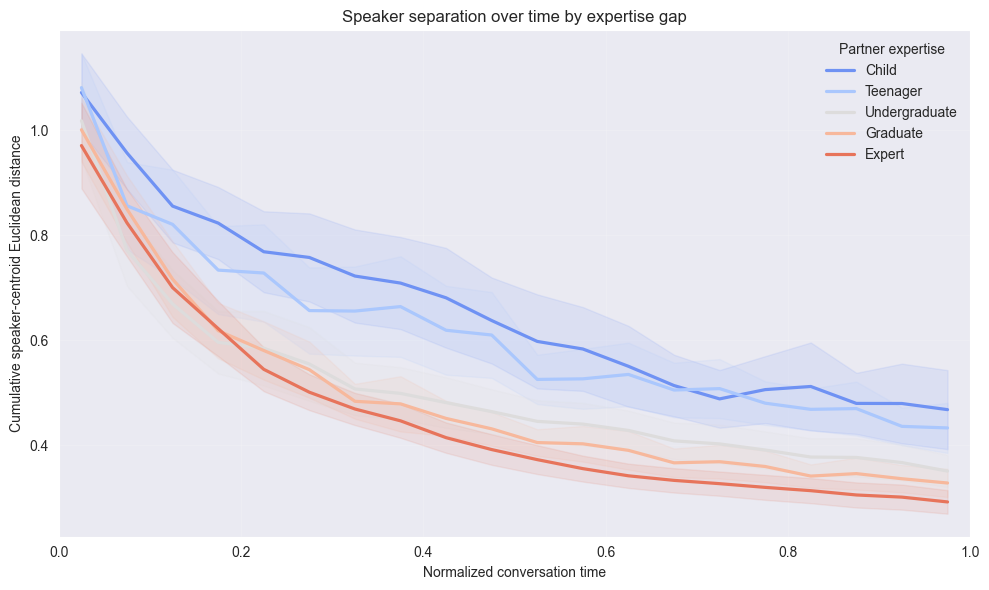

In [72]:
fig, ax = plt.subplots(
    figsize=(10, 6)
)

for level_label in level_order:
    subset = (
        level_time_summary[
            level_time_summary[
                "level_label"
            ] == level_label
        ]
        .sort_values(
            "time_bin_midpoint"
        )
    )

    color = level_colors[
        level_label
    ]

    lower = (
        subset["mean"]
        - 1.96 * subset["sem"]
    )

    upper = (
        subset["mean"]
        + 1.96 * subset["sem"]
    )

    ax.plot(
        subset[
            "time_bin_midpoint"
        ],
        subset["mean"],
        color=color,
        linewidth=2.3,
        label=level_label.title(),
    )

    ax.fill_between(
        subset[
            "time_bin_midpoint"
        ],
        lower,
        upper,
        color=color,
        alpha=0.12,
    )

ax.set_xlabel(
    "Normalized conversation time"
)

ax.set_ylabel(
    "Cumulative speaker-centroid "
    "Euclidean distance"
)

ax.set_title(
    "Speaker separation over time "
    "by expertise gap"
)

ax.set_xlim(0, 1)

ax.legend(
    title="Partner expertise",
    frameon=False,
)

ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

In [73]:
topic_level_trajectory = (
    conversation_time_bins
    .groupby(
        [
            "dataset",
            "video_id",
            "level",
            "level_label",
            "time_bin_midpoint",
        ],
        observed=True,
        as_index=False,
    )[trajectory_metric]
    .mean()
)

In [74]:
print(
    topic_level_trajectory[
        "video_id"
    ].unique()
)

['astro' 'blockchain' 'crispr' 'dimension' 'fractal' 'gravity' 'hacking'
 'infinity' 'internet' 'laser' 'machine' 'memory' 'moravec' 'nano' 'neuro'
 'nuclear' 'sensing' 'sleep' 'talia' 'time' 'zero']


In [75]:
chosen_video = "gravity"

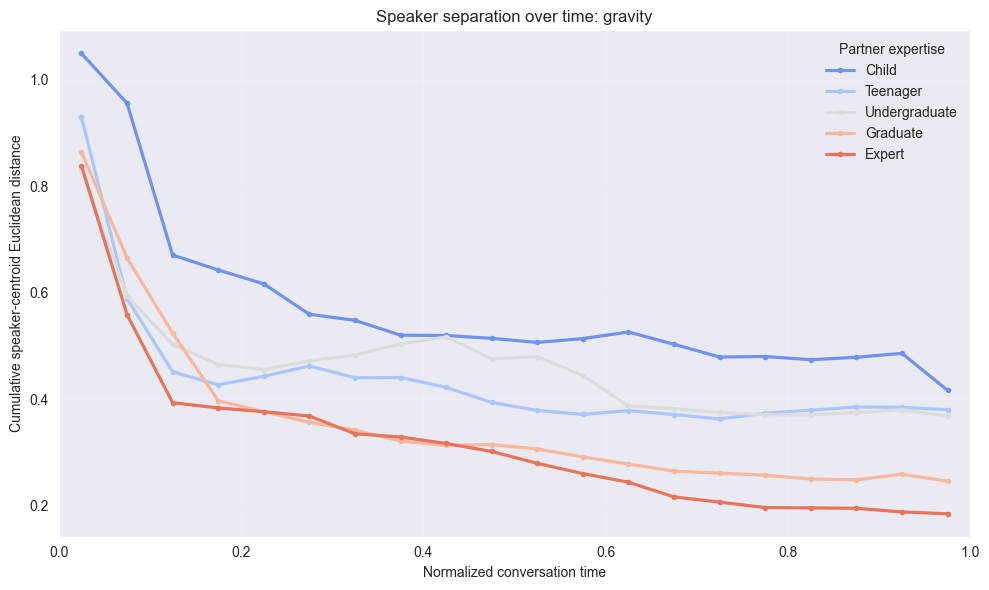

In [76]:
chosen_topic_data = (
    topic_level_trajectory[
        topic_level_trajectory[
            "video_id"
        ] == chosen_video
    ]
)

fig, ax = plt.subplots(
    figsize=(10, 6)
)

for level_label in level_order:
    subset = (
        chosen_topic_data[
            chosen_topic_data[
                "level_label"
            ] == level_label
        ]
        .sort_values(
            "time_bin_midpoint"
        )
    )

    if subset.empty:
        continue

    ax.plot(
        subset[
            "time_bin_midpoint"
        ],
        subset[
            trajectory_metric
        ],
        color=level_colors[
            level_label
        ],
        linewidth=2.3,
        marker="o",
        markersize=3,
        label=level_label.title(),
    )

ax.set_xlabel(
    "Normalized conversation time"
)

ax.set_ylabel(
    "Cumulative speaker-centroid "
    "Euclidean distance"
)

ax.set_title(
    f"Speaker separation over time: "
    f"{chosen_video}"
)

ax.set_xlim(0, 1)

ax.legend(
    title="Partner expertise",
    frameon=False,
)

ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

In [77]:
slope_column = (
    "cumulative_centroid_euclidean_slope"
)

slope_plot_data = (
    cumulative_centroid_summary
    .dropna(
        subset=[
            "level_label",
            slope_column,
        ]
    )
    .copy()
)

/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/2066354765.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  boxplot = ax.boxplot(


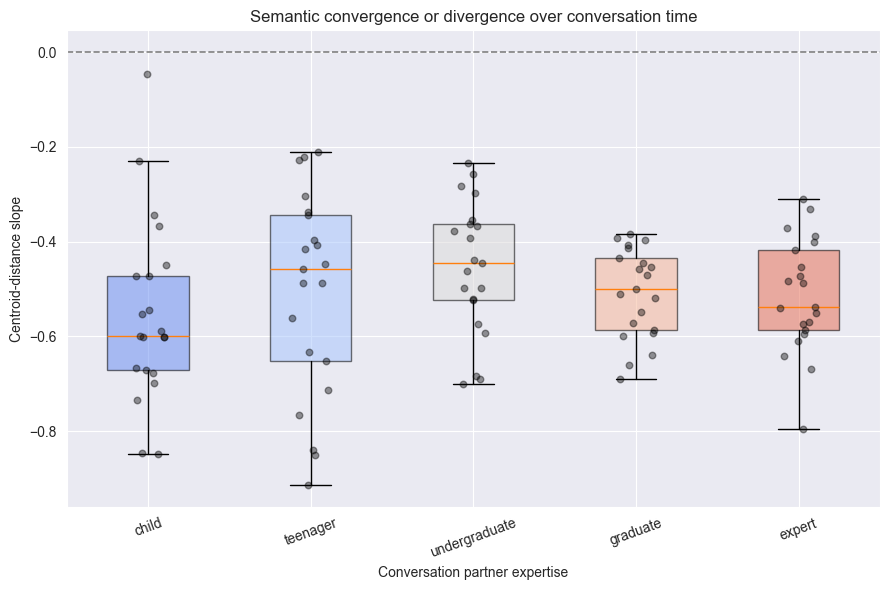

In [78]:
slope_groups = [
    slope_plot_data.loc[
        slope_plot_data[
            "level_label"
        ] == level,
        slope_column,
    ].to_numpy()
    for level in level_order
]

rng = np.random.default_rng(2026)

fig, ax = plt.subplots(
    figsize=(9, 6)
)

boxplot = ax.boxplot(
    slope_groups,
    labels=level_order,
    showfliers=False,
    patch_artist=True,
)

for box, level in zip(
    boxplot["boxes"],
    level_order,
):
    box.set_facecolor(
        level_colors[level]
    )

    box.set_alpha(0.55)

for position, (
    level,
    values,
) in enumerate(
    zip(
        level_order,
        slope_groups,
    ),
    start=1,
):
    jittered_x = (
        position
        + rng.uniform(
            -0.12,
            0.12,
            size=len(values),
        )
    )

    ax.scatter(
        jittered_x,
        values,
        color="black",
        alpha=0.4,
        s=22,
        zorder=3,
    )

ax.axhline(
    0,
    color="gray",
    linestyle="--",
    linewidth=1.2,
)

ax.set_xlabel(
    "Conversation partner expertise"
)

ax.set_ylabel(
    "Centroid-distance slope"
)

ax.set_title(
    "Semantic convergence or divergence "
    "over conversation time"
)

ax.tick_params(
    axis="x",
    rotation=20,
)

plt.tight_layout()
plt.show()

In [79]:
summary_metrics = {
    "cumulative_centroid_euclidean_mean":
        "Mean separation",

    "cumulative_centroid_euclidean_sd":
        "Variability in separation",

    "cumulative_centroid_euclidean_slope":
        "Directional change",
}

/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/3864953131.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  boxplot = ax.boxplot(
/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/3864953131.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  boxplot = ax.boxplot(
/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/3864953131.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  boxplot = ax.boxplot(


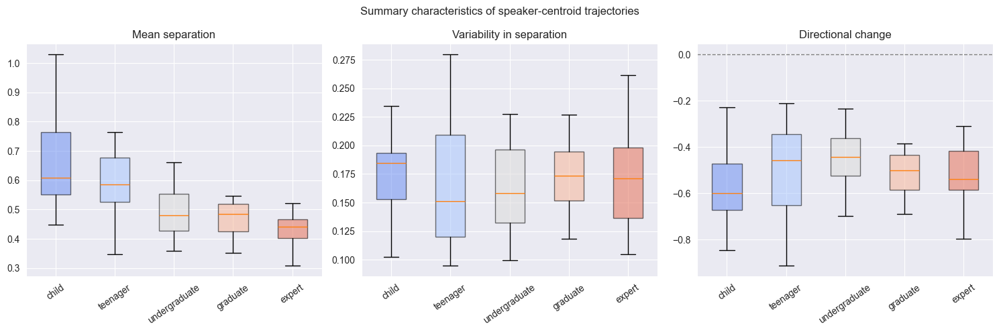

In [80]:
fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5),
)

for ax, (
    metric,
    label,
) in zip(
    axes,
    summary_metrics.items(),
):
    groups = [
        cumulative_centroid_summary.loc[
            cumulative_centroid_summary[
                "level_label"
            ] == level,
            metric,
        ]
        .dropna()
        .to_numpy()
        for level in level_order
    ]

    boxplot = ax.boxplot(
        groups,
        labels=level_order,
        showfliers=False,
        patch_artist=True,
    )

    for box, level in zip(
        boxplot["boxes"],
        level_order,
    ):
        box.set_facecolor(
            level_colors[level]
        )
        box.set_alpha(0.55)

    if "slope" in metric:
        ax.axhline(
            0,
            color="gray",
            linestyle="--",
            linewidth=1,
        )

    ax.set_title(label)

    ax.tick_params(
        axis="x",
        rotation=35,
    )

fig.suptitle(
    "Summary characteristics of "
    "speaker-centroid trajectories"
)

plt.tight_layout()
plt.show()

## rolling speaker centroid distance



centroid distances for the most recent w utterances

$$
\mu_A^{(w)}(t)
=
\frac{1}{\left|S_A^{(w)}(t)\right|}
\sum_{i \in S_A^{(w)}(t)} e_i
$$

Similarly, for speaker \(B\):

$$
\mu_B^{(w)}(t)
=
\frac{1}{\left|S_B^{(w)}(t)\right|}
\sum_{i \in S_B^{(w)}(t)} e_i
$$

The local centroid distance is:

$$
d_{\mathrm{local}}^{(w)}(t)
=
\left\|
\mu_A^{(w)}(t)
-
\mu_B^{(w)}(t)
\right\|_2
$$

In [81]:
def calculate_local_centroid_trajectory(
    conversation_utterances,
    embeddings,
    window_size=12,
    minimum_per_speaker=2,
):
    group = (
        conversation_utterances
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .reset_index(drop=True)
        .copy()
    )

    records = []
    n_utterances = len(group)

    for end_position in range(
        n_utterances
    ):
        start_position = max(
            0,
            end_position
            - window_size
            + 1,
        )

        local_window = group.iloc[
            start_position:
            end_position + 1
        ]

        expert_indices = (
            local_window.loc[
                local_window[
                    "_centroid_role"
                ].eq("expert"),
                "embedding_idx",
            ]
            .astype(int)
            .to_numpy()
        )

        partner_indices = (
            local_window.loc[
                local_window[
                    "_centroid_role"
                ].eq("partner"),
                "embedding_idx",
            ]
            .astype(int)
            .to_numpy()
        )

        if (
            len(expert_indices)
            < minimum_per_speaker
            or len(partner_indices)
            < minimum_per_speaker
        ):
            continue

        expert_centroid = (
            embeddings[
                expert_indices
            ].mean(axis=0)
        )

        partner_centroid = (
            embeddings[
                partner_indices
            ].mean(axis=0)
        )

        local_euclidean_distance = (
            np.linalg.norm(
                expert_centroid
                - partner_centroid
            )
        )

        local_cosine_distance = cosine(
            expert_centroid,
            partner_centroid,
        )

        normalized_time = (
            end_position
            / (n_utterances - 1)
            if n_utterances > 1
            else 0.0
        )

        records.append({
            "window_start_position":
                start_position + 1,

            "window_end_position":
                end_position + 1,

            "normalized_time":
                normalized_time,

            "window_size_actual":
                len(local_window),

            "expert_n_local":
                len(expert_indices),

            "partner_n_local":
                len(partner_indices),

            "local_centroid_euclidean_distance":
                float(
                    local_euclidean_distance
                ),

            "local_centroid_cosine_distance":
                float(
                    local_cosine_distance
                ),
        })

    return pd.DataFrame(records)

In [82]:
local_centroid_trajectories = []

for (dataset, conversation_id), group in (
    geometry_utterances.groupby(
        [
            "dataset",
            "conversation_id",
        ],
        observed=True,
        sort=False,
    )
):
    trajectory = (
        calculate_local_centroid_trajectory(
            conversation_utterances=group,
            embeddings=embedding_matrix,
            window_size=12,
            minimum_per_speaker=2,
        )
    )

    if trajectory.empty:
        continue

    trajectory.insert(
        0,
        "conversation_id",
        conversation_id,
    )

    trajectory.insert(
        0,
        "dataset",
        dataset,
    )

    for column in [
        "video_id",
        "level",
        "level_label",
    ]:
        trajectory[column] = (
            group[column].iloc[0]
        )

    local_centroid_trajectories.append(
        trajectory
    )

local_centroid_trajectory = pd.concat(
    local_centroid_trajectories,
    ignore_index=True,
)

display(
    local_centroid_trajectory.head()
)

print(
    "Conversations represented:",
    local_centroid_trajectory[
        [
            "dataset",
            "conversation_id",
        ]
    ].drop_duplicates().shape[0],
)

,dataset,conversation_id,window_start_position,window_end_position,normalized_time,window_size_actual,expert_n_local,partner_n_local,local_centroid_euclidean_distance,local_centroid_cosine_distance,video_id,level,level_label
0,wired,wired_Talia_13,1,4,0.068182,4,2,2,0.656925,0.342155,talia,1,teenager
1,wired,wired_Talia_13,1,5,0.090909,5,3,2,0.636736,0.347314,talia,1,teenager
2,wired,wired_Talia_13,1,6,0.113636,6,3,3,0.604756,0.362919,talia,1,teenager
3,wired,wired_Talia_13,1,7,0.136364,7,4,3,0.604446,0.399047,talia,1,teenager
4,wired,wired_Talia_13,1,8,0.159091,8,5,3,0.594940,0.383178,talia,1,teenager


Conversations represented: 103


In [83]:
local_metric = (
    "local_centroid_euclidean_distance"
)

# Or:
# local_metric = (
#     "local_centroid_cosine_distance"
# )

n_time_bins = 20

local_plot_data = (
    local_centroid_trajectory
    .dropna(
        subset=[
            "normalized_time",
            local_metric,
            "level_label",
        ]
    )
    .copy()
)

local_plot_data["time_bin"] = pd.cut(
    local_plot_data["normalized_time"],
    bins=np.linspace(
        0,
        1,
        n_time_bins + 1,
    ),
    labels=False,
    include_lowest=True,
)

local_plot_data[
    "time_bin_midpoint"
] = (
    local_plot_data["time_bin"]
    + 0.5
) / n_time_bins

In [84]:
local_conversation_bins = (
    local_plot_data
    .groupby(
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
            "time_bin",
            "time_bin_midpoint",
        ],
        observed=True,
        as_index=False,
    )[local_metric]
    .mean()
)

In [85]:
level_lookup = (
    local_conversation_bins[
        [
            "level",
            "level_label",
        ]
    ]
    .drop_duplicates()
    .sort_values("level")
)

level_order = (
    level_lookup[
        "level_label"
    ].tolist()
)

level_colors = dict(
    zip(
        level_order,
        sns.color_palette(
            "coolwarm",
            n_colors=len(level_order),
        ),
    )
)

In [86]:
local_level_summary = (
    local_conversation_bins
    .groupby(
        [
            "level",
            "level_label",
            "time_bin_midpoint",
        ],
        observed=True,
    )[local_metric]
    .agg(
        mean="mean",
        sem="sem",
        count="count",
    )
    .reset_index()
)

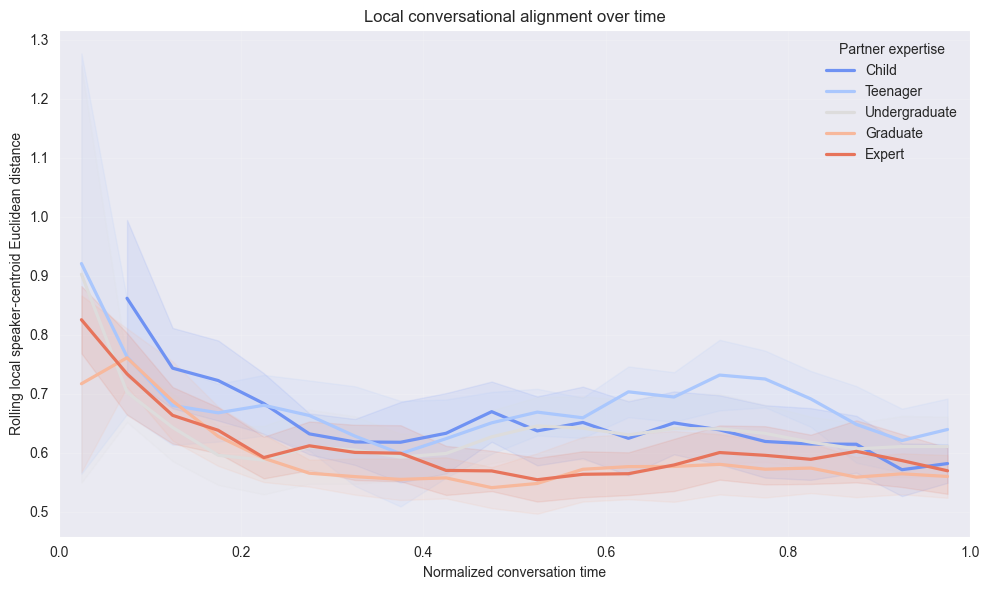

In [87]:
fig, ax = plt.subplots(
    figsize=(10, 6)
)

for level_label in level_order:
    subset = (
        local_level_summary[
            local_level_summary[
                "level_label"
            ] == level_label
        ]
        .sort_values(
            "time_bin_midpoint"
        )
    )

    color = level_colors[
        level_label
    ]

    lower = (
        subset["mean"]
        - 1.96 * subset["sem"]
    )

    upper = (
        subset["mean"]
        + 1.96 * subset["sem"]
    )

    ax.plot(
        subset[
            "time_bin_midpoint"
        ],
        subset["mean"],
        color=color,
        linewidth=2.3,
        label=level_label.title(),
    )

    ax.fill_between(
        subset[
            "time_bin_midpoint"
        ],
        lower,
        upper,
        color=color,
        alpha=0.12,
    )

ax.set_xlabel(
    "Normalized conversation time"
)

ax.set_ylabel(
    "Rolling local speaker-centroid "
    "Euclidean distance"
)

ax.set_title(
    "Local conversational alignment "
    "over time"
)

ax.set_xlim(0, 1)

ax.legend(
    title="Partner expertise",
    frameon=False,
)

ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

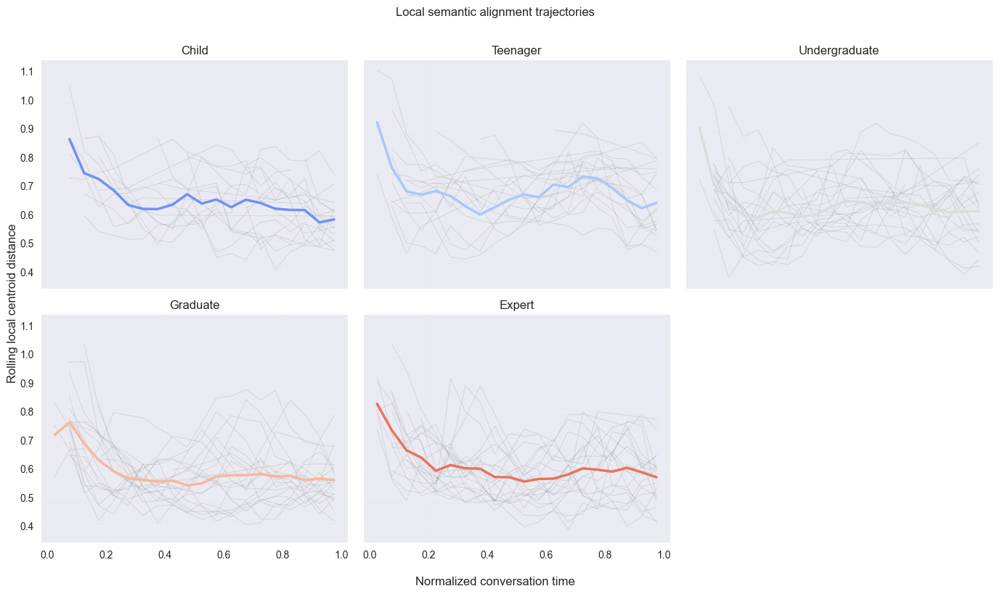

In [88]:
n_levels = len(level_order)

fig, axes = plt.subplots(
    2,
    3,
    figsize=(14, 8),
    sharex=True,
    sharey=True,
)

axes = axes.flatten()

for ax, level_label in zip(
    axes,
    level_order,
):
    level_data = (
        local_conversation_bins[
            local_conversation_bins[
                "level_label"
            ] == level_label
        ]
    )

    for _, conversation in (
        level_data.groupby(
            [
                "dataset",
                "conversation_id",
            ],
            observed=True,
        )
    ):
        conversation = (
            conversation.sort_values(
                "time_bin_midpoint"
            )
        )

        ax.plot(
            conversation[
                "time_bin_midpoint"
            ],
            conversation[
                local_metric
            ],
            color="gray",
            alpha=0.18,
            linewidth=0.8,
        )

    level_mean = (
        level_data
        .groupby(
            "time_bin_midpoint",
            observed=True,
        )[local_metric]
        .mean()
        .reset_index()
    )

    ax.plot(
        level_mean[
            "time_bin_midpoint"
        ],
        level_mean[
            local_metric
        ],
        color=level_colors[
            level_label
        ],
        linewidth=2.5,
    )

    ax.set_title(
        level_label.title()
    )

    ax.grid(alpha=0.15)

for ax in axes[
    len(level_order):
]:
    ax.remove()

fig.supxlabel(
    "Normalized conversation time"
)

fig.supylabel(
    "Rolling local centroid distance"
)

fig.suptitle(
    "Local semantic alignment trajectories",
    y=1.01,
)

plt.tight_layout()
plt.show()

In [89]:
import numpy as np
import pandas as pd

from scipy.optimize import minimize
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


FEP_N_COMPONENTS = 12
FEP_INITIAL_VARIANCE = 1.0
FEP_MIN_VARIANCE = 1e-8


# Confirm the required objects exist
print(
    "Utterances:",
    utterances.shape,
)

print(
    "Embeddings:",
    E_utterances.shape,
)


# Use all utterances because short responses can be
# dynamically meaningful.
fep_utterances = utterances.copy()


# Normalize speaker-role labels
fep_utterances["_fep_role"] = (
    fep_utterances["speaker_role"]
    .astype(str)
    .str.strip()
    .str.lower()
    .replace({
        "learner": "partner",
        "speaker a": "expert",
        "a": "expert",
        "speaker b": "partner",
        "b": "partner",
    })
)


unexpected_roles = sorted(
    set(
        fep_utterances[
            "_fep_role"
        ].dropna()
    )
    - {
        "expert",
        "partner",
    }
)

if unexpected_roles:
    raise ValueError(
        f"Unexpected roles: "
        f"{unexpected_roles}"
    )


# Preserve conversational order
fep_utterances = (
    fep_utterances
    .sort_values(
        [
            "dataset",
            "conversation_id",
            "embedding_idx",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


embedding_indices = (
    fep_utterances[
        "embedding_idx"
    ]
    .astype(int)
    .to_numpy()
)


if (
    embedding_indices.max()
    >= E_utterances.shape[0]
):
    raise ValueError(
        "embedding_idx does not align "
        "with E_utterances."
    )


X_fep_raw = E_utterances[
    embedding_indices
]


# Reduce and standardize the embedding space
n_components = min(
    FEP_N_COMPONENTS,
    X_fep_raw.shape[0] - 1,
    X_fep_raw.shape[1],
)

fep_pca = PCA(
    n_components=n_components,
    random_state=2026,
)

X_fep_pca = fep_pca.fit_transform(
    X_fep_raw
)

fep_scaler = StandardScaler()

X_fep = fep_scaler.fit_transform(
    X_fep_pca
)


fep_utterances["_fep_row"] = (
    np.arange(
        len(fep_utterances)
    )
)


# Estimate role-specific expression biases
fep_role_bias = {
    role: X_fep[
        fep_utterances[
            "_fep_role"
        ].eq(role).to_numpy()
    ].mean(axis=0)

    for role in [
        "expert",
        "partner",
    ]
}


# Create one chronological sequence
# per conversation
fep_sequences = []

for (
    dataset,
    conversation_id,
), group in (
    fep_utterances.groupby(
        [
            "dataset",
            "conversation_id",
        ],
        observed=True,
        sort=False,
    )
):
    group = (
        group
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    rows = (
        group["_fep_row"]
        .to_numpy(dtype=int)
    )

    if len(rows) < 2:
        continue

    fep_sequences.append({
        "dataset": dataset,
        "conversation_id":
            conversation_id,
        "frame": group,
        "X": X_fep[rows],
        "roles": group[
            "_fep_role"
        ].to_numpy(),
    })


print(
    "Reduced embedding shape:",
    X_fep.shape,
)

print(
    "Explained variance:",
    fep_pca
    .explained_variance_ratio_
    .sum(),
)

print(
    "Conversation sequences:",
    len(fep_sequences),
)

Utterances: (6384, 23)
Embeddings: (6384, 384)
Reduced embedding shape: (6384, 12)
Explained variance: 0.25852194
Conversation sequences: 105


In [90]:
#define and fit kalman/fep model
def filter_fep_sequence(
    X,
    roles,
    role_bias,
    q,
    r_expert,
    r_partner,
    initial_variance=1.0,
    return_records=True,
):
    """
    Exact diagonal Kalman filter.

    q:
        Latent-state process variance.

    r_expert:
        Expert observation variance.

    r_partner:
        Partner observation variance.
    """

    X = np.asarray(
        X,
        dtype=float,
    )

    roles = np.asarray(
        roles,
        dtype=object,
    )

    n, d = X.shape

    if n < 2:
        if return_records:
            return []

        return 0.0

    q = max(
        float(q),
        FEP_MIN_VARIANCE,
    )

    r_expert = max(
        float(r_expert),
        FEP_MIN_VARIANCE,
    )

    r_partner = max(
        float(r_partner),
        FEP_MIN_VARIANCE,
    )


    # Initialize from the first utterance.
    # It is not assigned an FEP score.
    m = (
        X[0]
        - role_bias[
            roles[0]
        ]
    )

    p = np.full(
        d,
        initial_variance,
    )

    total_nll = 0.0
    records = []


    for position in range(
        1,
        n,
    ):
        role = roles[position]

        r = (
            r_expert
            if role == "expert"
            else r_partner
        )


        # -------------------------
        # Prior prediction
        # -------------------------

        m_prior = m.copy()

        p_prior = (
            p + q
        )

        predicted_x = (
            m_prior
            + role_bias[role]
        )

        innovation = (
            X[position]
            - predicted_x
        )

        predictive_variance = (
            p_prior + r
        )


        # -------------------------
        # Predictive surprisal
        # -------------------------

        mahalanobis = float(
            np.sum(
                innovation ** 2
                / predictive_variance
            )
        )

        log_predictive_volume = (
            float(
                np.sum(
                    np.log(
                        predictive_variance
                    )
                )
            )
        )

        predictive_surprisal = (
            0.5
            * (
                d
                * np.log(
                    2.0 * np.pi
                )
                + log_predictive_volume
                + mahalanobis
            )
        )


        # -------------------------
        # Exact posterior update
        # -------------------------

        kalman_gain = (
            p_prior
            / predictive_variance
        )

        m_post = (
            m_prior
            + kalman_gain
            * innovation
        )

        p_post = np.maximum(
            (
                1.0
                - kalman_gain
            )
            * p_prior,
            FEP_MIN_VARIANCE,
        )


        # -------------------------
        # KL belief-update complexity
        # -------------------------

        complexity_kl = (
            0.5
            * float(
                np.sum(
                    p_post / p_prior
                    + (
                        m_post
                        - m_prior
                    ) ** 2
                    / p_prior
                    - 1.0
                    + np.log(
                        p_prior
                        / p_post
                    )
                )
            )
        )


        # -------------------------
        # Expected inaccuracy
        # -------------------------

        posterior_residual = (
            X[position]
            - (
                m_post
                + role_bias[role]
            )
        )

        inaccuracy = (
            0.5
            * float(
                np.sum(
                    np.log(
                        2.0
                        * np.pi
                        * r
                    )
                    + (
                        posterior_residual
                        ** 2
                        + p_post
                    )
                    / r
                )
            )
        )


        free_energy = (
            complexity_kl
            + inaccuracy
        )

        update_norm = float(
            np.linalg.norm(
                m_post
                - m_prior
            )
        )

        total_nll += (
            predictive_surprisal
        )


        if return_records:
            records.append({
                "utterance_position":
                    position,

                "predictive_surprisal":
                    predictive_surprisal,

                "free_energy":
                    free_energy,

                "complexity_kl":
                    complexity_kl,

                "inaccuracy":
                    inaccuracy,

                "mahalanobis_prediction_error":
                    mahalanobis,

                "log_predictive_volume":
                    log_predictive_volume,

                "latent_update_norm":
                    update_norm,

                "prior_variance_mean":
                    float(
                        p_prior.mean()
                    ),

                "posterior_variance_mean":
                    float(
                        p_post.mean()
                    ),
            })


        m = m_post
        p = p_post


    if return_records:
        return records

    return float(total_nll)

In [91]:
def unpack_fep_parameters(
    log_parameters,
):
    q, r_expert, r_partner = (
        np.exp(
            np.asarray(
                log_parameters
            )
        )
    )

    return {
        "q": float(q),
        "r_expert":
            float(r_expert),
        "r_partner":
            float(r_partner),
    }


def fep_objective(
    log_parameters,
):
    parameters = (
        unpack_fep_parameters(
            log_parameters
        )
    )

    total = 0.0

    for sequence in fep_sequences:
        total += (
            filter_fep_sequence(
                X=sequence["X"],
                roles=sequence[
                    "roles"
                ],
                role_bias=
                    fep_role_bias,
                **parameters,
                initial_variance=
                    FEP_INITIAL_VARIANCE,
                return_records=False,
            )
        )

    return float(total)

In [92]:
initial_parameters = np.log(
    [
        0.05,  # q
        0.20,  # expert r
        0.20,  # partner r
    ]
)

fep_fit = minimize(
    fep_objective,
    x0=initial_parameters,
    method="L-BFGS-B",
    bounds=[
        (-12.0, 3.0),
        (-12.0, 3.0),
        (-12.0, 3.0),
    ],
    options={
        "maxiter": 300,
    },
)


if not fep_fit.success:
    raise RuntimeError(
        "FEP optimization failed: "
        + fep_fit.message
    )


fep_parameters = (
    unpack_fep_parameters(
        fep_fit.x
    )
)

fep_parameters[
    "total_negative_log_likelihood"
] = float(
    fep_fit.fun
)

fep_parameters[
    "optimizer_iterations"
] = int(
    fep_fit.nit
)


fep_parameters

{'q': 0.014058489832255917,
 'r_expert': 0.6814426817006399,
 'r_partner': 0.7480995200587591,
 'total_negative_log_likelihood': 100004.57858829956,
 'optimizer_iterations': 11}

In [93]:
fep_event_records = []

metadata_columns = [
    "dataset",
    "video_id",
    "conversation_id",
    "file_number",
    "level",
    "level_label",
    "utterance_id",
    "utterance_number",
    "turn_id",
    "sequence",
    "speaker",
    "speaker_role",
    "text",
    "n_words",
    "embedding_idx",
]


for sequence in fep_sequences:
    sequence_records = (
        filter_fep_sequence(
            X=sequence["X"],
            roles=sequence[
                "roles"
            ],
            role_bias=
                fep_role_bias,
            q=fep_parameters["q"],
            r_expert=
                fep_parameters[
                    "r_expert"
                ],
            r_partner=
                fep_parameters[
                    "r_partner"
                ],
            initial_variance=
                FEP_INITIAL_VARIANCE,
            return_records=True,
        )
    )

    frame = sequence["frame"]

    n_sequence = len(frame)


    for record in (
        sequence_records
    ):
        position = record[
            "utterance_position"
        ]

        source_row = (
            frame.iloc[position]
        )

        for column in (
            metadata_columns
        ):
            if column in frame.columns:
                record[column] = (
                    source_row[column]
                )

        record["fep_role"] = (
            source_row[
                "_fep_role"
            ]
        )

        record["previous_role"] = (
            frame.iloc[
                position - 1
            ][
                "_fep_role"
            ]
        )

        record[
            "normalized_time"
        ] = (
            position
            / max(
                n_sequence - 1,
                1,
            )
        )

        fep_event_records.append(
            record
        )


fep_events = pd.DataFrame(
    fep_event_records
)

In [94]:
identity_error = np.abs(
    fep_events[
        "free_energy"
    ]
    -
    fep_events[
        "predictive_surprisal"
    ]
)


print(
    "Scored utterances:",
    len(fep_events),
)

print(
    "Maximum |F - surprisal|:",
    identity_error.max(),
)

print(
    "\nFitted parameters:"
)

display(
    pd.Series(
        fep_parameters
    )
)


assert (
    identity_error.max()
    < 1e-7
)

assert np.isfinite(
    fep_events[
        [
            "predictive_surprisal",
            "free_energy",
            "complexity_kl",
            "inaccuracy",
        ]
    ].to_numpy()
).all()


display(
    fep_events.head()
)

display(
    fep_events[
        [
            "predictive_surprisal",
            "complexity_kl",
            "inaccuracy",
            "latent_update_norm",
        ]
    ].describe()
)

Scored utterances: 6279
Maximum |F - surprisal|: 1.4210854715202004e-14

Fitted parameters:


q                                     0.014058
r_expert                              0.681443
r_partner                             0.748100
total_negative_log_likelihood    100004.578588
optimizer_iterations                 11.000000
dtype: float64

,utterance_position,predictive_surprisal,free_energy,complexity_kl,inaccuracy,mahalanobis_prediction_error,log_predictive_volume,latent_update_norm,prior_variance_mean,posterior_variance_mean,...,turn_id,sequence,speaker,speaker_role,text,n_words,embedding_idx,fep_role,previous_role,normalized_time
0,1,17.912497,17.912497,4.103913,13.808585,7.434730,6.335740,2.123472,1.014058,0.407563,...,2,2,A,expert,yeah what do you think that is,7,1,expert,partner,0.038462
1,2,15.198627,15.198627,1.683749,13.514878,6.461550,1.881178,0.990945,0.421621,0.269649,...,3,3,B,partner,fancy chandelier,2,2,partner,expert,0.076923
2,3,13.115014,13.115014,1.000980,12.114034,4.601157,-0.425653,0.619452,0.283708,0.200311,...,4,4,A,expert,i think so too we jokingly call it the chandelier,10,3,expert,partner,0.115385
3,4,12.257883,12.257883,0.657765,11.600117,3.781529,-1.320289,0.440442,0.214370,0.163071,...,4,5,A,expert,that's real gold you know,5,4,expert,expert,0.153846
4,5,25.407146,25.407146,3.303929,22.103218,30.589586,-1.829818,1.057277,0.177129,0.140586,...,4,6,A,expert,this is a quantum computer,5,5,expert,expert,0.192308


,predictive_surprisal,complexity_kl,inaccuracy,latent_update_norm
count,6279.000000,6279.000000,6279.000000,6279.000000
mean,15.926832,0.994224,14.932608,0.469318
std,2.921124,0.679910,2.463202,0.275971
min,10.171882,0.138707,10.033175,0.128926
25%,13.789240,0.604726,13.135382,0.344465
50%,15.409230,0.835154,14.480239,0.412309
75%,17.543699,1.177503,16.314583,0.500112
max,32.521389,9.813622,28.959991,4.011121


In [95]:
def fep_slope(
    group,
    metric,
):
    time = (
        group[
            "normalized_time"
        ].to_numpy()
    )

    values = (
        group[
            metric
        ].to_numpy()
    )

    valid = (
        np.isfinite(time)
        & np.isfinite(values)
    )

    if (
        valid.sum() < 2
        or np.ptp(
            time[valid]
        ) == 0
    ):
        return np.nan

    return float(
        np.polyfit(
            time[valid],
            values[valid],
            deg=1,
        )[0]
    )

In [96]:
fep_summary_records = []

for (
    dataset,
    conversation_id,
), group in (
    fep_events.groupby(
        [
            "dataset",
            "conversation_id",
        ],
        observed=True,
        sort=False,
    )
):
    row = {
        "dataset":
            dataset,

        "conversation_id":
            conversation_id,

        "n_scored_utterances":
            len(group),

        "fep_surprisal_mean":
            group[
                "predictive_surprisal"
            ].mean(),

        "fep_surprisal_sd":
            group[
                "predictive_surprisal"
            ].std(ddof=1),

        "fep_surprisal_slope":
            fep_slope(
                group,
                "predictive_surprisal",
            ),

        "fep_complexity_mean":
            group[
                "complexity_kl"
            ].mean(),

        "fep_inaccuracy_mean":
            group[
                "inaccuracy"
            ].mean(),

        "fep_update_norm_mean":
            group[
                "latent_update_norm"
            ].mean(),
    }

    for column in [
        "video_id",
        "file_number",
        "level",
        "level_label",
    ]:
        if column in group.columns:
            row[column] = (
                group[
                    column
                ].iloc[0]
            )

    fep_summary_records.append(
        row
    )


fep_conversation_summary = (
    pd.DataFrame(
        fep_summary_records
    )
)


display(
    fep_conversation_summary.head()
)

display(
    fep_conversation_summary
    .groupby(
        "level_label",
        observed=True,
    )[
        [
            "fep_surprisal_mean",
            "fep_complexity_mean",
            "fep_inaccuracy_mean",
            "fep_update_norm_mean",
        ]
    ]
    .mean()
)

,dataset,conversation_id,n_scored_utterances,fep_surprisal_mean,fep_surprisal_sd,fep_surprisal_slope,fep_complexity_mean,fep_inaccuracy_mean,fep_update_norm_mean,video_id,file_number,level,level_label
0,wired,wired_Talia_12,26,15.988284,3.105811,-0.202904,1.156321,14.831962,0.551587,talia,12,0,child
1,wired,wired_Talia_13,59,15.589904,2.239010,-1.245155,0.919631,14.670272,0.450055,talia,13,1,teenager
2,wired,wired_Talia_14,43,15.555264,2.161436,-2.331388,0.987712,14.567552,0.489331,talia,14,2,undergraduate
3,wired,wired_Talia_15,42,16.001734,2.973627,-1.913426,1.061978,14.939756,0.507349,talia,15,3,graduate
4,wired,wired_Talia_16,43,16.158843,2.755569,-1.220714,1.000720,15.158122,0.478296,talia,16,4,expert


,fep_surprisal_mean,fep_complexity_mean,fep_inaccuracy_mean,fep_update_norm_mean
level_label,,,,
child,16.021839,1.086119,14.935720,0.509063
expert,15.912545,0.966697,14.945847,0.464460
graduate,15.935731,1.035065,14.900666,0.493519
teenager,15.663442,1.009984,14.653458,0.483993
undergraduate,15.906478,1.035507,14.870971,0.486863


In [97]:
fep_conversation_summary

,dataset,conversation_id,n_scored_utterances,fep_surprisal_mean,fep_surprisal_sd,fep_surprisal_slope,fep_complexity_mean,fep_inaccuracy_mean,fep_update_norm_mean,video_id,file_number,level,level_label
0,wired,wired_Talia_12,26,15.988284,3.105811,-0.202904,1.156321,14.831962,0.551587,talia,12,0,child
1,wired,wired_Talia_13,59,15.589904,2.239010,-1.245155,0.919631,14.670272,0.450055,talia,13,1,teenager
2,wired,wired_Talia_14,43,15.555264,2.161436,-2.331388,0.987712,14.567552,0.489331,talia,14,2,undergraduate
3,wired,wired_Talia_15,42,16.001734,2.973627,-1.913426,1.061978,14.939756,0.507349,talia,15,3,graduate
4,wired,wired_Talia_16,43,16.158843,2.755569,-1.220714,1.000720,15.158122,0.478296,talia,16,4,expert
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,wired,wired_zero_12,56,16.200283,3.533345,-0.802034,1.073075,15.127208,0.492921,zero,12,0,child
101,wired,wired_zero_13,52,15.557804,3.206199,-1.883946,1.017453,14.540351,0.486978,zero,13,1,teenager
102,wired,wired_zero_14,114,15.677399,2.629263,-1.179989,0.926015,14.751384,0.439604,zero,14,2,undergraduate
103,wired,wired_zero_15,69,16.204803,2.475165,0.851728,0.993018,15.211786,0.472019,zero,15,3,graduate


In [98]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

LEVEL_ORDER = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert",
]
LEVEL_ORDER = [
    x for x in LEVEL_ORDER
    if x in fep_events["level_label"].astype(str).unique()
]

COLORS = dict(zip(
    LEVEL_ORDER,
    sns.color_palette("viridis", len(LEVEL_ORDER))
))

/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/2248217619.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/2248217619.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/1z/hv4_qzyn6556dk5hqb4k6tdh0000gn/T/ipykernel_33347/2248217619.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


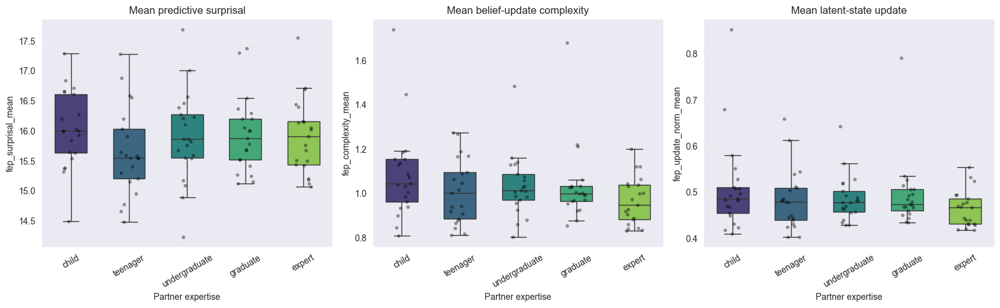

In [99]:
metrics = {
    "fep_surprisal_mean": "Mean predictive surprisal",
    "fep_complexity_mean": "Mean belief-update complexity",
    "fep_update_norm_mean": "Mean latent-state update",
}

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

for ax, (metric, title) in zip(axes, metrics.items()):
    sns.boxplot(
        data=fep_conversation_summary,
        x="level_label",
        y=metric,
        order=LEVEL_ORDER,
        palette=[COLORS[x] for x in LEVEL_ORDER],
        showfliers=False,
        width=0.55,
        ax=ax,
    )

    sns.stripplot(
        data=fep_conversation_summary,
        x="level_label",
        y=metric,
        order=LEVEL_ORDER,
        color="black",
        alpha=0.40,
        jitter=0.16,
        size=4,
        ax=ax,
    )

    ax.set_title(title)
    ax.set_xlabel("Partner expertise")
    ax.tick_params(axis="x", rotation=30)
    ax.grid(axis="y", alpha=0.15)

plt.tight_layout()
plt.show()

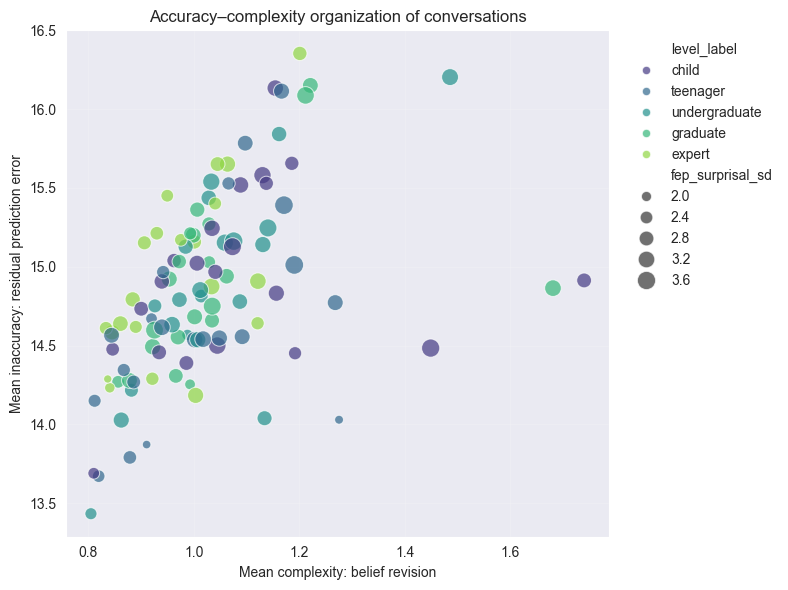

In [100]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.scatterplot(
    data=fep_conversation_summary,
    x="fep_complexity_mean",
    y="fep_inaccuracy_mean",
    hue="level_label",
    hue_order=LEVEL_ORDER,
    palette=COLORS,
    size="fep_surprisal_sd",
    sizes=(35, 180),
    alpha=0.70,
    ax=ax,
)

ax.set_xlabel("Mean complexity: belief revision")
ax.set_ylabel("Mean inaccuracy: residual prediction error")
ax.set_title("Accuracy–complexity organization of conversations")
ax.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    frameon=False,
)
ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

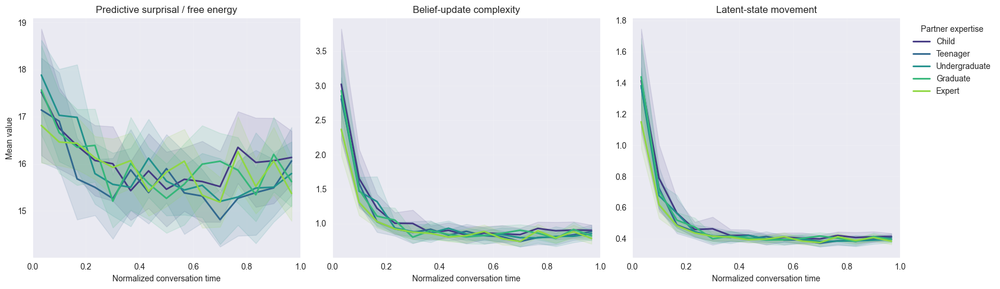

In [101]:
N_BINS = 15

trajectory = fep_events.copy()
trajectory["time_bin"] = pd.cut(
    trajectory["normalized_time"],
    bins=np.linspace(0, 1, N_BINS + 1),
    labels=False,
    include_lowest=True,
)
trajectory["time"] = (
    trajectory["time_bin"] + 0.5
) / N_BINS

conversation_bins = (
    trajectory
    .groupby(
        [
            "dataset",
            "conversation_id",
            "level_label",
            "time",
        ],
        observed=True,
        as_index=False,
    )[
        [
            "predictive_surprisal",
            "complexity_kl",
            "latent_update_norm",
        ]
    ]
    .mean()
)

plot_metrics = {
    "predictive_surprisal": "Predictive surprisal / free energy",
    "complexity_kl": "Belief-update complexity",
    "latent_update_norm": "Latent-state movement",
}

fig, axes = plt.subplots(1, 3, figsize=(17, 5))

for ax, (metric, title) in zip(axes, plot_metrics.items()):
    summary = (
        conversation_bins
        .groupby(
            ["level_label", "time"],
            observed=True,
        )[metric]
        .agg(mean="mean", sem="sem")
        .reset_index()
    )

    for level in LEVEL_ORDER:
        d = (
            summary[
                summary["level_label"].astype(str).eq(level)
            ]
            .sort_values("time")
        )

        lower = d["mean"] - 1.96 * d["sem"]
        upper = d["mean"] + 1.96 * d["sem"]

        ax.plot(
            d["time"],
            d["mean"],
            color=COLORS[level],
            linewidth=2,
            label=level.title(),
        )
        ax.fill_between(
            d["time"],
            lower,
            upper,
            color=COLORS[level],
            alpha=0.12,
        )

    ax.set_title(title)
    ax.set_xlabel("Normalized conversation time")
    ax.set_xlim(0, 1)
    ax.grid(alpha=0.15)

axes[0].set_ylabel("Mean value")
axes[-1].legend(
    title="Partner expertise",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    frameon=False,
)

plt.tight_layout()
plt.show()

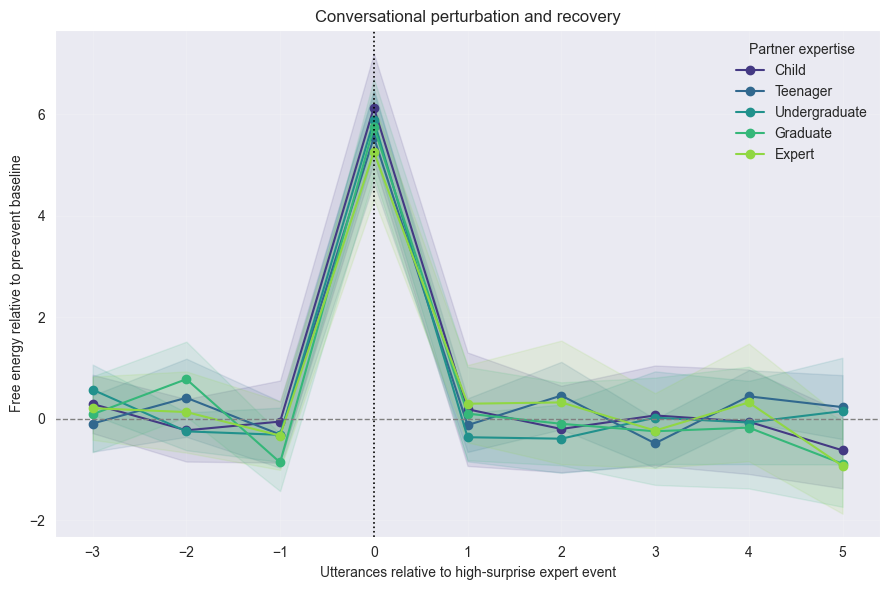

In [102]:
PRE = 3
POST = 5
QUANTILE = 0.90

records = []

for (dataset, conversation_id), group in fep_events.groupby(
    ["dataset", "conversation_id"],
    observed=True,
):
    group = (
        group
        .sort_values("utterance_position")
        .reset_index(drop=True)
    )

    values = group["predictive_surprisal"].to_numpy(float)
    expert = group["fep_role"].eq("expert").to_numpy()

    if expert.sum() < 5:
        continue

    threshold = np.quantile(values[expert], QUANTILE)

    for i in np.flatnonzero(expert & (values >= threshold)):
        if i < PRE or i + POST >= len(group):
            continue

        # Retain local peaks rather than every high-surprise utterance.
        if not (
            values[i] >= values[i - 1]
            and values[i] >= values[i + 1]
        ):
            continue

        baseline = values[i - PRE:i].mean()

        for lag in range(-PRE, POST + 1):
            records.append({
                "dataset": dataset,
                "conversation_id": conversation_id,
                "level_label": str(group.loc[i, "level_label"]),
                "lag": lag,
                "delta_free_energy": values[i + lag] - baseline,
            })

recovery = pd.DataFrame(records)

# Average within conversation first.
recovery_conversation = (
    recovery
    .groupby(
        [
            "dataset",
            "conversation_id",
            "level_label",
            "lag",
        ],
        observed=True,
        as_index=False,
    )["delta_free_energy"]
    .mean()
)

recovery_summary = (
    recovery_conversation
    .groupby(
        ["level_label", "lag"],
        observed=True,
    )["delta_free_energy"]
    .agg(mean="mean", sem="sem")
    .reset_index()
)

fig, ax = plt.subplots(figsize=(9, 6))

for level in LEVEL_ORDER:
    d = (
        recovery_summary[
            recovery_summary["level_label"].eq(level)
        ]
        .sort_values("lag")
    )

    ax.plot(
        d["lag"],
        d["mean"],
        marker="o",
        color=COLORS[level],
        label=level.title(),
    )
    ax.fill_between(
        d["lag"],
        d["mean"] - 1.96 * d["sem"],
        d["mean"] + 1.96 * d["sem"],
        color=COLORS[level],
        alpha=0.12,
    )

ax.axvline(0, color="black", linestyle=":", linewidth=1.2)
ax.axhline(0, color="gray", linestyle="--", linewidth=1)
ax.set_xlabel("Utterances relative to high-surprise expert event")
ax.set_ylabel("Free energy relative to pre-event baseline")
ax.set_title("Conversational perturbation and recovery")
ax.legend(title="Partner expertise", frameon=False)
ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

In [120]:
def leave_one_out_radial_metrics(X):
    X = np.asarray(X, dtype=float)

    norms = np.linalg.norm(X, axis=1, keepdims=True)
    X_unit = X / np.maximum(norms, 1e-12)

    n = len(X_unit)

    if n < 3:
        return {
            "radial_loo_q10": np.nan,
            "radial_loo_median": np.nan,
            "radial_loo_q90": np.nan,
        }

    total_vector = X_unit.sum(axis=0)
    radial_distances = []

    for i in range(n):
        loo_centroid = (
            total_vector - X_unit[i]
        ) / (n - 1)

        centroid_norm = np.linalg.norm(
            loo_centroid
        )

        if centroid_norm <= 1e-12:
            radial_distances.append(np.nan)
            continue

        centroid_direction = (
            loo_centroid / centroid_norm
        )

        distance = (
            1.0
            - X_unit[i] @ centroid_direction
        )

        radial_distances.append(distance)

    radial_distances = np.asarray(
        radial_distances
    )

    return {
        "radial_loo_q10": np.nanquantile(
            radial_distances, 0.10
        ),
        "radial_loo_median": np.nanmedian(
            radial_distances
        ),
        "radial_loo_q90": np.nanquantile(
            radial_distances, 0.90
        ),
    }

In [121]:
radial_loo_records = []

for (dataset, conversation_id), group in geometry_utterances.groupby(
    ["dataset", "conversation_id"],
    observed=True,
    sort=False,
):
    embedding_indices = group[
        "embedding_idx"
    ].to_numpy(dtype=int)

    metrics = leave_one_out_radial_metrics(
        E_utterances[embedding_indices]
    )

    radial_loo_records.append({
        "dataset": dataset,
        "video_id": group["video_id"].iloc[0],
        "conversation_id": conversation_id,
        "level": group["level"].iloc[0],
        "level_label": group["level_label"].iloc[0],
        "n_utterances": len(group),
        **metrics,
    })

radial_loo_summary = pd.DataFrame(
    radial_loo_records
)

display(radial_loo_summary.head())

,dataset,video_id,conversation_id,level,level_label,n_utterances,radial_loo_q10,radial_loo_median,radial_loo_q90
0,wired,talia,wired_Talia_12,0,child,20,0.439955,0.564694,0.739800
1,wired,talia,wired_Talia_13,1,teenager,45,0.391515,0.575834,0.792715
2,wired,talia,wired_Talia_14,2,undergraduate,38,0.292469,0.441624,0.798526
3,wired,talia,wired_Talia_15,3,graduate,35,0.277555,0.515834,0.810310
4,wired,talia,wired_Talia_16,4,expert,43,0.281640,0.502145,0.724641


In [123]:
import numpy as np
import pandas as pd

def calculate_loo_radial_metrics(X):
    X = np.asarray(X, dtype=float)

    X_unit = X / np.maximum(
        np.linalg.norm(X, axis=1, keepdims=True),
        1e-12,
    )

    n = len(X_unit)

    if n < 3:
        return {
            "radial_loo_q10": np.nan,
            "radial_loo_median": np.nan,
            "radial_loo_q90": np.nan,
        }

    total_vector = X_unit.sum(axis=0)
    radial_distances = np.full(n, np.nan)

    for i in range(n):
        loo_centroid = (
            total_vector - X_unit[i]
        ) / (n - 1)

        centroid_norm = np.linalg.norm(
            loo_centroid
        )

        if centroid_norm > 1e-12:
            centroid_direction = (
                loo_centroid / centroid_norm
            )

            radial_distances[i] = np.clip(
                1.0
                - X_unit[i] @ centroid_direction,
                0.0,
                2.0,
            )

    return {
        "radial_loo_q10": np.nanquantile(
            radial_distances, 0.10
        ),
        "radial_loo_median": np.nanmedian(
            radial_distances
        ),
        "radial_loo_q90": np.nanquantile(
            radial_distances, 0.90
        ),
    }


radial_records = []

for (dataset, conversation_id), group in (
    geometry_utterances.groupby(
        ["dataset", "conversation_id"],
        observed=True,
        sort=False,
    )
):
    embedding_indices = group[
        "embedding_idx"
    ].to_numpy(dtype=int)

    metrics = calculate_loo_radial_metrics(
        E_utterances[embedding_indices]
    )

    radial_records.append({
        "dataset": dataset,
        "video_id": group["video_id"].iloc[0],
        "conversation_id": conversation_id,
        "level": group["level"].iloc[0],
        "level_label": str(
            group["level_label"].iloc[0]
        ),
        "n_utterances": len(group),
        **metrics,
    })

radial_loo_summary = pd.DataFrame(
    radial_records
)

display(radial_loo_summary.head())

,dataset,video_id,conversation_id,level,level_label,n_utterances,radial_loo_q10,radial_loo_median,radial_loo_q90
0,wired,talia,wired_Talia_12,0,child,20,0.439955,0.564694,0.739800
1,wired,talia,wired_Talia_13,1,teenager,45,0.391515,0.575834,0.792715
2,wired,talia,wired_Talia_14,2,undergraduate,38,0.292469,0.441624,0.798526
3,wired,talia,wired_Talia_15,3,graduate,35,0.277555,0.515834,0.810310
4,wired,talia,wired_Talia_16,4,expert,43,0.281640,0.502145,0.724641


In [124]:
radial_analysis = radial_loo_summary.merge(
    conversation_geometry[
        [
            "dataset",
            "conversation_id",
            "radial_distance_q90",
        ]
    ],
    on=["dataset", "conversation_id"],
    how="left",
    validate="one_to_one",
)

gap_map = {
    "expert": 0,
    "graduate": 1,
    "undergraduate": 2,
    "teenager": 3,
    "child": 4,
}

radial_analysis["gap_score"] = (
    radial_analysis["level_label"]
    .map(gap_map)
    .astype(float)
)

radial_analysis["gap_c"] = (
    radial_analysis["gap_score"]
    - radial_analysis["gap_score"].mean()
)

radial_analysis["log_n_utterances"] = np.log(
    radial_analysis["n_utterances"]
)

radial_analysis["log_n_c"] = (
    radial_analysis["log_n_utterances"]
    - radial_analysis["log_n_utterances"].mean()
)

radial_analysis["video_group"] = (
    radial_analysis["dataset"].astype(str)
    + "::"
    + radial_analysis["video_id"].astype(str)
)

radial_analysis["level_label"] = pd.Categorical(
    radial_analysis["level_label"],
    categories=[
        "expert",
        "graduate",
        "undergraduate",
        "teenager",
        "child",
    ],
    ordered=True,
)

display(radial_analysis.head())

,dataset,video_id,conversation_id,level,level_label,n_utterances,radial_loo_q10,radial_loo_median,radial_loo_q90,radial_distance_q90,gap_score,gap_c,log_n_utterances,log_n_c,video_group
0,wired,talia,wired_Talia_12,0,child,20,0.439955,0.564694,0.739800,0.662824,4.0,2.0,2.995732,-0.796022,wired::talia
1,wired,talia,wired_Talia_13,1,teenager,45,0.391515,0.575834,0.792715,0.731757,3.0,1.0,3.806662,0.014908,wired::talia
2,wired,talia,wired_Talia_14,2,undergraduate,38,0.292469,0.441624,0.798526,0.797004,2.0,0.0,3.637586,-0.154168,wired::talia
3,wired,talia,wired_Talia_15,3,graduate,35,0.277555,0.515834,0.810310,0.757923,1.0,-1.0,3.555348,-0.236406,wired::talia
4,wired,talia,wired_Talia_16,4,expert,43,0.281640,0.502145,0.724641,0.681728,0.0,-2.0,3.761200,-0.030554,wired::talia


In [125]:
import statsmodels.formula.api as smf

OUTCOME = "radial_loo_q90"

model_df = radial_analysis[
    [
        OUTCOME,
        "gap_c",
        "log_n_c",
        "video_group",
        "level_label",
    ]
].dropna().copy()

outcome_mean = model_df[OUTCOME].mean()
outcome_sd = model_df[OUTCOME].std(ddof=1)

model_df["outcome_z"] = (
    model_df[OUTCOME] - outcome_mean
) / outcome_sd

# Unadjusted sensitivity model
radial_model_unadjusted = smf.mixedlm(
    "outcome_z ~ gap_c",
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=True,
    method="lbfgs",
)

# Primary length-adjusted model
radial_model_adjusted = smf.mixedlm(
    "outcome_z ~ gap_c + log_n_c",
    data=model_df,
    groups=model_df["video_group"],
    re_formula="1",
).fit(
    reml=True,
    method="lbfgs",
)

print(radial_model_adjusted.summary())

         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: outcome_z
No. Observations: 105     Method:             REML     
No. Groups:       21      Scale:              1.0085   
Min. group size:  5       Log-Likelihood:     -151.6759
Max. group size:  5       Converged:          Yes      
Mean group size:  5.0                                  
-------------------------------------------------------
             Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------
Intercept     0.000    0.098  0.000 1.000 -0.192  0.192
gap_c         0.029    0.073  0.393 0.694 -0.115  0.173
log_n_c      -0.280    0.222 -1.259 0.208 -0.716  0.156
Group Var     0.000    0.048                           



/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [126]:
def extract_gap_result(model, model_name):
    beta = model.fe_params["gap_c"]
    se = model.bse["gap_c"]
    ci = model.conf_int().loc["gap_c"]

    return {
        "model": model_name,

        # Change in outcome SD per one-level increase in gap
        "gap_beta_sd": beta,
        "gap_se": se,
        "ci_lower": ci.iloc[0],
        "ci_upper": ci.iloc[1],
        "p_value": model.pvalues["gap_c"],

        # Child is four gap levels above expert
        "child_expert_difference_sd": 4 * beta,

        # Convert child–expert contrast back to radial-distance units
        "child_expert_difference_raw": (
            4 * beta * outcome_sd
        ),

        "converged": model.converged,
    }


radial_model_results = pd.DataFrame([
    extract_gap_result(
        radial_model_unadjusted,
        "Unadjusted",
    ),
    extract_gap_result(
        radial_model_adjusted,
        "Length-adjusted",
    ),
])

display(radial_model_results)

,model,gap_beta_sd,gap_se,ci_lower,ci_upper,p_value,child_expert_difference_sd,child_expert_difference_raw,converged
0,Unadjusted,0.059013,0.069096,-0.076414,0.194439,0.393070,0.236051,0.008916,True
1,Length-adjusted,0.028820,0.073331,-0.114907,0.172547,0.694309,0.115281,0.004355,True


In [127]:
radial_video_fe = smf.ols(
    (
        "outcome_z ~ "
        "gap_c + log_n_c + C(video_group)"
    ),
    data=model_df,
).fit(
    cov_type="cluster",
    cov_kwds={
        "groups": model_df["video_group"],
        "use_correction": True,
    },
)

print(
    radial_video_fe.summary().tables[1]
)

print(
    "\nMixed-model gap coefficient:",
    radial_model_adjusted.params["gap_c"],
)

print(
    "Video-fixed-effect gap coefficient:",
    radial_video_fe.params["gap_c"],
)

                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               0.0791      0.031      2.587      0.010       0.019       0.139
C(video_group)[T.wired::blockchain]    -1.0222      0.231     -4.423      0.000      -1.475      -0.569
C(video_group)[T.wired::crispr]        -0.5412      0.218     -2.479      0.013      -0.969      -0.113
C(video_group)[T.wired::dimension]      0.0976      0.117      0.836      0.403      -0.131       0.326
C(video_group)[T.wired::fractal]       -0.2681      0.044     -6.131      0.000      -0.354      -0.182
C(video_group)[T.wired::gravity]        0.0548      0.222      0.247      0.805      -0.380       0.490
C(video_group)[T.wired::hacking]       -0.4976      0.017    -28.566      0.000      -0.532      -0.463
C(video_group)[T.wired::infinity]      -0.9858      0.024    -40

/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 22, but rank is 2
  warnings.warn('covariance of constraints does not have full '


In [128]:
radial_model_results

,model,gap_beta_sd,gap_se,ci_lower,ci_upper,p_value,child_expert_difference_sd,child_expert_difference_raw,converged
0,Unadjusted,0.059013,0.069096,-0.076414,0.194439,0.393070,0.236051,0.008916,True
1,Length-adjusted,0.028820,0.073331,-0.114907,0.172547,0.694309,0.115281,0.004355,True


In [129]:
import numpy as np
import pandas as pd

def loo_radial_distances(X):
    X = np.asarray(X, dtype=float)

    X_unit = X / np.maximum(
        np.linalg.norm(X, axis=1, keepdims=True),
        1e-12,
    )

    n = len(X_unit)

    if n < 3:
        return np.full(n, np.nan)

    total_vector = X_unit.sum(axis=0)

    # One leave-one-out centroid vector per utterance.
    loo_centroids = total_vector - X_unit

    loo_norms = np.linalg.norm(
        loo_centroids,
        axis=1,
        keepdims=True,
    )

    loo_directions = (
        loo_centroids
        / np.maximum(loo_norms, 1e-12)
    )

    radial_distances = (
        1.0
        - np.sum(
            X_unit * loo_directions,
            axis=1,
        )
    )

    return np.clip(
        radial_distances,
        0.0,
        2.0,
    )


radial_frames = []

for (dataset, conversation_id), group in (
    geometry_utterances.groupby(
        ["dataset", "conversation_id"],
        observed=True,
        sort=False,
    )
):
    group = group.reset_index(drop=True)

    embedding_indices = group[
        "embedding_idx"
    ].to_numpy(dtype=int)

    radial_distance = loo_radial_distances(
        E_utterances[embedding_indices]
    )

    scored = group[
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
            "speaker_role",
            "utterance_id",
            "text",
        ]
    ].copy()

    scored["radial_distance_loo"] = (
        radial_distance
    )

    radial_frames.append(scored)

radial_utterances = pd.concat(
    radial_frames,
    ignore_index=True,
)

In [130]:
radial_conversation_profiles = (
    radial_utterances
    .groupby(
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level",
            "level_label",
        ],
        observed=True,
        as_index=False,
    )
    .agg(
        n_utterances=(
            "radial_distance_loo",
            "size",
        ),
        radial_q10=(
            "radial_distance_loo",
            lambda x: x.quantile(0.10),
        ),
        radial_q25=(
            "radial_distance_loo",
            lambda x: x.quantile(0.25),
        ),
        radial_q50=(
            "radial_distance_loo",
            "median",
        ),
        radial_q75=(
            "radial_distance_loo",
            lambda x: x.quantile(0.75),
        ),
        radial_q90=(
            "radial_distance_loo",
            lambda x: x.quantile(0.90),
        ),
    )
)

radial_conversation_profiles[
    "radial_tail_extension"
] = (
    radial_conversation_profiles["radial_q90"]
    - radial_conversation_profiles["radial_q50"]
)

radial_conversation_profiles[
    "radial_interdecile_range"
] = (
    radial_conversation_profiles["radial_q90"]
    - radial_conversation_profiles["radial_q10"]
)

radial_conversation_profiles[
    "radial_tail_core_ratio"
] = (
    radial_conversation_profiles[
        "radial_tail_extension"
    ]
    / (
        radial_conversation_profiles[
            "radial_q50"
        ]
        + 1e-8
    )
)

display(radial_conversation_profiles.head())

,dataset,video_id,conversation_id,level,level_label,n_utterances,radial_q10,radial_q25,radial_q50,radial_q75,radial_q90,radial_tail_extension,radial_interdecile_range,radial_tail_core_ratio
0,wired,astro,wired_astro_12,0,child,46,0.347831,0.417651,0.515572,0.645919,0.763361,0.247789,0.415530,0.480610
1,wired,astro,wired_astro_13,1,teenager,50,0.373895,0.470675,0.540438,0.648831,0.786905,0.246466,0.413010,0.456049
2,wired,astro,wired_astro_14,2,undergraduate,49,0.263821,0.333290,0.441524,0.604186,0.775854,0.334330,0.512032,0.757218
3,wired,astro,wired_astro_15,3,graduate,56,0.319505,0.363247,0.476504,0.640147,0.792118,0.315613,0.472613,0.662351
4,wired,astro,wired_astro_16,4,expert,39,0.317452,0.358196,0.420181,0.537228,0.674207,0.254026,0.356755,0.604564


In [131]:
quantile_grid = np.linspace(
    0.05,
    0.95,
    19,
)

curve_records = []

group_columns = [
    "dataset",
    "video_id",
    "conversation_id",
    "level",
    "level_label",
]

for group_key, group in radial_utterances.groupby(
    group_columns,
    observed=True,
):
    values = (
        group["radial_distance_loo"]
        .dropna()
        .to_numpy()
    )

    quantile_values = np.quantile(
        values,
        quantile_grid,
    )

    metadata = dict(
        zip(group_columns, group_key)
    )

    for probability, value in zip(
        quantile_grid,
        quantile_values,
    ):
        curve_records.append({
            **metadata,
            "quantile": probability,
            "radial_distance": value,
        })

radial_quantile_curves = pd.DataFrame(
    curve_records
)

radial_curve_summary = (
    radial_quantile_curves
    .groupby(
        ["level", "level_label", "quantile"],
        observed=True,
    )["radial_distance"]
    .agg(
        mean="mean",
        sem="sem",
        n_conversations="count",
    )
    .reset_index()
)

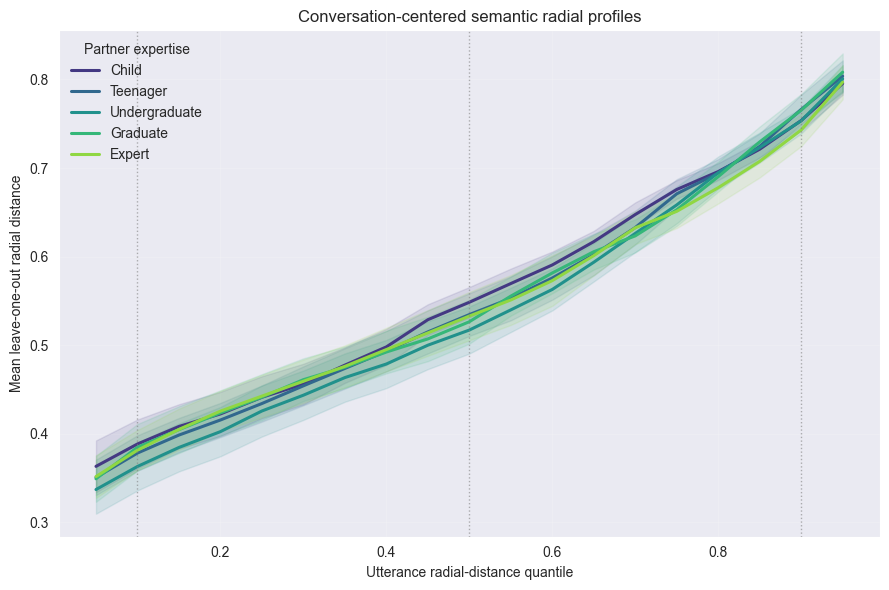

In [132]:
import matplotlib.pyplot as plt
import seaborn as sns

LEVEL_ORDER = [
    "child",
    "teenager",
    "undergraduate",
    "graduate",
    "expert",
]

LEVEL_ORDER = [
    level for level in LEVEL_ORDER
    if level in radial_curve_summary[
        "level_label"
    ].astype(str).unique()
]

COLORS = dict(zip(
    LEVEL_ORDER,
    sns.color_palette(
        "viridis",
        len(LEVEL_ORDER),
    ),
))

fig, ax = plt.subplots(figsize=(9, 6))

for level in LEVEL_ORDER:
    subset = (
        radial_curve_summary[
            radial_curve_summary[
                "level_label"
            ].astype(str).eq(level)
        ]
        .sort_values("quantile")
    )

    x = subset["quantile"].to_numpy(float)
    mean = subset["mean"].to_numpy(float)
    sem = subset["sem"].to_numpy(float)

    ax.plot(
        x,
        mean,
        linewidth=2.2,
        color=COLORS[level],
        label=level.title(),
    )

    ax.fill_between(
        x,
        mean - 1.96 * sem,
        mean + 1.96 * sem,
        color=COLORS[level],
        alpha=0.12,
    )

for quantile in [0.10, 0.50, 0.90]:
    ax.axvline(
        quantile,
        color="gray",
        linestyle=":",
        linewidth=1,
        alpha=0.6,
    )

ax.set_xlabel("Utterance radial-distance quantile")
ax.set_ylabel(
    "Mean leave-one-out radial distance"
)
ax.set_title(
    "Conversation-centered semantic radial profiles"
)
ax.legend(
    title="Partner expertise",
    frameon=False,
)
ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

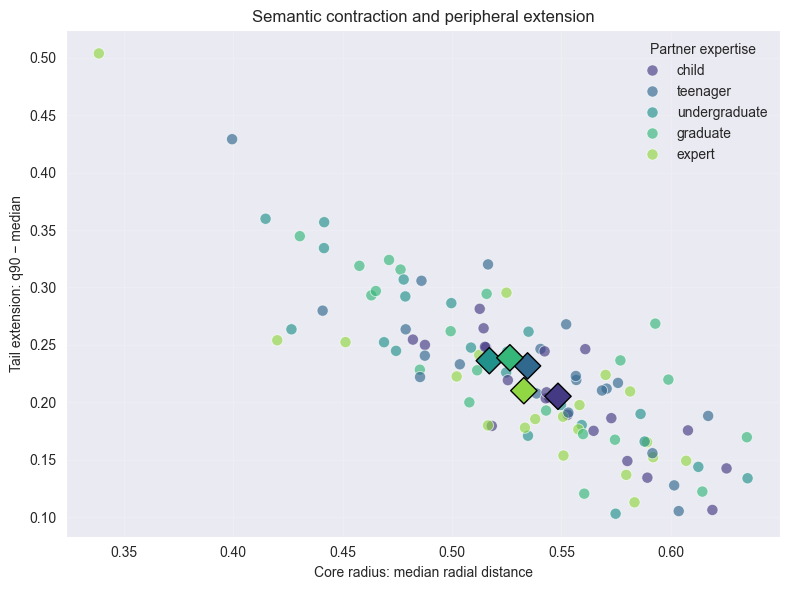

In [133]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.scatterplot(
    data=radial_conversation_profiles,
    x="radial_q50",
    y="radial_tail_extension",
    hue="level_label",
    hue_order=LEVEL_ORDER,
    palette=COLORS,
    s=65,
    alpha=0.65,
    ax=ax,
)

level_means = (
    radial_conversation_profiles
    .groupby(
        "level_label",
        observed=True,
    )[
        [
            "radial_q50",
            "radial_tail_extension",
        ]
    ]
    .mean()
    .reset_index()
)

sns.scatterplot(
    data=level_means,
    x="radial_q50",
    y="radial_tail_extension",
    hue="level_label",
    hue_order=LEVEL_ORDER,
    palette=COLORS,
    marker="D",
    s=180,
    edgecolor="black",
    linewidth=1,
    legend=False,
    ax=ax,
)

ax.set_xlabel(
    "Core radius: median radial distance"
)
ax.set_ylabel(
    "Tail extension: q90 − median"
)
ax.set_title(
    "Semantic contraction and peripheral extension"
)
ax.legend(
    title="Partner expertise",
    frameon=False,
)
ax.grid(alpha=0.15)

plt.tight_layout()
plt.show()

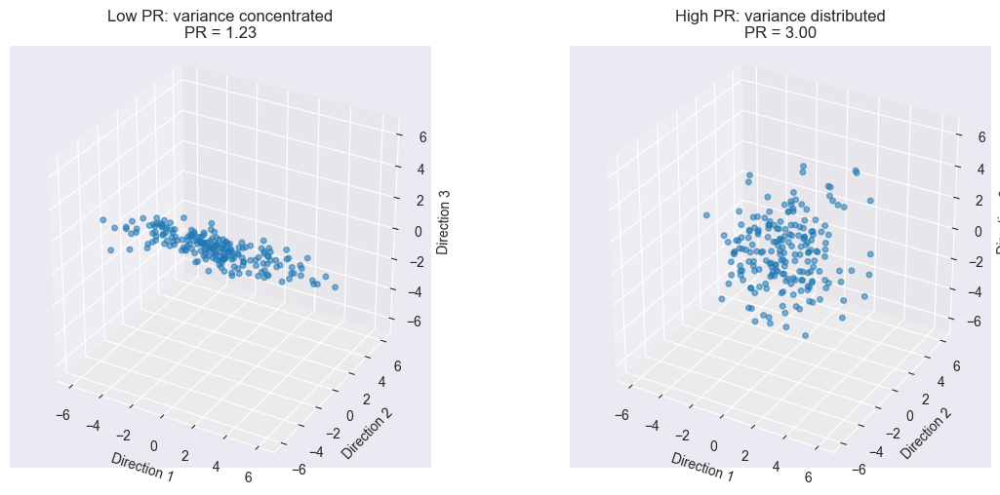

In [136]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

rng = np.random.default_rng(7)
n = 200

# Equal total variance, differently distributed across directions
low_eigenvalues  = np.array([9.0, 0.7, 0.3])
high_eigenvalues = np.array([10/3, 10/3, 10/3])

low = rng.normal(size=(n, 3)) * np.sqrt(low_eigenvalues)
high = rng.normal(size=(n, 3)) * np.sqrt(high_eigenvalues)

def theoretical_pr(eigenvalues):
    return eigenvalues.sum()**2 / np.square(eigenvalues).sum()

fig = plt.figure(figsize=(12, 5))

for i, (points, eigenvalues, label) in enumerate([
    (low, low_eigenvalues, "Low PR: variance concentrated"),
    (high, high_eigenvalues, "High PR: variance distributed"),
], start=1):

    ax = fig.add_subplot(1, 2, i, projection="3d")

    ax.scatter(
        points[:, 0],
        points[:, 1],
        points[:, 2],
        s=16,
        alpha=0.55,
    )

    ax.set_title(
        f"{label}\nPR = {theoretical_pr(eigenvalues):.2f}"
    )
    ax.set_xlabel("Direction 1")
    ax.set_ylabel("Direction 2")
    ax.set_zlabel("Direction 3")
    ax.set_xlim(-7, 7)
    ax.set_ylim(-7, 7)
    ax.set_zlim(-7, 7)
    ax.set_box_aspect((1, 1, 1))

plt.tight_layout()
plt.show()

## bias corrected PR

In [138]:
%env TOKENIZERS_PARALLELISM=false

env: TOKENIZERS_PARALLELISM=false


In [139]:
%pip install -q dimensionality


[notice] A new release of pip is available: 25.3 -> 26.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [140]:
import numpy as np
import pandas as pd

from dimensionality import participation_ratio
from sklearn.preprocessing import normalize

GROUP_COLS = [
    "dataset",
    "video_id",
    "level_label",
]

records = []

for group_values, group in geometry_utterances.groupby(
    GROUP_COLS,
    observed=True,
    sort=False,
):
    indices = group["embedding_idx"].astype(int).to_numpy()

    # Keep this normalization if your original PR used
    # unit-normalized embeddings.
    X = normalize(
        np.asarray(E_utterances[indices]),
        norm="l2",
        axis=1,
    )

    # Do not subtract X.mean(axis=0)
    result = participation_ratio(
        X,
        return_all=True,
    )

    record = dict(zip(GROUP_COLS, group_values))

    record.update({
        "n_utterances": len(X),
        "pr_naive_package": result["naive"],
        "pr_row_corrected": result["row"],
        "pr_both_corrected": result["both"],
    })

    records.append(record)

pr_corrected = pd.DataFrame(records)

display(
    pr_corrected.groupby(
        "level_label",
        observed=True,
    )[
        [
            "n_utterances",
            "pr_naive_package",
            "pr_row_corrected",
        ]
    ].mean()
)

,n_utterances,pr_naive_package,pr_row_corrected
level_label,,,
child,37.904762,17.638250,36.894578
expert,62.190476,27.319173,53.182862
graduate,46.571429,21.970261,45.714773
teenager,45.190476,19.434343,38.322807
undergraduate,52.333333,22.907194,44.191547


In [141]:
import statsmodels.formula.api as smf

gap_map = {
    "expert": 0,
    "graduate": 1,
    "undergraduate": 2,
    "teenager": 3,
    "child": 4,
}

pr_model_data = pr_corrected.copy()

pr_model_data["expertise_gap"] = (
    pr_model_data["level_label"].map(gap_map)
)

pr_model_data["match_id"] = (
    pr_model_data["dataset"].astype(str)
    + "::"
    + pr_model_data["video_id"].astype(str)
)

pr_model_data["pr_row_z"] = (
    pr_model_data["pr_row_corrected"]
    - pr_model_data["pr_row_corrected"].mean()
) / pr_model_data["pr_row_corrected"].std(ddof=0)

pr_model_data["expertise_gap_z"] = (
    pr_model_data["expertise_gap"]
    - pr_model_data["expertise_gap"].mean()
) / pr_model_data["expertise_gap"].std(ddof=0)

pr_row_model = smf.ols(
    "pr_row_z ~ expertise_gap_z + C(match_id)",
    data=pr_model_data,
).fit(
    cov_type="cluster",
    cov_kwds={
        "groups": pr_model_data["match_id"]
    },
)

print(
    pr_row_model.summary().tables[1]
)

                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                           -0.5155   9.75e-16  -5.29e+14      0.000      -0.516      -0.516
C(match_id)[T.wired::blockchain]     0.8640   2.68e-15   3.23e+14      0.000       0.864       0.864
C(match_id)[T.wired::crispr]        -0.2837   1.05e-15   -2.7e+14      0.000      -0.284      -0.284
C(match_id)[T.wired::dimension]      0.2554   1.15e-15   2.22e+14      0.000       0.255       0.255
C(match_id)[T.wired::fractal]       -0.0086   1.09e-15  -7.83e+12      0.000      -0.009      -0.009
C(match_id)[T.wired::gravity]        1.3842   1.21e-15   1.14e+15      0.000       1.384       1.384
C(match_id)[T.wired::hacking]        0.8698   9.83e-16   8.85e+14      0.000       0.870       0.870
C(match_id)[T.wired::infinity]      -0.3230   1.02e-15  -3.16e+14      0.000      -0.323   

/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 21, but rank is 1
  warnings.warn('covariance of constraints does not have full '


In [142]:
pr_row_model_t = smf.ols(
    "pr_row_z ~ expertise_gap_z + C(match_id)",
    data=pr_model_data,
).fit(
    cov_type="cluster",
    cov_kwds={
        "groups": pr_model_data["match_id"],
        "use_correction": True,
        "df_correction": True,
    },
    use_t=True,
)

print(
    pr_row_model_t.summary().tables[1]
)

                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                           -0.5155   9.75e-16  -5.29e+14      0.000      -0.516      -0.516
C(match_id)[T.wired::blockchain]     0.8640   2.68e-15   3.23e+14      0.000       0.864       0.864
C(match_id)[T.wired::crispr]        -0.2837   1.05e-15   -2.7e+14      0.000      -0.284      -0.284
C(match_id)[T.wired::dimension]      0.2554   1.15e-15   2.22e+14      0.000       0.255       0.255
C(match_id)[T.wired::fractal]       -0.0086   1.09e-15  -7.83e+12      0.000      -0.009      -0.009
C(match_id)[T.wired::gravity]        1.3842   1.21e-15   1.14e+15      0.000       1.384       1.384
C(match_id)[T.wired::hacking]        0.8698   9.83e-16   8.85e+14      0.000       0.870       0.870
C(match_id)[T.wired::infinity]      -0.3230   1.02e-15  -3.16e+14      0.000      -0.323   

/Users/yume/PycharmProjects/horizons_2/.venv/lib/python3.12/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 21, but rank is 1
  warnings.warn('covariance of constraints does not have full '


Bias-corrected participation ratio decreased significantly as the expertise gap increased, β=−0.518, SE=0.113, 95% CI [−0.739,−0.296], indicating that expert-level conversations occupied a greater number of effective semantic directions even after correcting for differences in utterance count.

SyntaxError: invalid character '−' (U+2212) (771294453.py, line 1)

## how PR evolved. cumulative, rolling

In [144]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from dimensionality import participation_ratio


# Primary settings
ROLLING_WINDOW = 12
ROLLING_STEP = 2
SHIFT_CONTEXT = 6

MIN_CUMULATIVE = 8

CUMULATIVE_PROGRESS = np.round(
    np.arange(0.20, 1.001, 0.05),
    2,
)


def row_corrected_pr(X):
    """
    Bias-corrected participation ratio for sampled rows.

    X must not be mean-centered. E_utterances is already
    unit-normalized, so no additional preprocessing is needed.
    """
    X = np.asarray(X, dtype=np.float64)

    if X.ndim != 2 or len(X) < 4:
        return np.nan

    result = participation_ratio(
        X,
        return_all=True,
    )

    return float(result["row"])


def centroid_cosine_shift(X_before, X_after):
    """
    Directional distance between the centroids before and after
    a possible semantic boundary.
    """
    before = np.mean(X_before, axis=0)
    after = np.mean(X_after, axis=0)

    denominator = (
        np.linalg.norm(before)
        * np.linalg.norm(after)
    )

    if denominator <= 1e-12:
        return np.nan

    similarity = np.clip(
        np.dot(before, after) / denominator,
        -1.0,
        1.0,
    )

    return float(1.0 - similarity)

In [145]:
cumulative_records = []
local_records = []
shift_records = []

GROUP_COLUMNS = [
    "dataset",
    "conversation_id",
]

for group_key, group in geometry_utterances.groupby(
    GROUP_COLUMNS,
    observed=True,
    sort=False,
):
    dataset, conversation_id = group_key

    group = (
        group
        .sort_values(
            "embedding_idx",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    embedding_indices = (
        group["embedding_idx"]
        .to_numpy(dtype=int)
    )

    X = np.asarray(
        E_utterances[embedding_indices],
        dtype=np.float64,
    )

    n = len(X)

    metadata = {
        "dataset": dataset,
        "conversation_id": conversation_id,
        "n_utterances": n,
    }

    for column in [
        "video_id",
        "file_number",
        "level",
        "level_label",
    ]:
        if column in group.columns:
            value = group[column].iloc[0]

            if column == "level_label":
                value = str(value).lower()

            metadata[column] = value

    # ---------------------------------------------------------
    # 1. Cumulative dimensionality
    # ---------------------------------------------------------

    for target_progress in CUMULATIVE_PROGRESS:
        stop = int(
            np.ceil(target_progress * n)
        )

        if stop < MIN_CUMULATIVE:
            continue

        cumulative_records.append({
            **metadata,
            "progress_target": target_progress,
            "progress_actual": stop / n,
            "n_observed": stop,
            "cumulative_pr": row_corrected_pr(
                X[:stop]
            ),
        })

    # ---------------------------------------------------------
    # 2. Rolling/local dimensionality
    # ---------------------------------------------------------

    if n >= ROLLING_WINDOW:
        starts = list(
            range(
                0,
                n - ROLLING_WINDOW + 1,
                ROLLING_STEP,
            )
        )

        # Always include the final window
        final_start = n - ROLLING_WINDOW

        if starts[-1] != final_start:
            starts.append(final_start)

        for start in starts:
            stop = start + ROLLING_WINDOW

            midpoint = (
                start
                + (ROLLING_WINDOW - 1) / 2
            )

            local_records.append({
                **metadata,
                "window_start": start,
                "window_stop": stop,
                "progress": midpoint / (n - 1),
                "local_pr": row_corrected_pr(
                    X[start:stop]
                ),
            })

    # ---------------------------------------------------------
    # 3. Before/after centroid shift
    # ---------------------------------------------------------

    if n >= 2 * SHIFT_CONTEXT:
        boundaries = list(
            range(
                SHIFT_CONTEXT,
                n - SHIFT_CONTEXT + 1,
                ROLLING_STEP,
            )
        )

        final_boundary = n - SHIFT_CONTEXT

        if boundaries[-1] != final_boundary:
            boundaries.append(final_boundary)

        for boundary in boundaries:
            X_before = X[
                boundary - SHIFT_CONTEXT:
                boundary
            ]

            X_after = X[
                boundary:
                boundary + SHIFT_CONTEXT
            ]

            shift_records.append({
                **metadata,
                "boundary": boundary,
                "progress": (
                    boundary - 0.5
                ) / (n - 1),
                "centroid_shift": (
                    centroid_cosine_shift(
                        X_before,
                        X_after,
                    )
                ),
            })


cumulative_pr_time = pd.DataFrame(
    cumulative_records
)

local_pr_time = pd.DataFrame(
    local_records
)

centroid_shift_time = pd.DataFrame(
    shift_records
)

print(
    "Cumulative observations:",
    len(cumulative_pr_time),
)

print(
    "Local windows:",
    len(local_pr_time),
)

print(
    "Potential switch boundaries:",
    len(centroid_shift_time),
)

display(cumulative_pr_time.head())
display(local_pr_time.head())
display(centroid_shift_time.head())

Cumulative observations: 1705
Local windows: 2063
Potential switch boundaries: 2063


,dataset,conversation_id,n_utterances,video_id,file_number,level,level_label,progress_target,progress_actual,n_observed,cumulative_pr
0,wired,wired_Talia_12,20,talia,12,0,child,0.40,0.40,8,29.121298
1,wired,wired_Talia_12,20,talia,12,0,child,0.45,0.45,9,38.506945
2,wired,wired_Talia_12,20,talia,12,0,child,0.50,0.50,10,32.948339
3,wired,wired_Talia_12,20,talia,12,0,child,0.55,0.55,11,36.007076
4,wired,wired_Talia_12,20,talia,12,0,child,0.60,0.60,12,37.754203


,dataset,conversation_id,n_utterances,video_id,file_number,level,level_label,window_start,window_stop,progress,local_pr
0,wired,wired_Talia_12,20,talia,12,0,child,0,12,0.289474,37.754203
1,wired,wired_Talia_12,20,talia,12,0,child,2,14,0.394737,44.623473
2,wired,wired_Talia_12,20,talia,12,0,child,4,16,0.500000,38.071667
3,wired,wired_Talia_12,20,talia,12,0,child,6,18,0.605263,40.959136
4,wired,wired_Talia_12,20,talia,12,0,child,8,20,0.710526,34.749431


,dataset,conversation_id,n_utterances,video_id,file_number,level,level_label,boundary,progress,centroid_shift
0,wired,wired_Talia_12,20,talia,12,0,child,6,0.289474,0.402241
1,wired,wired_Talia_12,20,talia,12,0,child,8,0.394737,0.448280
2,wired,wired_Talia_12,20,talia,12,0,child,10,0.500000,0.503807
3,wired,wired_Talia_12,20,talia,12,0,child,12,0.605263,0.421639
4,wired,wired_Talia_12,20,talia,12,0,child,14,0.710526,0.393337


In [146]:
display(
    cumulative_pr_time[
        "cumulative_pr"
    ].describe()
)

display(
    local_pr_time[
        "local_pr"
    ].describe()
)

print(
    "Nonfinite local estimates:",
    (~np.isfinite(
        local_pr_time["local_pr"]
    )).sum()
)

print(
    "Local estimates below 1:",
    (
        local_pr_time["local_pr"] < 1
    ).sum()
)

count    1705.000000
mean       38.673034
std        12.123950
min         8.517206
25%        30.752806
50%        37.304179
75%        46.275084
max       112.410040
Name: cumulative_pr, dtype: float64

count    2063.000000
mean       35.808221
std        14.157156
min         7.719430
25%        25.890199
50%        33.239063
75%        43.016853
max       126.187363
Name: local_pr, dtype: float64

Nonfinite local estimates: 0
Local estimates below 1: 0


In [147]:
display(
    cumulative_pr_time[
        "cumulative_pr"
    ].describe()
)

display(
    local_pr_time[
        "local_pr"
    ].describe()
)

print(
    "Nonfinite local estimates:",
    (~np.isfinite(
        local_pr_time["local_pr"]
    )).sum()
)

print(
    "Local estimates below 1:",
    (
        local_pr_time["local_pr"] < 1
    ).sum()
)

count    1705.000000
mean       38.673034
std        12.123950
min         8.517206
25%        30.752806
50%        37.304179
75%        46.275084
max       112.410040
Name: cumulative_pr, dtype: float64

count    2063.000000
mean       35.808221
std        14.157156
min         7.719430
25%        25.890199
50%        33.239063
75%        43.016853
max       126.187363
Name: local_pr, dtype: float64

Nonfinite local estimates: 0
Local estimates below 1: 0


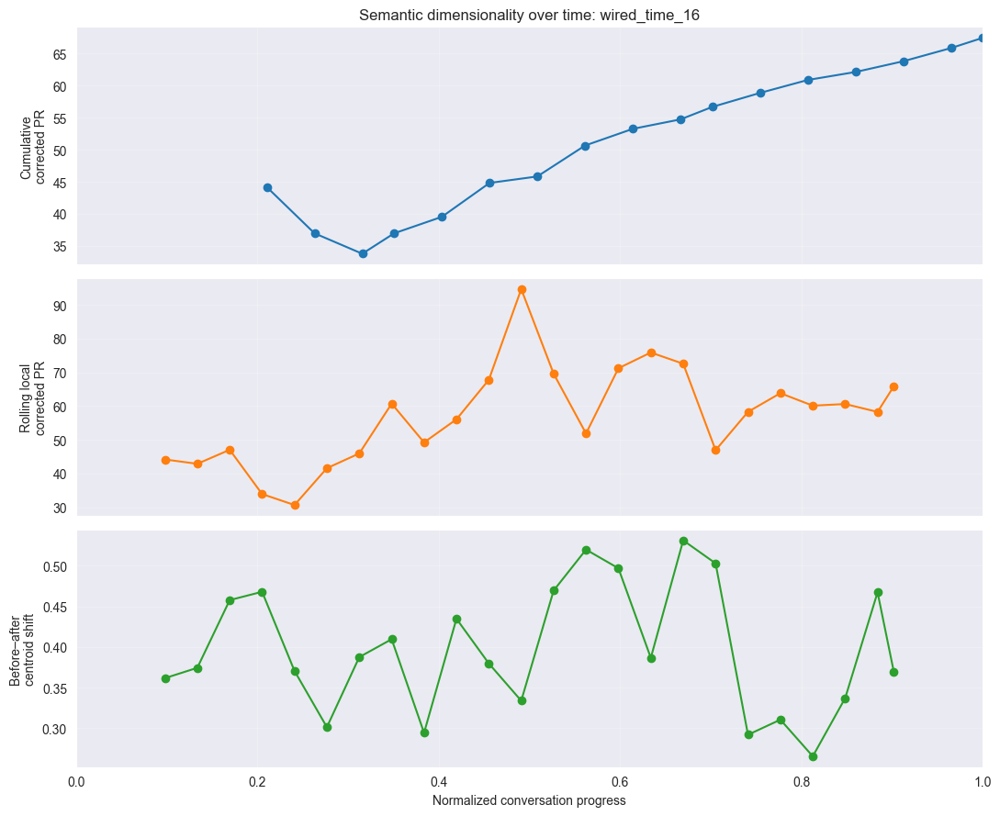

In [148]:
#look at one convo
EXAMPLE_VIDEO = "time"
EXAMPLE_LEVEL = "expert"

selection = cumulative_pr_time[
    (
        cumulative_pr_time["video_id"]
        == EXAMPLE_VIDEO
    )
    &
    (
        cumulative_pr_time["level_label"]
        == EXAMPLE_LEVEL
    )
]

if selection.empty:
    raise ValueError(
        "No conversation matched the selected "
        "video and level."
    )

example_conversation = (
    selection["conversation_id"].iloc[0]
)

cum_example = cumulative_pr_time[
    cumulative_pr_time["conversation_id"]
    == example_conversation
]

local_example = local_pr_time[
    local_pr_time["conversation_id"]
    == example_conversation
]

shift_example = centroid_shift_time[
    centroid_shift_time["conversation_id"]
    == example_conversation
]

fig, axes = plt.subplots(
    3,
    1,
    figsize=(11, 9),
    sharex=True,
)

axes[0].plot(
    cum_example["progress_actual"],
    cum_example["cumulative_pr"],
    marker="o",
)

axes[0].set_ylabel(
    "Cumulative\ncorrected PR"
)

axes[0].set_title(
    f"Semantic dimensionality over time: "
    f"{example_conversation}"
)

axes[1].plot(
    local_example["progress"],
    local_example["local_pr"],
    marker="o",
    color="tab:orange",
)

axes[1].set_ylabel(
    "Rolling local\ncorrected PR"
)

axes[2].plot(
    shift_example["progress"],
    shift_example["centroid_shift"],
    marker="o",
    color="tab:green",
)

axes[2].set_ylabel(
    "Before–after\ncentroid shift"
)

axes[2].set_xlabel(
    "Normalized conversation progress"
)

for ax in axes:
    ax.grid(alpha=0.2)
    ax.set_xlim(0, 1)

plt.tight_layout()
plt.show()

## avg PR trajectories by convo level

In [156]:
# ============================================================
# Select complete matched videos with sufficiently long
# conversations at every expertise level
# ============================================================

MIN_TRAJECTORY_UTTERANCES = 20
CUMULATIVE_START = 0.40
MIN_BIN_COVERAGE = 0.50

conversation_meta = (
    cumulative_pr_time[
        [
            "dataset",
            "video_id",
            "conversation_id",
            "level_label",
            "n_utterances",
        ]
    ]
    .drop_duplicates()
)

eligible_matches = (
    conversation_meta
    .groupby(
        ["dataset", "video_id"],
        observed=True,
    )
    .agg(
        n_levels=(
            "level_label",
            "nunique",
        ),
        minimum_n=(
            "n_utterances",
            "min",
        ),
    )
    .reset_index()
)

eligible_matches = eligible_matches[
    (
        eligible_matches["n_levels"] == 5
    )
    &
    (
        eligible_matches["minimum_n"]
        >= MIN_TRAJECTORY_UTTERANCES
    )
][
    ["dataset", "video_id"]
]

print(
    "Eligible matched videos:",
    len(eligible_matches),
)


def keep_eligible_matches(df):
    return df.merge(
        eligible_matches,
        on=["dataset", "video_id"],
        how="inner",
        validate="many_to_one",
    )


cumulative_plot_data = keep_eligible_matches(
    cumulative_pr_time
)

local_plot_source = keep_eligible_matches(
    local_pr_time
)

shift_plot_source = keep_eligible_matches(
    centroid_shift_time
)

# At 40% of a 20-utterance conversation, at least
# eight utterances have been observed.
cumulative_plot_data = cumulative_plot_data[
    cumulative_plot_data["progress_target"]
    >= CUMULATIVE_START
].copy()

Eligible matched videos: 18


In [157]:
TIME_EDGES = np.linspace(0, 1, 11)


def conversation_time_bins(
    df,
    time_column,
    value_column,
):
    binned = df[
        [
            "dataset",
            "conversation_id",
            "level_label",
            time_column,
            value_column,
        ]
    ].dropna().copy()

    binned["time_bin"] = pd.cut(
        binned[time_column],
        bins=TIME_EDGES,
        labels=False,
        include_lowest=True,
    )

    binned = (
        binned
        .groupby(
            [
                "dataset",
                "conversation_id",
                "level_label",
                "time_bin",
            ],
            observed=True,
        )[value_column]
        .mean()
        .reset_index()
    )

    binned["progress"] = (
        binned["time_bin"] + 0.5
    ) / 10

    # Number of eligible conversations at each level
    total_conversations = (
        conversation_meta
        .merge(
            eligible_matches,
            on=["dataset", "video_id"],
            how="inner",
        )
        .groupby(
            "level_label",
            observed=True,
        )["conversation_id"]
        .nunique()
        .rename("total_conversations")
    )

    # Number contributing to each plotted bin
    coverage = (
        binned
        .groupby(
            ["level_label", "time_bin"],
            observed=True,
        )["conversation_id"]
        .nunique()
        .rename("n_conversations")
        .reset_index()
    )

    coverage = coverage.merge(
        total_conversations.reset_index(),
        on="level_label",
        how="left",
    )

    coverage["coverage"] = (
        coverage["n_conversations"]
        / coverage["total_conversations"]
    )

    binned = binned.merge(
        coverage,
        on=["level_label", "time_bin"],
        how="left",
    )

    return binned[
        binned["coverage"]
        >= MIN_BIN_COVERAGE
    ].copy()


local_plot_data = conversation_time_bins(
    local_plot_source,
    "progress",
    "local_pr",
)

shift_plot_data = conversation_time_bins(
    shift_plot_source,
    "progress",
    "centroid_shift",
)

In [163]:
MIN_BIN_COVERAGE = 0.0

local_plot_data = conversation_time_bins(
    local_plot_source,
    "progress",
    "local_pr",
)

shift_plot_data = conversation_time_bins(
    shift_plot_source,
    "progress",
    "centroid_shift",
)

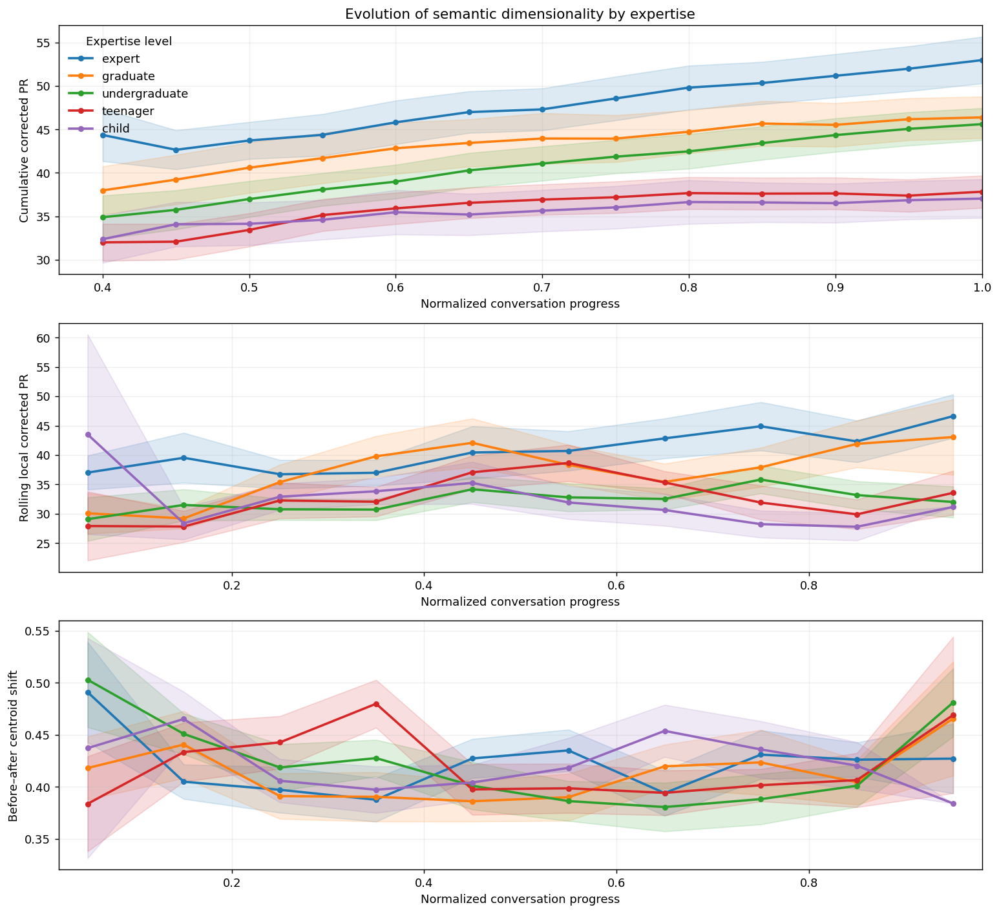

In [164]:
import numpy as np
import matplotlib.pyplot as plt

from IPython.display import Image, display


level_order = [
    "expert",
    "graduate",
    "undergraduate",
    "teenager",
    "child",
]

level_colors = {
    level: plt.cm.tab10(index)
    for index, level in enumerate(level_order)
}


def summarize_trajectory(
    df,
    time_column,
    value_column,
):
    return (
        df.dropna(
            subset=[
                "level_label",
                time_column,
                value_column,
            ]
        )
        .groupby(
            [
                "level_label",
                time_column,
            ],
            observed=True,
        )[value_column]
        .agg(
            mean="mean",
            sd="std",
            n="count",
        )
        .reset_index()
        .assign(
            se=lambda x:
                x["sd"] / np.sqrt(x["n"])
        )
    )


cumulative_summary = summarize_trajectory(
    cumulative_plot_data,
    "progress_target",
    "cumulative_pr",
)

local_summary = summarize_trajectory(
    local_plot_data,
    "progress",
    "local_pr",
)

shift_summary = summarize_trajectory(
    shift_plot_data,
    "progress",
    "centroid_shift",
)


plot_specs = [
    {
        "data": cumulative_summary,
        "time": "progress_target",
        "ylabel": "Cumulative corrected PR",
    },
    {
        "data": local_summary,
        "time": "progress",
        "ylabel": "Rolling local corrected PR",
    },
    {
        "data": shift_summary,
        "time": "progress",
        "ylabel": "Before–after centroid shift",
    },
]


fig, axes = plt.subplots(
    3,
    1,
    figsize=(12, 11),

    # The measures have different valid temporal ranges.
    sharex=False,
)


for ax, spec in zip(
    axes,
    plot_specs,
):
    summary = spec["data"]
    time_column = spec["time"]

    for level in level_order:
        level_data = (
            summary[
                summary["level_label"]
                .astype(str)
                .str.lower()
                == level
            ]
            .sort_values(time_column)
        )

        if level_data.empty:
            continue

        x = level_data[
            time_column
        ].to_numpy(dtype=float)

        mean = level_data[
            "mean"
        ].to_numpy(dtype=float)

        se = (
            level_data["se"]
            .fillna(0)
            .to_numpy(dtype=float)
        )

        color = level_colors[level]

        ax.plot(
            x,
            mean,
            marker="o",
            linewidth=2,
            markersize=4,
            color=color,
            label=level,
        )

        ax.fill_between(
            x,
            mean - se,
            mean + se,
            color=color,
            alpha=0.15,
        )

    ax.set_ylabel(spec["ylabel"])
    ax.set_xlabel(
        "Normalized conversation progress"
    )
    ax.grid(alpha=0.2)

    # Use the range where this measure actually exists.
    available_times = summary[
        time_column
    ].dropna()

    if len(available_times):
        left = max(
            0,
            available_times.min() - 0.03,
        )

        right = min(
            1,
            available_times.max() + 0.03,
        )

        ax.set_xlim(left, right)


axes[0].set_title(
    "Evolution of semantic dimensionality by expertise"
)

axes[0].legend(
    title="Expertise level",
    frameon=False,
)

plt.tight_layout()

output_path = (
    "semantic_dimensionality_trajectories.png"
)

fig.savefig(
    output_path,
    dpi=130,
    bbox_inches="tight",
    facecolor="white",
)

plt.close(fig)

display(
    Image(
        filename=output_path,
        width=1100,
    )
)

In [167]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import re
import textwrap
import numpy as np
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from dimensionality import participation_ratio


# ------------------------------------------------------------
# Select conversation
# ------------------------------------------------------------

VIDEO_ID = "gravity"
LEVEL_LABEL = "expert"

MIN_PR_UTTERANCES = 12


selected_conversation = (
    geometry_utterances[
        (
            geometry_utterances["video_id"]
            .astype(str)
            == VIDEO_ID
        )
        &
        (
            geometry_utterances["level_label"]
            .astype(str)
            .str.lower()
            == LEVEL_LABEL
        )
    ]
    .sort_values(
        "embedding_idx",
        kind="stable",
    )
    .reset_index(drop=True)
)

if selected_conversation.empty:
    raise ValueError(
        "No conversation matched VIDEO_ID and LEVEL_LABEL."
    )

conversation_id = (
    selected_conversation[
        "conversation_id"
    ].iloc[0]
)

embedding_indices = (
    selected_conversation[
        "embedding_idx"
    ]
    .to_numpy(dtype=int)
)

X_animation = np.asarray(
    E_utterances[embedding_indices],
    dtype=np.float64,
)

n_animation_utterances = len(X_animation)

utterance_text = (
    selected_conversation["text"]
    .astype(str)
    .to_numpy()
)

if "speaker_role" in selected_conversation.columns:
    speaker_roles = (
        selected_conversation[
            "speaker_role"
        ]
        .astype(str)
        .str.lower()
        .to_numpy()
    )
else:
    speaker_roles = np.repeat(
        "speaker",
        n_animation_utterances,
    )


# ------------------------------------------------------------
# Fit PCA once to the complete conversation
# ------------------------------------------------------------

pca_animation = PCA(
    n_components=2,
    svd_solver="full",
)

X_animation_2d = pca_animation.fit_transform(
    X_animation
)

explained = (
    100
    * pca_animation.explained_variance_ratio_
)


# ------------------------------------------------------------
# Calculate full-space cumulative corrected PR
# ------------------------------------------------------------

def calculate_row_corrected_pr(X):
    if len(X) < 4:
        return np.nan

    result = participation_ratio(
        np.asarray(X, dtype=np.float64),
        return_all=True,
    )

    return float(result["row"])


cumulative_pr_animation = np.full(
    n_animation_utterances,
    np.nan,
)

for stop in range(
    MIN_PR_UTTERANCES,
    n_animation_utterances + 1,
):
    cumulative_pr_animation[
        stop - 1
    ] = calculate_row_corrected_pr(
        X_animation[:stop]
    )


print("Conversation:", conversation_id)
print("Utterances:", n_animation_utterances)
print(
    "PCA variance displayed:",
    f"{explained.sum():.1f}%",
)
print(
    "Finite PR estimates:",
    np.isfinite(
        cumulative_pr_animation
    ).sum(),
)

Conversation: wired_gravity_16
Utterances: 131
PCA variance displayed: 13.1%
Finite PR estimates: 120


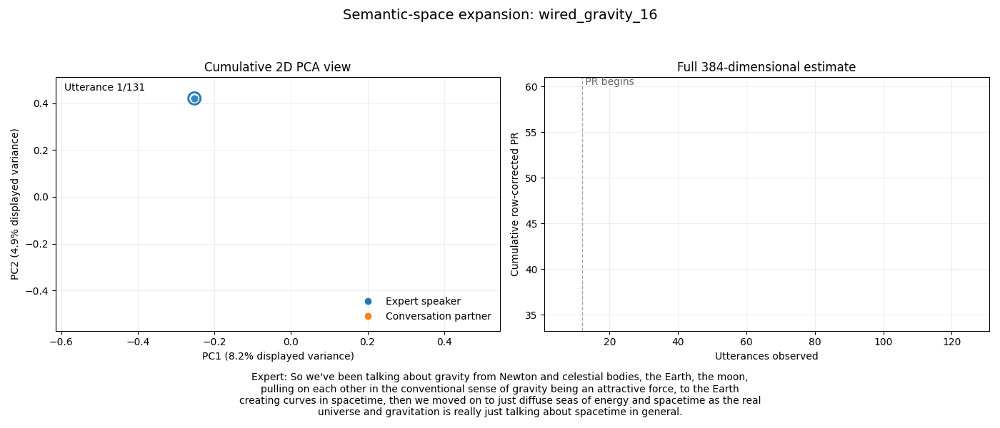

In [168]:
from matplotlib.animation import (
    FuncAnimation,
    PillowWriter,
)
from matplotlib.lines import Line2D
from IPython.display import Image, display


# ------------------------------------------------------------
# Stable plotting ranges
# ------------------------------------------------------------

x_padding = max(
    0.10 * np.ptp(X_animation_2d[:, 0]),
    0.05,
)

y_padding = max(
    0.10 * np.ptp(X_animation_2d[:, 1]),
    0.05,
)

pca_xlim = (
    X_animation_2d[:, 0].min() - x_padding,
    X_animation_2d[:, 0].max() + x_padding,
)

pca_ylim = (
    X_animation_2d[:, 1].min() - y_padding,
    X_animation_2d[:, 1].max() + y_padding,
)

finite_pr = cumulative_pr_animation[
    np.isfinite(cumulative_pr_animation)
]

if len(finite_pr):
    pr_padding = max(
        0.10 * np.ptp(finite_pr),
        1.0,
    )

    pr_ylim = (
        finite_pr.min() - pr_padding,
        finite_pr.max() + pr_padding,
    )
else:
    pr_ylim = (0, 1)


role_colors = {
    "expert": "tab:blue",
    "partner": "tab:orange",
    "speaker": "tab:gray",
}

point_colors = np.array([
    role_colors.get(
        role,
        "tab:gray",
    )
    for role in speaker_roles
])


# ------------------------------------------------------------
# Construct figure
# ------------------------------------------------------------

fig, (
    ax_space,
    ax_pr,
) = plt.subplots(
    1,
    2,
    figsize=(14, 6),
)

fig.suptitle(
    f"Semantic-space expansion: {conversation_id}",
    fontsize=14,
)

# Left: PCA semantic trajectory
trajectory_line, = ax_space.plot(
    [],
    [],
    color="0.60",
    linewidth=1,
    alpha=0.7,
    zorder=1,
)

past_points = ax_space.scatter(
    [],
    [],
    s=42,
    alpha=0.75,
    zorder=2,
)

current_point = ax_space.scatter(
    [],
    [],
    s=150,
    facecolors="none",
    edgecolors="black",
    linewidths=2,
    zorder=3,
)

time_label = ax_space.text(
    0.02,
    0.98,
    "",
    transform=ax_space.transAxes,
    ha="left",
    va="top",
)

ax_space.set_xlim(*pca_xlim)
ax_space.set_ylim(*pca_ylim)

ax_space.set_xlabel(
    f"PC1 ({explained[0]:.1f}% displayed variance)"
)

ax_space.set_ylabel(
    f"PC2 ({explained[1]:.1f}% displayed variance)"
)

ax_space.set_title(
    "Cumulative 2D PCA view"
)

ax_space.grid(alpha=0.2)


# Only include roles actually present
legend_handles = []

for role, label in [
    ("expert", "Expert speaker"),
    ("partner", "Conversation partner"),
    ("speaker", "Speaker"),
]:
    if role in set(speaker_roles):
        legend_handles.append(
            Line2D(
                [0],
                [0],
                marker="o",
                linestyle="none",
                markerfacecolor=role_colors[role],
                markeredgecolor="none",
                markersize=7,
                label=label,
            )
        )

if legend_handles:
    ax_space.legend(
        handles=legend_handles,
        frameon=False,
        loc="lower right",
    )


# Right: full-dimensional cumulative PR
pr_line, = ax_pr.plot(
    [],
    [],
    color="tab:purple",
    linewidth=2.5,
)

pr_current, = ax_pr.plot(
    [],
    [],
    marker="o",
    color="tab:purple",
    markersize=8,
)

ax_pr.axvline(
    MIN_PR_UTTERANCES,
    color="0.65",
    linestyle="--",
    linewidth=1,
)

ax_pr.text(
    MIN_PR_UTTERANCES,
    pr_ylim[1],
    " PR begins",
    color="0.40",
    ha="left",
    va="top",
)

ax_pr.set_xlim(
    1,
    n_animation_utterances,
)

ax_pr.set_ylim(*pr_ylim)

ax_pr.set_xlabel(
    "Utterances observed"
)

ax_pr.set_ylabel(
    "Cumulative row-corrected PR"
)

ax_pr.set_title(
    "Full 384-dimensional estimate"
)

ax_pr.grid(alpha=0.2)


# Current utterance caption
caption = fig.text(
    0.5,
    0.025,
    "",
    ha="center",
    va="bottom",
    fontsize=10,
)

plt.tight_layout(
    rect=[0, 0.13, 1, 0.94]
)


# ------------------------------------------------------------
# Animation update
# ------------------------------------------------------------

def update_animation(frame):
    stop = frame + 1

    visible_points = (
        X_animation_2d[:stop]
    )

    past_points.set_offsets(
        visible_points
    )

    past_points.set_facecolors(
        point_colors[:stop]
    )

    trajectory_line.set_data(
        visible_points[:, 0],
        visible_points[:, 1],
    )

    current_point.set_offsets(
        X_animation_2d[
            frame:
            frame + 1
        ]
    )

    current_point.set_edgecolors(
        point_colors[frame]
    )

    time_label.set_text(
        f"Utterance {stop}/{n_animation_utterances}"
    )

    visible_pr = (
        cumulative_pr_animation[:stop]
    )

    valid = np.isfinite(
        visible_pr
    )

    pr_x = np.arange(
        1,
        stop + 1,
    )[valid]

    pr_y = visible_pr[valid]

    pr_line.set_data(
        pr_x,
        pr_y,
    )

    if np.isfinite(
        cumulative_pr_animation[frame]
    ):
        pr_current.set_data(
            [stop],
            [
                cumulative_pr_animation[
                    frame
                ]
            ],
        )
    else:
        pr_current.set_data(
            [],
            [],
        )

    role = speaker_roles[frame]

    caption.set_text(
        textwrap.fill(
            (
                f"{role.capitalize()}: "
                f"{utterance_text[frame]}"
            ),
            width=105,
        )
    )

    return (
        trajectory_line,
        past_points,
        current_point,
        time_label,
        pr_line,
        pr_current,
        caption,
    )


animation = FuncAnimation(
    fig,
    update_animation,
    frames=n_animation_utterances,
    interval=300,
    repeat=False,
    blit=False,
)


# ------------------------------------------------------------
# Save and display
# ------------------------------------------------------------

safe_conversation_id = re.sub(
    r"[^a-zA-Z0-9_-]+",
    "-",
    str(conversation_id),
)

gif_path = (
    f"semantic-pr-animation-"
    f"{safe_conversation_id}.gif"
)

animation.save(
    gif_path,
    writer=PillowWriter(fps=3),
    dpi=100,
)

plt.close(fig)

display(
    Image(
        filename=gif_path,
        width=1100,
    )
)

In [169]:
conversation_geometry

,dataset,conversation_id,video_id,file_number,level,level_label,n_utterances,n_pairs,n_words,n_turns,...,cumulative_centroid_euclidean_initial,cumulative_centroid_euclidean_final,cumulative_centroid_euclidean_change,cumulative_centroid_euclidean_slope,cumulative_centroid_cosine_mean,cumulative_centroid_cosine_sd,cumulative_centroid_cosine_initial,cumulative_centroid_cosine_final,cumulative_centroid_cosine_change,cumulative_centroid_cosine_slope
0,wired,wired_Talia_12,talia,12,0,child,27,351,315,14,...,0.897596,0.846758,-0.050838,-0.229744,0.500948,0.034300,0.554335,0.466711,-0.087624,-0.396288
1,wired,wired_astro_12,astro,12,0,child,56,1540,647,23,...,1.283079,0.304512,-0.978567,-0.665587,0.349422,0.162196,0.823146,0.170952,-0.652194,-0.516384
2,wired,wired_blockchain_12,blockchain,12,0,child,20,190,191,9,...,1.073887,0.509599,-0.564288,-0.698992,0.481183,0.153069,0.793464,0.368993,-0.424471,-0.570224
3,wired,wired_crispr_12,crispr,12,0,child,21,210,152,12,...,1.035418,1.027541,-0.007878,-0.047266,0.803701,0.009835,0.815056,0.798183,-0.016874,-0.101242
4,wired,wired_dimension_12,dimension,12,0,child,89,3916,689,50,...,1.050145,0.369593,-0.680551,-0.600115,0.411225,0.169331,0.742548,0.241155,-0.501393,-0.568698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,wired,wired_nuclear_16,nuclear,16,4,expert,44,946,849,11,...,1.151112,0.271987,-0.879125,-0.795760,0.323419,0.192233,0.788917,0.148596,-0.640321,-0.591118
101,wired,wired_sensing_16,sensing,16,4,expert,56,1540,882,27,...,1.318837,0.344202,-0.974634,-0.667732,0.404374,0.159175,0.914824,0.232542,-0.682282,-0.475364
102,wired,wired_sleep_16,sleep,16,4,expert,31,465,823,13,...,1.007597,0.344141,-0.663456,-0.640773,0.309803,0.158163,0.507626,0.151573,-0.356053,-0.495031
103,wired,wired_time_16,time,16,4,expert,63,1953,1182,23,...,0.956504,0.228317,-0.728187,-0.417883,0.191283,0.081685,0.557442,0.107746,-0.449696,-0.257887
